<div class="alert alert-block alert-info">
<center> <h1> DATA MINING MDSAA-BA </h1> </center> <br>
<center> PVA PROJECT 2020/2021 </center>

**GROUP AZ:** <br>
- Ana Paulino (20170743) <br>
- Soraia Cunha (20170806)

**Table of Contents** <br>
* [1.Import Libraries](#importlibraries)
* [2.Import Dataset](#importdataset)
* [3. Initial Analysis](#initialanalysis)
* [4. Data Pre-Processing](#datapreprocessing)
    * [4.1 Fill empty cells](#fillemptycells)
    * [4.2. METRIC and NON METRIC FEATURES](#metricandnonmetric)
    * [4.3. Filling Missing Values - 2ND TIME](#fillmissingvalues)
    * [4.4. CATEGORIES OF VARIABLES](#categoriesofvariables)
    * [4.5. REDEFINITION OF METRIC & NON METRIC FEATURES](#redefinitionmetricnonmetric)
    * [4.6. Graphics](#graphics)
    * [4.7. Transforming data type](#transformingdatatype)
    * [4.8. New variables](#newvariables)
    * [4.9. Incoherents](#incoherents)
    * [4.10. Correlation](#correlation)
* [5. Outliers](#outliers)
    * [5.1. IQR](#iqr)
    * [5.2. LOF](#lof)
    * [5.3. Z-Score](#zscore)
    * [5.4. LOF & Z-Score](#lofzscore)
    * [5.5. DBSCAN](#dbscan)
* [6. Standardization](#standardization)
* [7. More relevant features](#features)
* [8. PCA](#pca)
* [9. Clustering](#clustering)
    * [9.1. K-means - all donors dataset](#kmeans)
    * [9.2. Clustering using different perspectives](#perspectives)
    * [9.3. Comparing the cluster algorithms](#comparing)
    * [9.4. K-Prototypes](#kprototypes)
    * [9.5. T-SNE](#tsne)
* [10. Outliers Classification](#classification)
    
    

<hr>
<a class="anchor" id="importlibraries">
    
# 1. Import libraries
    
</a>

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

import math
from datetime import datetime
import calendar
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans
from matplotlib.ticker import MaxNLocator
from sklearn.cluster import AgglomerativeClustering
from sklearn.base import clone
from scipy.cluster.hierarchy import dendrogram
import matplotlib.cm as cm
from sklearn.preprocessing import PowerTransformer
from kmodes.kprototypes import KPrototypes
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

<hr>
<a class="anchor" id="importdataset">
    
# 2. Import dataset
    
</a>

In [2]:
donors=pd.DataFrame(pd.read_csv("donors.csv")) # Load data

<hr>
<a class="anchor" id="initialanalysis">
    
# 3. Initial Analysis
    
</a>

In [3]:
donors.head(50) # checking data

,Unnamed: 0,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,...,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,...,7.741935,95515,0,L,4,E,X,X,X,C
1,1,2014-01-01,BOA,1,CA,91326,,,1972-02-01,0,...,15.666667,148535,0,L,2,G,X,X,X,A
2,2,2010-01-01,AMH,1,NC,27017,,,NaN,0,...,7.481481,15078,1,L,4,E,X,X,X,C
3,3,2007-01-01,BRY,0,CA,95953,,,1948-01-01,0,...,6.812500,172556,1,L,4,E,X,X,X,C
4,4,2006-01-01,,0,FL,33176,,,1940-01-01,0,...,6.864865,7112,1,L,2,F,X,X,X,A
5,5,2014-01-01,CWR,0,AL,35603,,,NaN,0,...,12.750000,47784,0,L,1,F,X,X,X,C
6,6,2007-01-01,DRK,0,IN,46755,,,1980-01-01,0,...,7.642857,62117,1,L,1,E,X,X,X,D
7,7,2014-01-01,NWN,0,LA,70611,,,NaN,0,...,6.200000,109359,1,L,3,E,X,X,X,C
8,8,2008-01-01,LIS,1,IA,51033,,,NaN,0,...,18.090909,75768,1,L,1,F,X,X,X,D
9,9,2014-01-01,MSD,1,TN,37127-,,,1952-11-01,0,...,9.333333,49909,0,L,1,F,X,X,X,B


In [4]:
donors=donors.iloc[0:,1:476]

In [5]:
donors.describe(include="all")

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,...,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
count,95412,95412,95412.000000,95412,95412,95412,95412,71529,95412,95412,...,95412.000000,95412.000000,95412.000000,95412,95412.000000,95412,95412,95412,95412,95280
unique,54,896,NaN,57,19938,2,3,847,6,2,...,NaN,NaN,NaN,1,NaN,4,5,4,5,5
top,2015-01-01,MBC,NaN,CA,85351,,,1968-01-01,0,,...,NaN,NaN,NaN,L,NaN,F,X,X,X,A
freq,15358,4539,NaN,17343,61,94013,93954,1479,61203,88709,...,NaN,NaN,NaN,95412,NaN,46964,95118,95118,95118,34484
mean,NaN,NaN,54.223117,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,13.347786,95778.176959,0.500618,NaN,1.910053,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,953.844476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,10.769997,55284.596094,0.500002,NaN,1.072749,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.285714,1.000000,0.000000,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8.384615,47910.750000,0.000000,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,11.636364,95681.500000,1.000000,NaN,2.000000,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,15.477955,143643.500000,1.000000,NaN,3.000000,NaN,NaN,NaN,NaN,NaN


In [6]:
donors.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95412 entries, 0 to 95411
Columns: 475 entries, ODATEDW to GEOCODE2
dtypes: float64(49), int64(301), object(125)
memory usage: 345.8+ MB


In [7]:
donors.isnull().sum().head(50)# Count missing values

ODATEDW         0
OSOURCE         0
TCODE           0
STATE           0
ZIP             0
MAILCODE        0
PVASTATE        0
DOB         23883
NOEXCH          0
RECINHSE        0
RECP3           0
RECPGVG         0
RECSWEEP        0
MDMAUD          0
DOMAIN          0
HOMEOWNR        0
CHILD03         0
CHILD07         0
CHILD12         0
CHILD18         0
NUMCHLD     83026
INCOME      21286
GENDER          0
WEALTH1     44732
HIT             0
MBCRAFT     52854
MBGARDEN    52854
MBBOOKS     52854
MBCOLECT    52914
MAGFAML     52854
MAGFEM      52854
MAGMALE     52854
PUBGARDN    52854
PUBCULIN    52854
PUBHLTH     52854
PUBDOITY    52854
PUBNEWFN    52854
PUBPHOTO    52854
PUBOPP      52854
DATASRCE        0
MALEMILI        0
MALEVET         0
VIETVETS        0
WWIIVETS        0
LOCALGOV        0
STATEGOV        0
FEDGOV          0
SOLP3           0
SOLIH           0
MAJOR           0
dtype: int64

In [8]:
donors.isnull().sum().tail(50)

RDATE_19    79535
RDATE_20    87524
RDATE_21    85899
RDATE_22    74539
RDATE_23    87553
RDATE_24    77674
RAMNT_3     95170
RAMNT_4     95131
RAMNT_5     95403
RAMNT_6     94636
RAMNT_7     86517
RAMNT_8     73940
RAMNT_9     78678
RAMNT_10    84951
RAMNT_11    80672
RAMNT_12    69712
RAMNT_13    83162
RAMNT_14    72095
RAMNT_15    88150
RAMNT_16    68418
RAMNT_17    86011
RAMNT_18    75634
RAMNT_19    79535
RAMNT_20    87524
RAMNT_21    85899
RAMNT_22    74539
RAMNT_23    87553
RAMNT_24    77674
RAMNTALL        0
NGIFTALL        0
CARDGIFT        0
MINRAMNT        0
MINRDATE        0
MAXRAMNT        0
MAXRDATE        0
LASTGIFT        0
LASTDATE        0
FISTDATE        2
NEXTDATE     9973
TIMELAG      9973
AVGGIFT         0
CONTROLN        0
HPHONE_D        0
RFA_2R          0
RFA_2F          0
RFA_2A          0
MDMAUD_R        0
MDMAUD_F        0
MDMAUD_A        0
GEOCODE2      132
dtype: int64

In [9]:
donors.duplicated().value_counts() # Counting duplicated data

False    95412
dtype: int64

In [10]:
donors.shape # dataframe shape(rows,columns)

(95412, 475)

In [11]:
donors.dtypes.unique() #data types

array([dtype('O'), dtype('int64'), dtype('float64')], dtype=object)

In [12]:
donors=donors[donors.columns[donors.isnull().sum() < 47706]] # eliminate columns with 50% or more of missing values

In [13]:
donors.shape

(95412, 413)

In [14]:
donors.isnull().sum().head(50)# Count missing values again

ODATEDW         0
OSOURCE         0
TCODE           0
STATE           0
ZIP             0
MAILCODE        0
PVASTATE        0
DOB         23883
NOEXCH          0
RECINHSE        0
RECP3           0
RECPGVG         0
RECSWEEP        0
MDMAUD          0
DOMAIN          0
HOMEOWNR        0
CHILD03         0
CHILD07         0
CHILD12         0
CHILD18         0
INCOME      21286
GENDER          0
WEALTH1     44732
HIT             0
DATASRCE        0
MALEMILI        0
MALEVET         0
VIETVETS        0
WWIIVETS        0
LOCALGOV        0
STATEGOV        0
FEDGOV          0
SOLP3           0
SOLIH           0
MAJOR           0
WEALTH2     43823
GEOCODE         0
COLLECT1        0
VETERANS        0
BIBLE           0
CATLG           0
HOMEE           0
PETS            0
CDPLAY          0
STEREO          0
PCOWNERS        0
PHOTO           0
CRAFTS          0
FISHER          0
GARDENIN        0
dtype: int64

In [15]:
# sample=donors.loc[:2000]

In [16]:
# from pandas_profiling import ProfileReport

In [17]:
# sample = donors.sample(5000)
#ProfileReport(sample, minimal=True)


<hr>
<a class="anchor" id="datapreprocessing">
    
# 4. Data Pre-Processing
    
</a>

<hr>
<a class="anchor" id="fillemptycells">
    
## 4.1 Fill empty cells
    
</a>

In [18]:
toreplace = [' ', 'A', 'C']
donors['GENDER'] = donors['GENDER'].replace(toreplace, 'U')
donors['GENDER'].value_counts()

F    51277
M    39094
U     4676
J      365
Name: GENDER, dtype: int64

In [19]:
donors['HOMEOWNR'] = donors['HOMEOWNR'].replace(' ', 'U')
donors['HOMEOWNR'].value_counts()

H    52354
U    43058
Name: HOMEOWNR, dtype: int64

In [20]:
donors['MAILCODE'] = donors['MAILCODE'].replace(' ', 'O')
donors['CHILD03'] = donors['CHILD03'].replace(' ', 'N')
donors['CHILD07'] = donors['CHILD07'].replace(' ', 'N')
donors['CHILD12'] = donors['CHILD12'].replace(' ', 'N')
donors['CHILD18'] = donors['CHILD18'].replace(' ', 'N')

In [21]:
donors['COLLECT1'] = donors['COLLECT1'].replace(' ', 'N')
donors['VETERANS'] = donors['VETERANS'].replace(' ', 'N')
donors['BIBLE'] = donors['BIBLE'].replace(' ', 'N')
donors['CATLG'] = donors['CATLG'].replace(' ', 'N')
donors['HOMEE'] = donors['HOMEE'].replace(' ', 'N')
donors['PETS'] = donors['PETS'].replace(' ', 'N')
donors['CDPLAY'] = donors['CDPLAY'].replace(' ', 'N')
donors['STEREO'] = donors['STEREO'].replace(' ', 'N')
donors['PCOWNERS'] = donors['PCOWNERS'].replace(' ', 'N')
donors['PHOTO'] = donors['PHOTO'].replace(' ', 'N')
donors['CRAFTS'] = donors['CRAFTS'].replace(' ', 'N')
donors['FISHER'] = donors['FISHER'].replace(' ', 'N')
donors['GARDENIN'] = donors['BOATS'].replace(' ', 'N')
donors['BOATS'] = donors['BOATS'].replace(' ', 'N')
donors['WALKER'] = donors['WALKER'].replace(' ', 'N')
donors['KIDSTUFF'] = donors['KIDSTUFF'].replace(' ', 'N')
donors['CARDS'] = donors['CARDS'].replace(' ', 'N')
donors['PLATES'] = donors['PLATES'].replace(' ', 'N')

In [22]:
donors.replace(" ", np.nan, inplace=True)

In [23]:
donors['MAJOR'].value_counts()

X    294
Name: MAJOR, dtype: int64

In [24]:
donors['CHILD03'] = donors['CHILD03'].replace(np.nan, 'N')
donors['CHILD07'] = donors['CHILD07'].replace(np.nan, 'N')
donors['CHILD12'] = donors['CHILD12'].replace(np.nan, 'N')
donors['CHILD18'] = donors['CHILD18'].replace(np.nan, 'N')

donors['SOLP3'] = donors['SOLP3'].replace(np.nan, 'Default')
donors['SOLIH'] = donors['SOLIH'].replace(np.nan, 'Default')
donors['MAJOR'] = donors['MAJOR'].replace(np.nan, 'N')
donors['PEPSTRFL'] = donors['PEPSTRFL'].replace(np.nan, 'N')

In [25]:
donors['PEPSTRFL'].value_counts()

N    50143
X    45269
Name: PEPSTRFL, dtype: int64

In [26]:
donors.isnull().sum().tail(50)
# osource nan
# PVASTATE nan
# RECINHSE nan
# RECP3    nan   
# RECPGVG   nan  
# RECSWEEP   nan
# DOMAIN nan -> replace mode
# DATASRCE nan -> replace
# GEOCODE nan

RFA_2           0
RFA_3        1950
RFA_4        2312
RFA_5       33590
RFA_6        3557
RFA_7        8874
RFA_8        3511
RFA_9       11245
RFA_10      32748
RFA_11      10422
RFA_12       8923
RFA_13      40219
RFA_14      18867
RFA_15      65477
RFA_16      20417
RFA_17      27650
RFA_18      21263
RFA_19      24492
RFA_20      50200
RFA_21      35212
RFA_22      25648
RFA_23      56274
RFA_24      36973
CARDPROM        0
MAXADATE        0
NUMPROM         0
CARDPM12        0
NUMPRM12        0
RAMNTALL        0
NGIFTALL        0
CARDGIFT        0
MINRAMNT        0
MINRDATE        0
MAXRAMNT        0
MAXRDATE        0
LASTGIFT        0
LASTDATE        0
FISTDATE        2
NEXTDATE     9973
TIMELAG      9973
AVGGIFT         0
CONTROLN        0
HPHONE_D        0
RFA_2R          0
RFA_2F          0
RFA_2A          0
MDMAUD_R        0
MDMAUD_F        0
MDMAUD_A        0
GEOCODE2      319
dtype: int64

In [27]:
donors.shape

(95412, 413)

In [28]:
donors=donors[donors.columns[donors.isnull().sum() < 47706]]

In [29]:
donors.shape

(95412, 403)

<a class="anchor" id="metricandnonmetric">

## 4.2. METRIC and NON METRIC FEATURES

</a>

In [30]:
metric_features=donors.select_dtypes(exclude=[object]).columns

In [31]:
len(metric_features)

313

In [32]:
non_metric_features=donors.select_dtypes(include=[object]).columns
len(non_metric_features)

90

<a class="anchor" id="fillmissingvalues">

## 4.3. Filling Missing Values - 2ND TIME

</a>

In [33]:
donors_c=donors.copy()

In [34]:
donors_c.median()  # we use median because isn´t influenced by the outliers

TCODE           1.000000
INCOME          4.000000
WEALTH1         6.000000
HIT             0.000000
DATASRCE        3.000000
                ...     
TIMELAG         6.000000
AVGGIFT        11.636364
CONTROLN    95681.500000
HPHONE_D        1.000000
RFA_2F          2.000000
Length: 314, dtype: float64

In [35]:
modes = donors_c[non_metric_features].mode().loc[0]
modes

ODATEDW     2015-01-01
OSOURCE            MBC
STATE               CA
ZIP              85351
MAILCODE             O
               ...    
RFA_2A               F
MDMAUD_R             X
MDMAUD_F             X
MDMAUD_A             X
GEOCODE2             A
Name: 0, Length: 90, dtype: object

In [36]:
donors_c.fillna(donors_c.median(), inplace=True)

In [37]:
donors_c.fillna(modes, inplace=True)

In [38]:
donors_c.isna().sum().head(50)

ODATEDW     0
OSOURCE     0
TCODE       0
STATE       0
ZIP         0
MAILCODE    0
DOB         0
NOEXCH      0
MDMAUD      0
DOMAIN      0
HOMEOWNR    0
CHILD03     0
CHILD07     0
CHILD12     0
CHILD18     0
INCOME      0
GENDER      0
WEALTH1     0
HIT         0
DATASRCE    0
MALEMILI    0
MALEVET     0
VIETVETS    0
WWIIVETS    0
LOCALGOV    0
STATEGOV    0
FEDGOV      0
SOLP3       0
SOLIH       0
MAJOR       0
WEALTH2     0
COLLECT1    0
VETERANS    0
BIBLE       0
CATLG       0
HOMEE       0
PETS        0
CDPLAY      0
STEREO      0
PCOWNERS    0
PHOTO       0
CRAFTS      0
FISHER      0
GARDENIN    0
BOATS       0
WALKER      0
KIDSTUFF    0
CARDS       0
PLATES      0
PEPSTRFL    0
dtype: int64

In [39]:
donors_c.isna().sum().head(50) # checking how many NaNs we still have

ODATEDW     0
OSOURCE     0
TCODE       0
STATE       0
ZIP         0
MAILCODE    0
DOB         0
NOEXCH      0
MDMAUD      0
DOMAIN      0
HOMEOWNR    0
CHILD03     0
CHILD07     0
CHILD12     0
CHILD18     0
INCOME      0
GENDER      0
WEALTH1     0
HIT         0
DATASRCE    0
MALEMILI    0
MALEVET     0
VIETVETS    0
WWIIVETS    0
LOCALGOV    0
STATEGOV    0
FEDGOV      0
SOLP3       0
SOLIH       0
MAJOR       0
WEALTH2     0
COLLECT1    0
VETERANS    0
BIBLE       0
CATLG       0
HOMEE       0
PETS        0
CDPLAY      0
STEREO      0
PCOWNERS    0
PHOTO       0
CRAFTS      0
FISHER      0
GARDENIN    0
BOATS       0
WALKER      0
KIDSTUFF    0
CARDS       0
PLATES      0
PEPSTRFL    0
dtype: int64

In [40]:
nans_index = donors_c.isna().any(axis=1)
donors_c[nans_index]

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,DOB,NOEXCH,MDMAUD,DOMAIN,...,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2


In [41]:
donors= donors_c

<a class="anchor" id="categoriesofvariables">

## 4.4. CATEGORIES OF VARIABLES

</a>

<font color='darkblue'> Considering the threshold of **|corr| > 0.90** for removing the highly correlated variables. We decided to divide the variables into categories so that it will be easier to check the correlation among them.

***Donor Info***

In [42]:
donorinfo = donors[['ODATEDW', 'OSOURCE', 'TCODE', 'STATE', 'ZIP', 
                   'MAILCODE', 'DOB', 'MDMAUD', 'DOMAIN',
                   'HOMEOWNR', 'CHILD03', 'CHILD07', 'CHILD12', 'CHILD18',
                   'INCOME', 'GENDER', 'HIT', 'MAJOR']]

In [43]:
donorinfo.head()

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,DOB,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,CHILD07,CHILD12,CHILD18,INCOME,GENDER,HIT,MAJOR
0,2009-01-01,GRI,0,IL,61081,O,1957-12-01,XXXX,T2,U,N,N,N,N,4.0,F,0,N
1,2014-01-01,BOA,1,CA,91326,O,1972-02-01,XXXX,S1,H,N,N,N,M,6.0,M,16,N
2,2010-01-01,AMH,1,NC,27017,O,1968-01-01,XXXX,R2,U,N,N,N,N,3.0,M,2,N
3,2007-01-01,BRY,0,CA,95953,O,1948-01-01,XXXX,R2,U,N,N,N,N,1.0,F,2,N
4,2006-01-01,MBC,0,FL,33176,O,1940-01-01,XXXX,S2,H,N,N,N,N,3.0,F,60,N


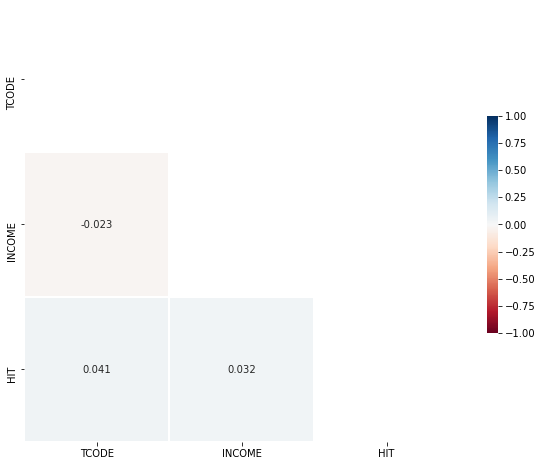

In [44]:
corr = donorinfo.corr(method = 'spearman')

mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 8))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

***Donor interests***

In [45]:
donorinterests = donors[['COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE',
                        'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS', 'PHOTO', 
                        'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER',
                        'KIDSTUFF', 'CARDS', 'PLATES']]

In [46]:
donorinterests.head()

,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES
0,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N
1,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N
2,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N
3,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N
4,N,N,Y,Y,N,N,N,Y,N,N,Y,N,N,N,Y,N,Y,N


***Well-being and House changes***

In [47]:
wellbeing = donors[['WEALTH1', 'WEALTH2', 'MC1', 'MC2', 'MC3']]

In [48]:
wellbeing.head()

,WEALTH1,WEALTH2,MC1,MC2,MC3
0,6.0,5.0,46,54,3
1,9.0,9.0,56,44,9
2,1.0,1.0,38,62,8
3,4.0,0.0,46,54,3
4,2.0,5.0,20,80,4


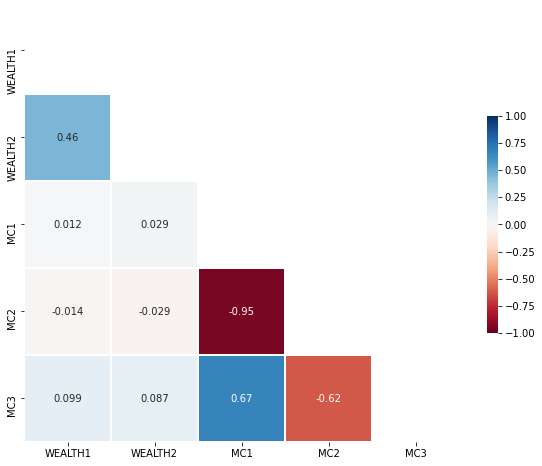

In [49]:
corr = wellbeing.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 8))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

In [50]:
donors = donors.drop(columns=['MC1'])

In [51]:
donors.shape

(95412, 402)

***Others***

In [52]:
others = donors[['DATASRCE', 'MALEMILI', 'MALEVET', 'VIETVETS', 'WWIIVETS',
                'LOCALGOV', 'STATEGOV', 'FEDGOV', 'SOLP3', 'SOLIH',
                'CONTROLN', 'HPHONE_D', 'GEOCODE2']]

In [53]:
others.head()

,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,CONTROLN,HPHONE_D,GEOCODE2
0,3,0,39,34,18,10,2,1,Default,Default,95515,0,C
1,3,0,15,55,11,6,2,1,Default,Default,148535,0,A
2,3,0,20,29,33,6,8,1,Default,Default,15078,1,C
3,3,0,23,14,31,3,0,3,Default,Default,172556,1,C
4,3,1,28,9,53,26,3,2,Default,12,7112,1,A


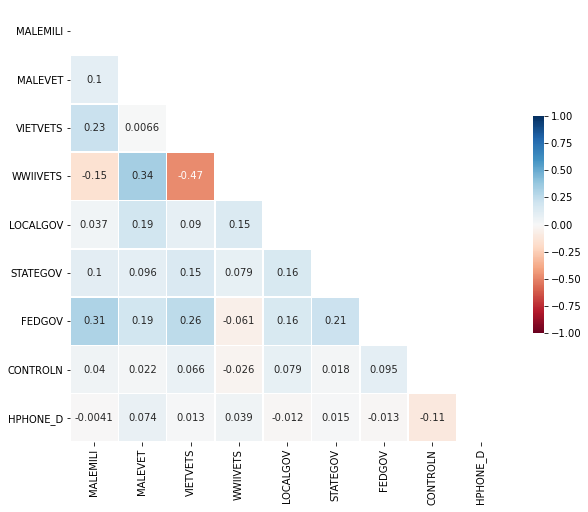

In [54]:
corr = others.corr(method = 'spearman')

mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 8))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

***Neighborhood Other***

In [55]:
neighother = donors[['HC2', 'HC3', 'HC4', 'HC5', 'HC6', 'HC7', 'HC8', 'HC9',
                    'HC10', 'MHUC1', 'MHUC2','ADI','DMA']]

In [56]:
neighother.head()

,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,MHUC1,MHUC2,ADI,DMA
0,31,5,14,14,31,54,46,0,0,6,2,177.0,682.0
1,10,2,26,56,97,99,0,0,0,20,4,13.0,803.0
2,22,3,12,23,50,69,31,0,0,9,2,281.0,518.0
3,38,0,10,19,39,45,55,0,0,16,2,67.0,862.0
4,34,0,1,3,6,33,67,0,0,6,2,127.0,528.0


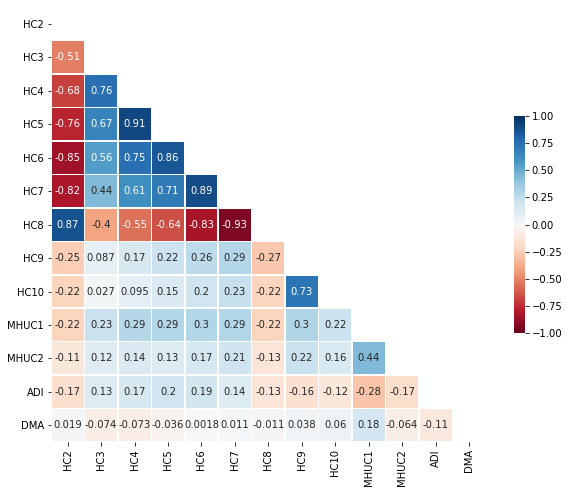

In [57]:
corr = neighother.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 8))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

In [58]:
donors = donors.drop(columns=['HC5','HC7'])

In [59]:
donors.shape

(95412, 400)

***Neighborhood Population***

In [60]:
neighpop = donors[['POP901', 'POP902', 'POP903', 'POP90C1','POP90C2', 'POP90C3',
'POP90C4', 'POP90C5','ETH1','ETH2','ETH3','ETH4','ETH5','ETH6','ETH7','ETH8','ETH9',
'ETH10','ETH11','ETH12','ETH13','ETH14','ETH15','ETH16','ETHC1','ETHC2','ETHC3',
'ETHC4','ETHC5','ETHC6','POBC1','POBC2','LSC1','LSC2','LSC3','LSC4']]

In [61]:
neighpop.head()

,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,...,ETHC3,ETHC4,ETHC5,ETHC6,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4
0,992,264,332,0,35,65,47,53,92,1,...,25,0,0,0,3,74,88,8,0,4
1,3611,940,998,99,0,0,50,50,67,0,...,5,0,0,0,42,39,50,7,27,16
2,7001,2040,2669,0,2,98,49,51,96,2,...,18,0,1,0,2,84,96,3,0,0
3,640,160,219,0,8,92,54,46,61,0,...,13,0,0,0,29,67,56,41,3,0
4,2520,627,761,99,0,0,46,54,2,98,...,0,21,58,19,1,65,99,0,0,0


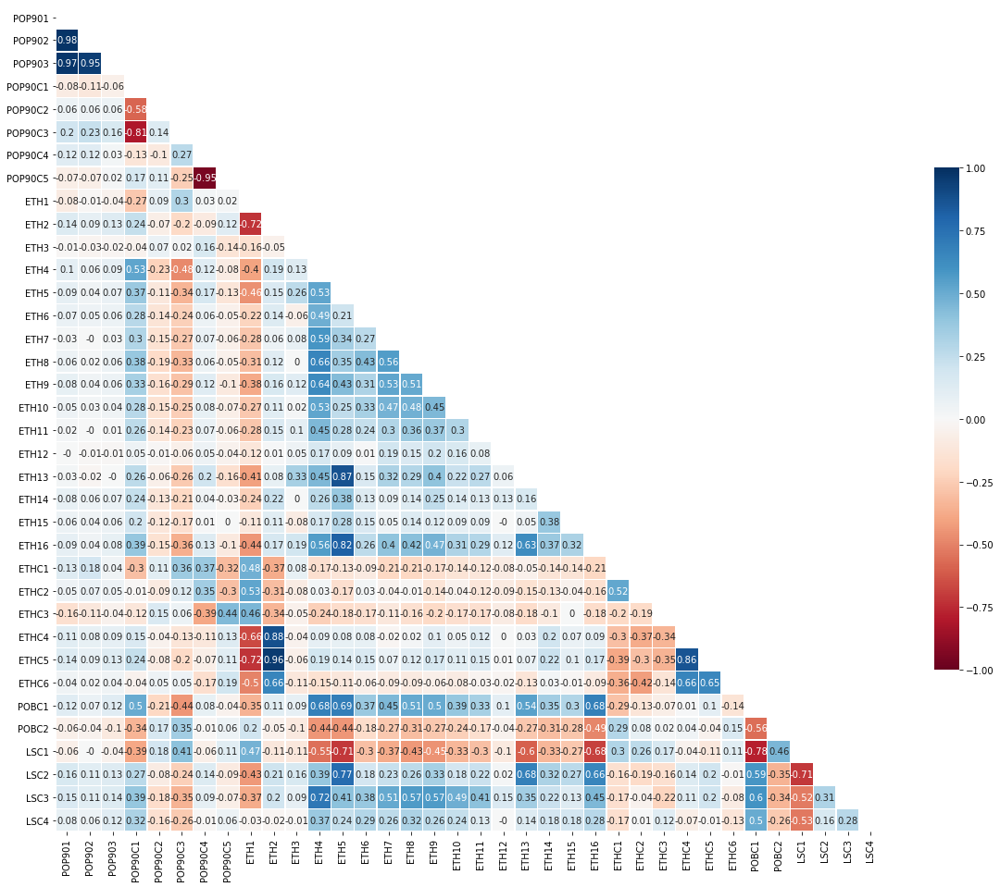

In [62]:
corr = neighpop.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 20))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

In [63]:
donors = donors.drop(columns=['POP902', 'POP903'])

In [64]:
donors = donors.drop(columns=['ETHC5', 'POP90C5'])

In [65]:
donors.shape

(95412, 396)

***Neighborhood Population Age***

In [66]:
neighpopage = donors[['AGE901','AGE902','AGE903','AGE904','AGE905','AGE906',
'AGE907','CHIL1','CHIL2','CHIL3','AGEC1','AGEC2','AGEC3','AGEC4','AGEC5',
'AGEC6','AGEC7','CHILC1','CHILC2','CHILC3','CHILC4','CHILC5','HHAGE1','HHAGE2',
'HHAGE3','AC1','AC2']]

In [67]:
neighpopage.head()

,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,...,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,AC1,AC2
0,39,48,51,40,50,54,25,31,42,27,...,12,11,34,25,18,26,10,23,10,7
1,34,41,43,32,42,45,32,33,46,21,...,11,16,36,22,15,12,1,5,6,5
2,35,43,46,37,45,49,23,35,40,25,...,15,14,30,22,19,25,10,23,6,5
3,32,40,44,34,43,47,25,45,35,20,...,20,17,30,14,19,25,11,23,6,6
4,33,45,50,36,46,50,27,34,43,23,...,13,15,34,19,19,31,7,27,7,11


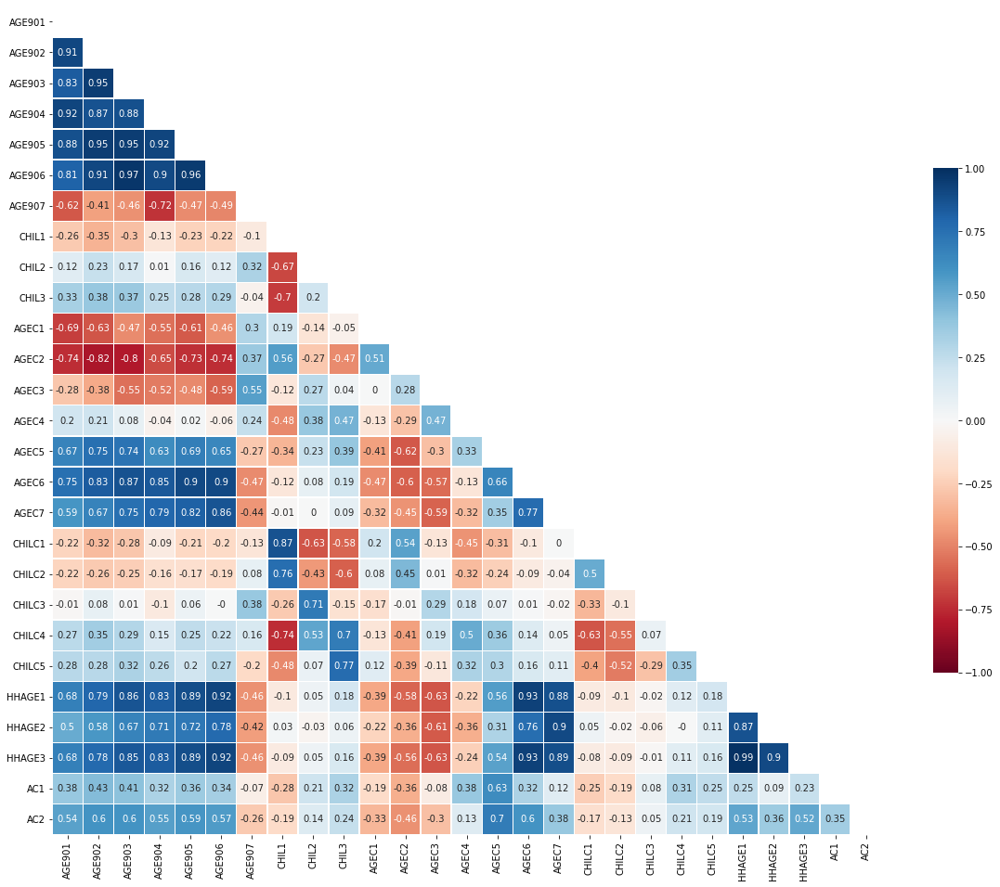

In [68]:
corr = neighpopage.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 20))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

In [69]:
donors = donors.drop(columns=['AGE901', 'AGE902', 'AGE903', 'AGE905', 'AGE906','HHAGE1','HHAGE3','AC1','AC2'])
# AC1 & AC2 are 2 variables that can be represented by AGEC5 & AGEC6

In [70]:
donors.shape

(95412, 387)

***Households Number of People***

In [71]:
housenumpeople = donors[['HHN1','HHN2','HHN3','HHN4','HHN5','HHN6','HHP1',
'HHP2','HHD1','HHD2','HHD3','HHD4','HHD5','HHD6','HHD7','HHD8','HHD9',
'HHD10','HHD11','HHD12']]

In [72]:
housenumpeople.head()

,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,HHP1,HHP2,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12
0,18,33,49,28,12,4,198,276,38,80,70,32,84,16,6,2,5,9,15,3
1,4,21,75,55,23,9,317,360,59,94,88,55,95,5,4,1,3,5,4,2
2,21,35,44,22,6,2,183,254,36,76,65,30,86,14,7,2,5,11,17,3
3,23,27,50,30,15,8,199,283,36,73,61,30,84,16,6,3,3,21,12,4
4,16,26,57,36,24,14,235,323,42,82,49,22,92,8,20,3,17,9,23,1


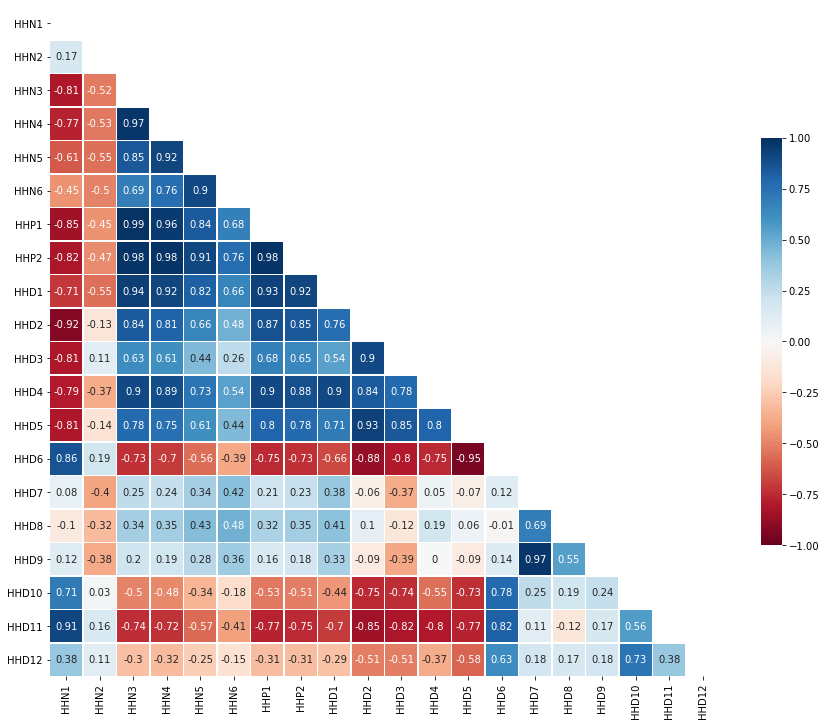

In [73]:
corr = housenumpeople.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 15))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

In [74]:
donors = donors.drop(columns=['HHN4','HHN5','HHN6', 'HHP1', 'HHD2','HHD6', 'HHD7'])

In [75]:
donors.shape

(95412, 380)

***Neighborhood Marital Status***

In [76]:
neighmaritalstatus = donors[['MARR1', 'MARR2', 'MARR3', 'MARR4']]

In [77]:
neighmaritalstatus.head()

,MARR1,MARR2,MARR3,MARR4
0,61,7,12,19
1,69,4,3,24
2,63,9,9,19
3,63,9,6,23
4,42,17,9,33


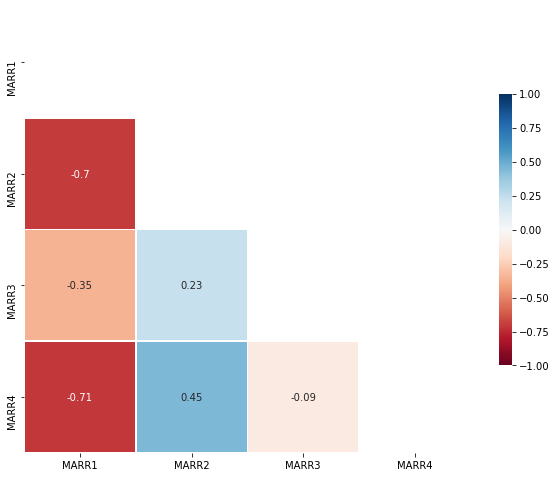

In [78]:
corr = neighmaritalstatus.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 10))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

***Neighborhood house units***

In [79]:
neighhouseunits = donors[['DW1', 'DW2', 'DW3', 'DW4', 'DW5', 'DW6', 'DW7',
                         'DW8', 'DW9', 'HU1', 'HU2', 'HU3', 'HU4', 'HU5','HUR1', 'HUR2']]

In [80]:
neighhouseunits.head()

,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HU1,HU2,HU3,HU4,HU5,HUR1,HUR2
0,97,95,2,2,0,0,7,7,0,86,14,96,4,7,1,61
1,99,99,0,0,0,0,0,0,0,96,4,97,3,9,0,83
2,69,69,1,6,5,3,3,3,0,78,22,93,7,18,4,36
3,85,83,3,4,1,0,2,0,2,48,52,93,7,6,15,42
4,99,98,0,0,0,0,0,0,0,90,10,97,3,0,2,45


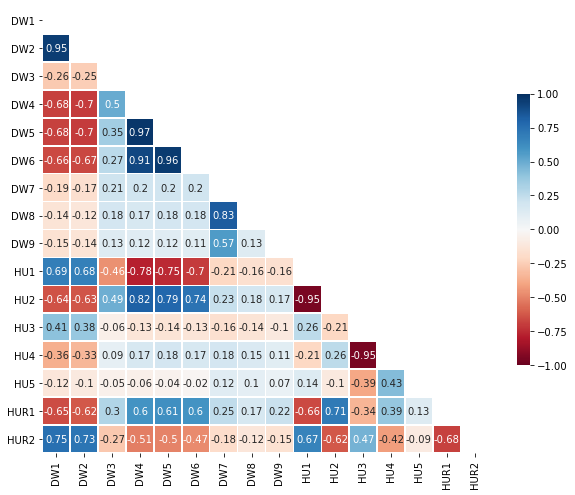

In [81]:
corr = neighhouseunits.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 10))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

In [82]:
donors = donors.drop(columns=['DW2', 'DW5', 'HU2', 'HU4'])

In [83]:
donors.shape

(95412, 376)

***Neighborhood House Value***

In [84]:
neighhousevalue = donors[['HV1','HV2','HV3','HV4','HVP1','HVP2','HVP3','HVP4',
'HVP5','HVP6','RP1' ,'RP2','RP3','RP4','HC1','HC11','HC12','HC13','HC14','HC15',
'HC16','HC17','HC18','HC19','HC20','HC21']]

In [85]:
neighhousevalue.head()

,HV1,HV2,HV3,HV4,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,...,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21
0,479,635,3,2,2,7,13,27,47,0,...,0,10,0,0,0,33,65,40,99,99
1,5468,5218,12,10,97,98,98,98,99,94,...,0,4,0,0,0,99,0,99,99,99
2,497,546,2,1,0,1,6,18,50,0,...,6,35,44,0,15,22,77,17,97,92
3,1000,1263,2,1,10,25,50,69,92,10,...,22,17,0,0,16,23,77,22,93,89
4,576,594,4,3,0,1,2,16,67,0,...,14,72,3,0,0,99,1,21,99,96


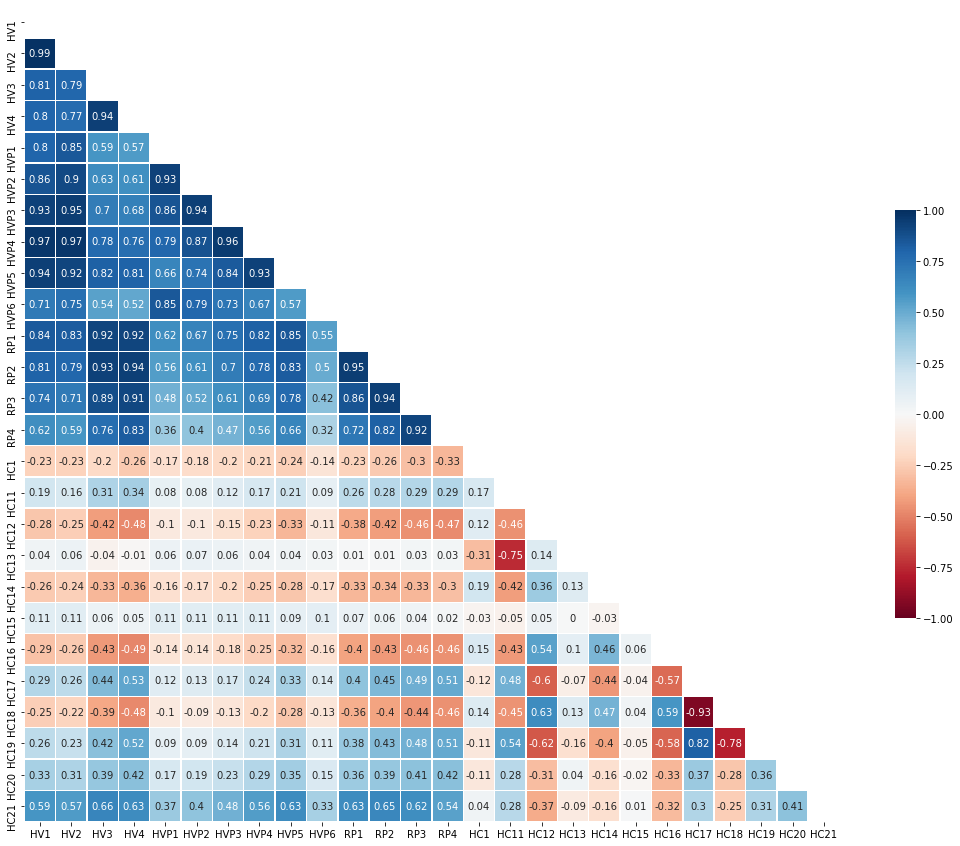

In [86]:
corr = neighhousevalue.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 15))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

In [87]:
donors = donors.drop(columns=['HV1', 'HV3', 'HVP1','HVP2','HVP3','HVP4','RP2', 'RP3','HC18'])

In [88]:
donors.shape

(95412, 367)

***Neighborhood House Units - Rooms***

In [89]:
neighouseunitsrooms = donors[['RHP1','RHP2', 'RHP3','RHP4','HUPA1','HUPA2',
'HUPA3','HUPA4','HUPA5','HUPA6','HUPA7']]

In [90]:
neighouseunitsrooms.head()

,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7
0,58,61,15,4,2,0,0,14,1,0,0
1,76,73,21,5,0,0,0,4,0,0,0
2,49,51,14,5,4,2,24,11,2,3,6
3,55,50,15,5,4,0,9,42,4,0,5
4,52,53,16,6,0,0,0,9,0,0,0


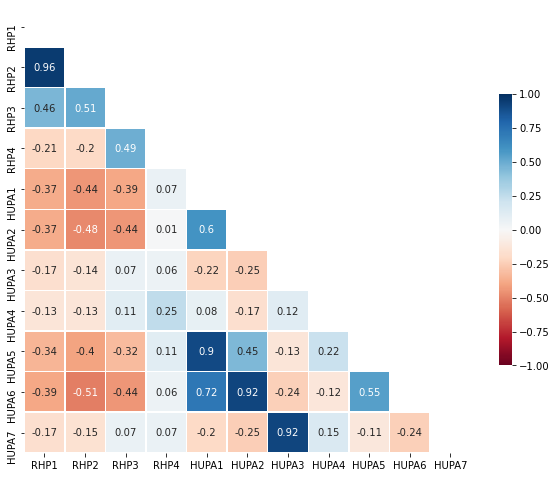

In [91]:
corr = neighouseunitsrooms.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 10))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

In [92]:
donors = donors.drop(columns=['RHP1', 'HUPA1','HUPA2','HUPA3'])

In [93]:
donors.shape

(95412, 363)

***Neighborhood Household Income***

In [94]:
neighhouseholdincome = donors[['IC1','IC2','IC3','IC4','IC5','IC6','IC7','IC8',
'IC9','IC10','IC11','IC12','IC13','IC14','IC15','IC16','IC17','IC18','IC19',
'IC20','IC21','IC22','IC23','HHAS1','HHAS2','HHAS3','HHAS4']]

In [95]:
neighhouseholdincome.head()

,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,...,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4
0,307,318,349,378,12883,13,23,23,23,15,...,26,17,2,0,0,2,28,4,51,1
1,1088,1096,1026,1037,36175,2,6,2,5,15,...,5,15,14,14,10,32,6,2,66,3
2,251,292,292,340,11576,32,18,20,15,12,...,18,16,2,0,0,1,28,8,31,11
3,386,388,396,423,15130,27,12,4,26,22,...,12,30,6,0,0,5,22,14,26,20
4,240,250,293,321,9836,24,29,23,13,4,...,16,4,5,0,0,3,35,8,11,14


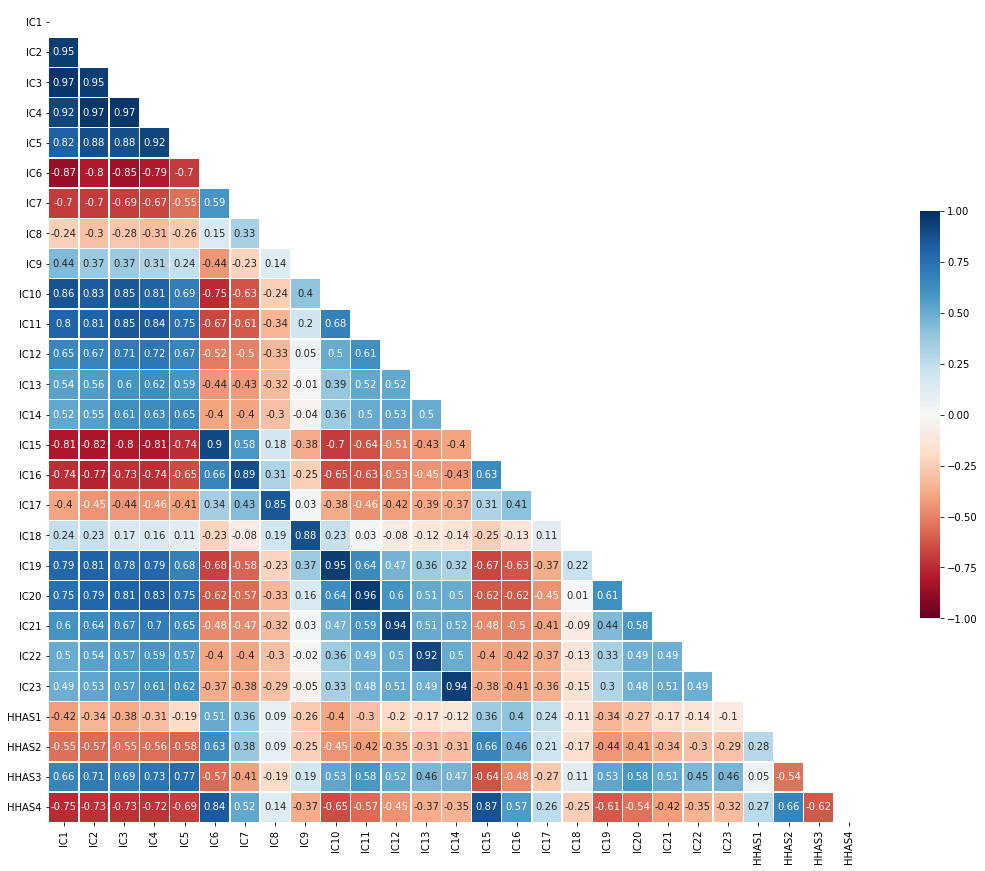

In [96]:
corr = neighhouseholdincome.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 15))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

In [97]:
donors = donors.drop(columns=['IC1','IC2','IC4','IC15','IC18','IC19','IC20','IC21','IC22','IC23'])

In [98]:
donors.shape

(95412, 353)

***Neighborhood use of transports / time***

In [99]:
neightransptime = donors[['TPE1','TPE2','TPE3','TPE4','TPE5','TPE6','TPE7',
'TPE8','TPE9','VOC1','VOC2','VOC3','PEC1','PEC2','TPE10','TPE11','TPE12','TPE13']]

In [100]:
neightransptime.head()

,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,VOC1,VOC2,VOC3,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13
0,88,8,0,0,0,0,0,0,4,96,77,19,1,13,14,16,2,45
1,80,14,0,0,0,0,0,0,6,99,92,53,0,2,24,32,12,71
2,74,22,0,0,0,0,0,2,2,92,65,29,1,21,19,24,6,61
3,58,36,0,0,0,0,0,6,0,94,43,27,0,17,13,15,0,43
4,73,22,1,1,0,0,0,3,1,90,45,18,2,1,24,27,3,76


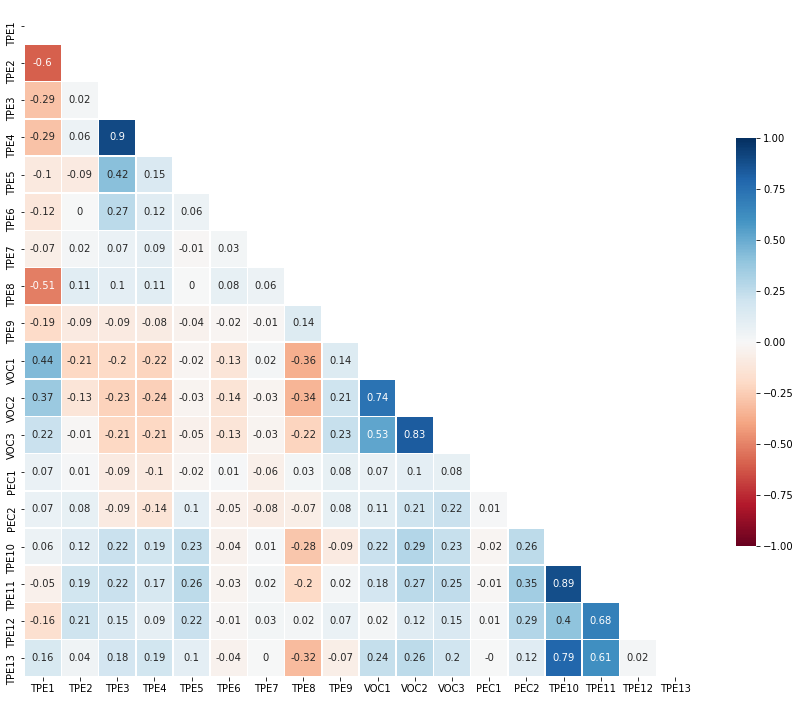

In [101]:
corr = neightransptime.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 15))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

In [102]:
donors = donors.drop(columns=['TPE4'])

In [103]:
donors.shape

(95412, 352)

***Neighborhood Employment***

In [104]:
neighemployment = donors[['LFC1', 'LFC2', 'LFC3', 'LFC4', 'LFC5', 'LFC6', 'LFC7',
                         'LFC8', 'LFC9', 'LFC10']]

In [105]:
neighemployment.head()

,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10
0,56,64,50,64,44,62,53,99,0,0
1,70,83,58,81,57,64,57,99,99,0
2,65,73,59,70,56,78,62,82,99,4
3,69,81,53,68,45,33,31,0,99,23
4,61,73,51,65,49,80,31,81,99,10


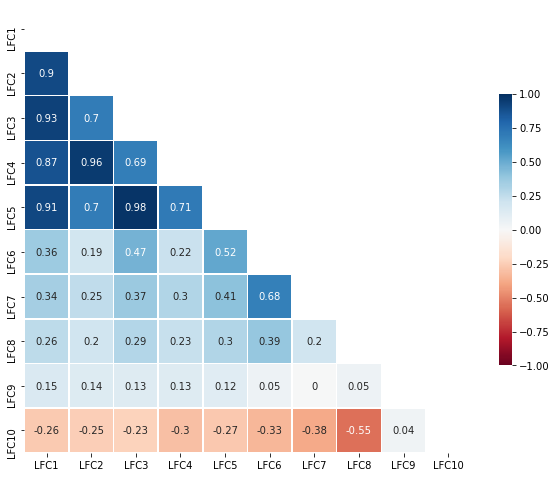

In [106]:
corr = neighemployment.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 10))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

In [107]:
donors = donors.drop(columns=['LFC1', 'LFC2', 'LFC3'])

In [108]:
donors.shape

(95412, 349)

***Neighborhood Jobs***

In [109]:
neighjobs = donors[['OCC1','OCC2','OCC3','OCC4','OCC5','OCC6','OCC7','OCC8',
'OCC9','OCC10','OCC11','OCC12','OCC13','EIC1','EIC2','EIC3','EIC4','EIC5',
'EIC6','EIC7','EIC8','EIC9','EIC10','EIC11','EIC12','EIC13','EIC14','EIC15',
'EIC16']]

In [110]:
neighjobs.head()

,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,...,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16
0,9,3,8,13,9,0,3,9,3,15,...,7,13,6,5,0,4,9,4,1,3
1,22,24,4,21,13,2,1,6,0,4,...,8,18,11,4,3,4,10,7,11,1
2,10,5,2,6,12,0,1,9,5,18,...,2,12,3,3,2,0,7,8,3,3
3,17,3,0,6,6,0,0,13,42,12,...,0,23,3,3,6,0,3,3,3,3
4,17,8,2,6,15,3,7,22,2,9,...,2,12,2,7,6,4,15,29,4,3


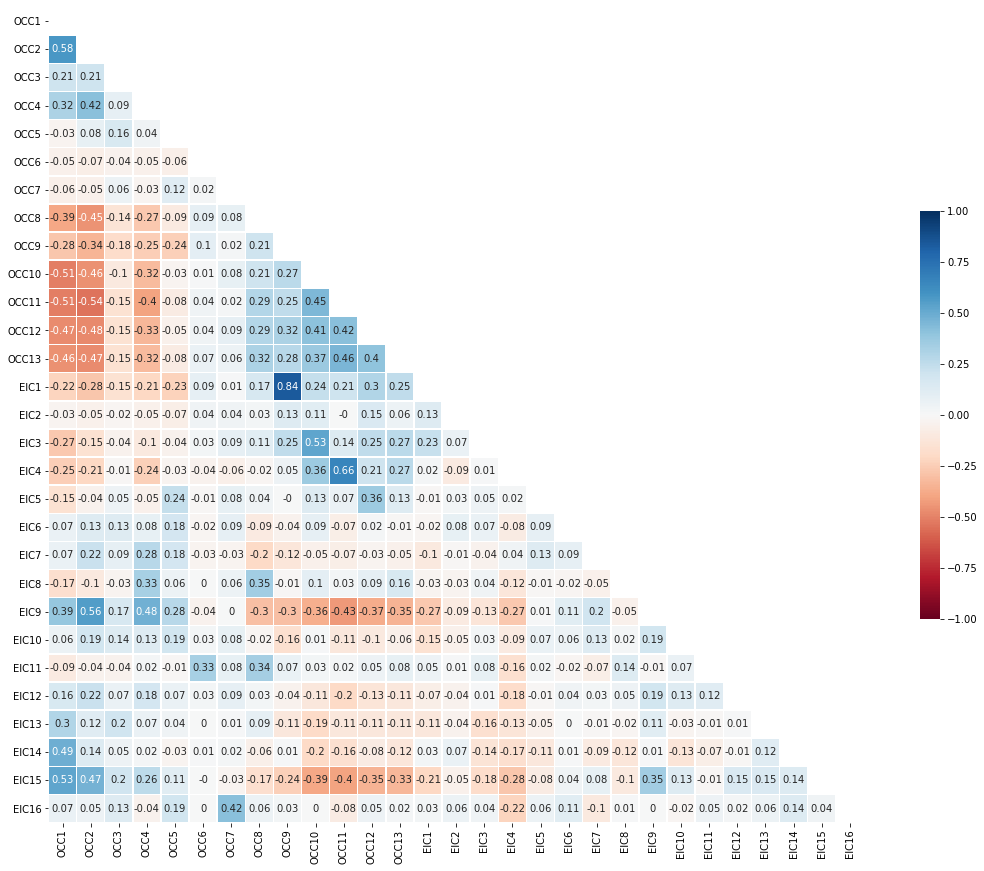

In [111]:
corr = neighjobs.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 15))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

***Neighborhood Employment Sector***

In [112]:
neighemploysector = donors[['OEDC1', 'OEDC2', 'OEDC3', 'OEDC4', 'OEDC5', 'OEDC6',
                           'OEDC7']]

In [113]:
neighemploysector.head()

,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7
0,10,2,1,7,78,2,0
1,6,2,1,16,69,5,2
2,6,7,1,8,74,3,1
3,3,0,3,6,87,0,0
4,26,3,2,7,49,12,1


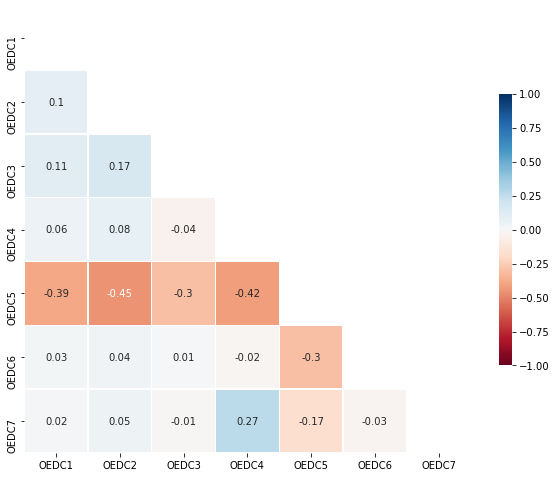

In [114]:
corr = neighemploysector.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 10))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

***Neighborhood Years Education***

In [115]:
neighyearseduc = donors[['EC1', 'EC2', 'EC3', 'EC4', 'EC5', 'EC6', 'EC7', 'EC8',
                        'SEC1', 'SEC2', 'SEC3', 'SEC4', 'SEC5']]

In [116]:
neighyearseduc.head()

,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5
0,120,16,10,39,21,8,4,3,5,20,3,19,4
1,160,5,5,12,21,7,30,20,14,24,4,24,10
2,120,22,20,28,16,6,5,3,1,23,1,16,6
3,120,28,12,14,27,10,3,5,0,19,1,17,0
4,120,16,20,30,13,3,12,5,2,26,1,20,7


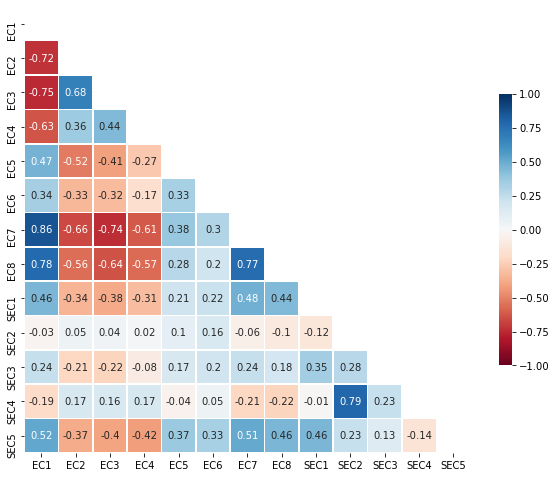

In [117]:
corr = neighyearseduc.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 10))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

***Neighborhood Military Service***

In [118]:
neighmilitary = donors[['AFC1', 'AFC2', 'AFC3', 'AFC4', 'AFC5', 'AFC6', 'VC1',
                       'VC2', 'VC3', 'VC4']]

In [119]:
neighmilitary.head()

,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4
0,0,0,0,18,39,0,34,23,18,16
1,0,0,0,8,15,0,55,10,11,0
2,0,0,0,10,21,0,28,23,32,8
3,0,0,0,13,23,0,14,40,31,16
4,1,1,1,15,28,4,9,16,53,20


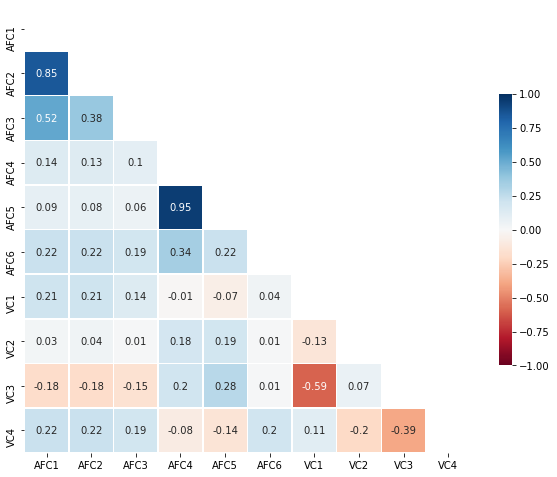

In [120]:
corr = neighmilitary.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 10))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

In [121]:
donors = donors.drop(columns=['AFC4'])

In [122]:
donors.shape

(95412, 348)

***Neighborhood Ancestry***

In [123]:
neighancestry = donors[['ANC1', 'ANC2', 'ANC3', 'ANC4', 'ANC5', 'ANC6', 'ANC7',
                       'ANC8', 'ANC9', 'ANC10', 'ANC11', 'ANC12', 'ANC13', 'ANC14',
                       'ANC15']]

In [124]:
neighancestry.head()

,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15
0,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0
1,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0
2,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0
3,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


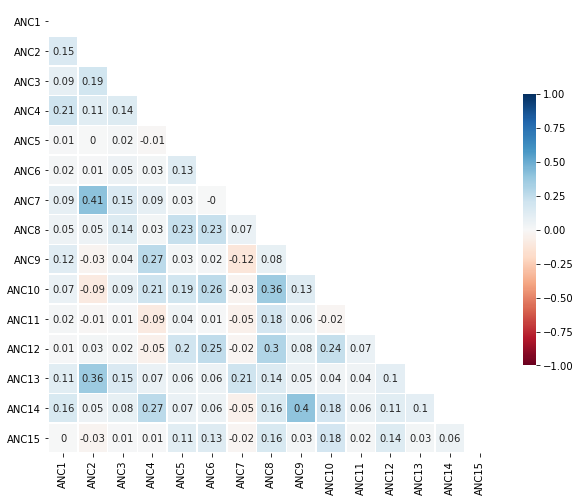

In [125]:
corr = neighancestry.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 10))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

***Promorion history File***

In [126]:
promhistfile = donors[['ADATE_2','ADATE_3','ADATE_4','ADATE_5','ADATE_6',
'ADATE_7','ADATE_8','ADATE_9','ADATE_10','ADATE_11','ADATE_12','ADATE_13',
'ADATE_14','ADATE_16','ADATE_17','ADATE_18','ADATE_19','ADATE_21',
'ADATE_22','ADATE_24']]

In [127]:
promhistfile.head()

,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24
0,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,2015-10-01,2015-08-01,2015-07-01,2015-06-01,2015-03-01,2015-02-01,2015-01-01,2014-11-01,2014-10-01,2014-09-01,2014-06-01
1,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,2015-10-01,2015-09-01,2015-07-01,2015-06-01,2015-03-01,2015-02-01,2015-01-01,2014-11-01,2014-10-01,2014-09-01,2014-06-01
2,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,2015-10-01,2015-08-01,2015-07-01,2015-06-01,2015-03-01,2015-02-01,2015-01-01,2014-11-01,2014-10-01,2014-09-01,2014-06-01
3,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,2015-10-01,2015-08-01,2015-07-01,2015-06-01,2015-03-01,2015-02-01,2015-01-01,2014-11-01,2014-10-01,2014-09-01,2014-06-01
4,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2015-12-01,2016-01-01,2015-11-01,2015-10-01,2015-09-01,2015-08-01,2015-02-01,2015-06-01,2015-03-01,2015-02-01,2014-12-01,2014-11-01,2014-10-01,2015-06-01,2014-06-01


***Promotion RFA***

In [128]:
promrfa = donors[['RFA_2','RFA_3' ,'RFA_4','RFA_5','RFA_6','RFA_7','RFA_8',
'RFA_9','RFA_10','RFA_11','RFA_12','RFA_13','RFA_14','RFA_16','RFA_17',
'RFA_18','RFA_19','RFA_21','RFA_22','RFA_24','RFA_2R','RFA_2F',
'RFA_2A' ,'MDMAUD_R','MDMAUD_F','MDMAUD_A']]

In [129]:
promrfa.head()

,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,...,RFA_19,RFA_21,RFA_22,RFA_24,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,...,S4E,S4E,S4E,S4E,L,4,E,X,X,X
1,L2G,A2G,A2G,A2G,A2G,A1E,A1E,A1E,A1E,A1E,...,N1E,N1E,N1E,F1E,L,2,G,X,X,X
2,L4E,S4E,S4E,S4E,S4E,S4F,S4F,S4F,A1F,S4F,...,S4D,A1E,S4D,S3D,L,4,E,X,X,X
3,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,A1F,S4E,...,A1D,A1D,A1D,A1E,L,4,E,X,X,X
4,L2F,A2F,A2F,A2F,A1D,I2D,A1E,A1E,L1D,A1E,...,A3D,A3D,I4E,A3D,L,2,F,X,X,X


In [130]:
donors = donors.drop(columns=['RFA_2R','RFA_2F','RFA_2A'])

***Promotion HIstory File Summary***

In [131]:
promhistsummary = donors[['CARDPROM','MAXADATE','NUMPROM','CARDPM12','NUMPRM12',
'NGIFTALL','RAMNTALL','MINRAMNT','MINRDATE','MAXRAMNT','MAXRDATE','LASTGIFT',
'LASTDATE','FISTDATE','NEXTDATE','TIMELAG','AVGGIFT']]

In [132]:
promhistsummary.head()

,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,NGIFTALL,RAMNTALL,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT
0,27,2017-02-01,74,6,14,31,240.0,5.0,2012-08-01,12.0,2014-02-01,10.0,2015-12-01,2009-11-01,2010-03-01,4.0,7.741935
1,12,2017-02-01,32,6,13,3,47.0,10.0,2013-10-01,25.0,2015-12-01,25.0,2015-12-01,2013-10-01,2015-04-01,18.0,15.666667
2,26,2017-02-01,63,6,14,27,202.0,2.0,2011-11-01,16.0,2012-07-01,5.0,2015-12-01,2010-01-01,2011-01-01,12.0,7.481481
3,27,2017-02-01,66,6,14,16,109.0,2.0,2007-11-01,11.0,2014-11-01,10.0,2015-12-01,2007-02-01,2007-11-01,9.0,6.812500
4,43,2017-02-01,113,10,25,37,254.0,3.0,2013-10-01,15.0,2016-01-01,15.0,2016-01-01,1999-03-01,2000-05-01,14.0,6.864865


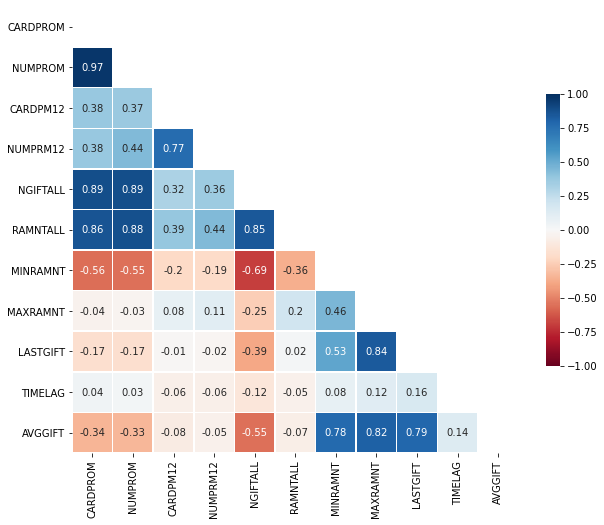

In [133]:
corr = promhistsummary.corr(method = 'spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 10))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(round(corr,2), mask = mask, cmap = 'RdBu', vmax = 1.0, vmin= -1.0, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

In [134]:
donors.shape

(95412, 345)

<a class="anchor" id="redefinitionmetricnonmetric">

## 4.5. REDEFINITION OF METRIC & NON METRIC FEATURES

</a>

In [135]:
# Define the metric features by excluding the variables with object datatype from donors
metric_features=donors.select_dtypes(exclude=[object]).columns

In [136]:
len(metric_features)

257

In [137]:
non_metric_features=donors.select_dtypes(include=[object]).columns
len(non_metric_features)

88

<a class="anchor" id="graphics">

## 4.6. Graphics

</a>

In [138]:
len(metric_features)

257

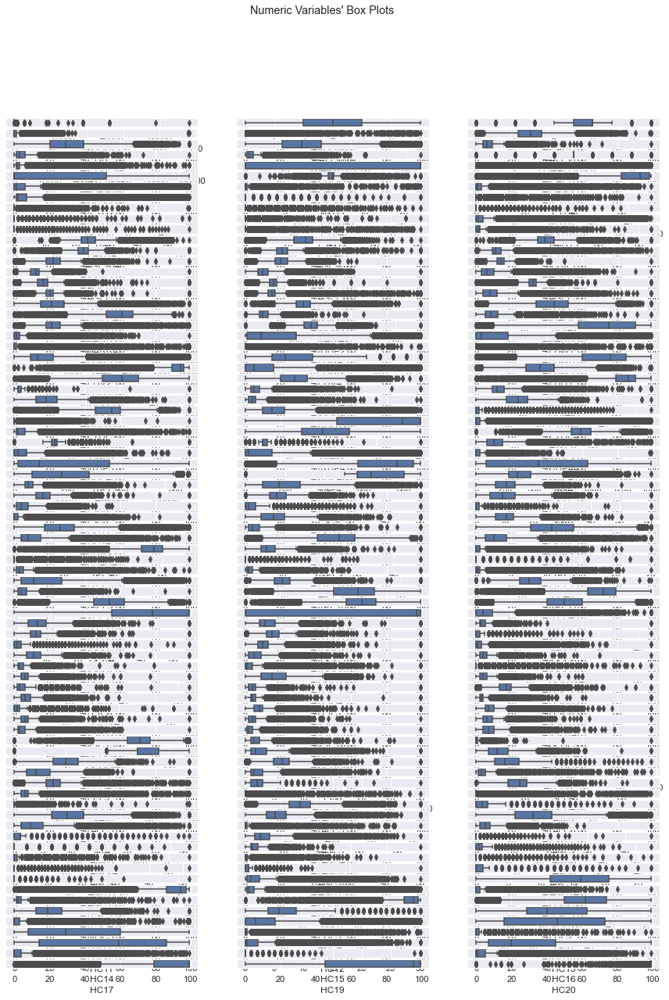

In [139]:
# Check the distribution of the Numeric Variables in donors dataset
# We can see that there are some outstanding values to be treated in Outliers Section (5.)
sns.set()

fig, axes = plt.subplots(80, math.ceil(len(metric_features) / 100), figsize=(15, 20))


for ax, feat in zip(axes.flatten(), metric_features): 
    sns.boxplot(donors[feat], ax=ax)
    
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

<a class="anchor" id="transformingdatatype">

## 4.7. Transforming data type

</a>

In [140]:
donors["ODATEDW"] = donors["ODATEDW"].astype("datetime64") # change data type to datetime64

In [141]:
donors["ODATEDW"]

0       2009-01-01
1       2014-01-01
2       2010-01-01
3       2007-01-01
4       2006-01-01
           ...    
95407   2016-01-01
95408   2016-01-01
95409   2015-01-01
95410   2006-01-01
95411   2008-01-01
Name: ODATEDW, Length: 95412, dtype: datetime64[ns]

In [142]:
donors["DOB"]= donors["DOB"].astype("datetime64") # change data type to datetime64

In [143]:
donors["DOB"]

0       1957-12-01
1       1972-02-01
2       1968-01-01
3       1948-01-01
4       1940-01-01
           ...    
95407   1968-01-01
95408   1970-01-01
95409   1958-01-01
95410   1960-05-01
95411   1938-01-01
Name: DOB, Length: 95412, dtype: datetime64[ns]

In [144]:
donors["LASTDATE"]= donors["LASTDATE"].astype("datetime64") # change data type to datetime64

<hr>
<a class="anchor" id="newvariables">
    
## 4.8. New variables
    
</a>

In [145]:
donors['DOB']

0       1957-12-01
1       1972-02-01
2       1968-01-01
3       1948-01-01
4       1940-01-01
           ...    
95407   1968-01-01
95408   1970-01-01
95409   1958-01-01
95410   1960-05-01
95411   1938-01-01
Name: DOB, Length: 95412, dtype: datetime64[ns]

In [146]:
# AGE = ADATE_2 - DOB (re-computed)
donors['Age'] = (pd.DatetimeIndex(donors['ADATE_2']).year - pd.DatetimeIndex(donors['DOB']).year)

In [147]:
donors['Age']

0        60
1        45
2        49
3        69
4        77
         ..
95407    49
95408    47
95409    59
95410    57
95411    79
Name: Age, Length: 95412, dtype: int64

In [148]:
donors["Age"]=donors['Age'].astype("int64")

In [149]:
donors["Age"].unique()

array([60, 45, 49, 69, 77, 37, 65, 74, 71, 70, 43, 61, 81, 54, 41, 83, 68,
       87, 84, 29, 44, 51, 66,  7, 67, 39, 47, 33, 79, 35, 40, 53, 72, 46,
       32, 62, 63, 59, 76, 73, 86, 50, 17, 58, 85, 25, 75, 57, 38, 82, 80,
       55, 78, 36, 56, 48, 64, 52, 34, 16, 42, 30, 28, 27, 31, 21,  6, 23,
       26, 19, 18, 24, 22, 13, 15, 20, 10,  2,  1,  9,  0, 11,  5,  4,  8,
       12, 14], dtype=int64)

In [150]:
donors["ADATE_2"]= donors["ADATE_2"].astype("datetime64")

In [151]:
# Recency -> days since last recent gift
donors['Recency'] = (donors['ADATE_2'] - donors['LASTDATE']).dt.days.astype('int64')

In [152]:
donors['Recency']=donors['Recency'].astype("int64")

In [153]:
donors[donors['Recency']<0]

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,DOB,NOEXCH,MDMAUD,DOMAIN,...,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Age,Recency


In [154]:
# Convert 'MAXADATE' to datetime
donors['MAXADATE'] = donors['MAXADATE'].astype("datetime64")

In [155]:
donors['MAXADATE']

0       2017-02-01
1       2017-02-01
2       2017-02-01
3       2017-02-01
4       2017-02-01
           ...    
95407   2017-02-01
95408   2017-02-01
95409   2017-02-01
95410   2017-02-01
95411   2017-02-01
Name: MAXADATE, Length: 95412, dtype: datetime64[ns]

In [156]:
# Days_lastPromotion -> days since most recent promotion received
donors['Days_lastPromotion'] = (donors['ADATE_2'] - donors['MAXADATE']).dt.days.astype('int64')

In [157]:
donors['Days_lastPromotion']=donors['Days_lastPromotion'].astype("int64")

In [158]:
donors[donors['Days_lastPromotion']<0]

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,DOB,NOEXCH,MDMAUD,DOMAIN,...,AVGGIFT,CONTROLN,HPHONE_D,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Age,Recency,Days_lastPromotion


In [159]:
# Days_FirstGift -> days since first gift (ODATEDW - date of first gift)
donors['Days_FirstGift'] = (donors['ADATE_2'] - donors['ODATEDW']).dt.days.astype('int64')

In [160]:
donors['Days_FirstGift']=donors['Days_FirstGift'].astype("int64")

In [161]:
donors[donors['Days_FirstGift']<0]

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,DOB,NOEXCH,MDMAUD,DOMAIN,...,CONTROLN,HPHONE_D,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Age,Recency,Days_lastPromotion,Days_FirstGift


In [162]:
donors.shape

(95412, 349)

In [163]:
donors=donors.drop(columns={"ODATEDW",'MAXADATE',"LASTDATE",'DOB',})

In [164]:
donors['ADATE_2']=donors['ADATE_2'].astype("str")

In [165]:
donors.dtypes.unique()

array([dtype('O'), dtype('int64'), dtype('float64')], dtype=object)

In [166]:
donors.shape

(95412, 345)

<hr>
<a class="anchor" id="incoherents">
    
## 4.9. Incoherents
    
</a>

**Note:** We did not consider all donors as lapsed donors. In this way, in this section we will not take into account the fact that cannot be donnors with Recency not belonging to the interval of 13 up to 24 months. 

In [167]:
# we want people with more than 17 years in the dataset
donors=donors[donors["Age"]>17]

In [168]:
donors.shape

(94405, 345)

In [169]:
# recency cannot be negative
donors=donors[donors["Recency"]>0]

In [170]:
donors.shape

(94405, 345)

<hr>
<a class="anchor" id="correlation">
    
# 4.10. Correlation
    
</a>

In [171]:
c = donors.corr(method="spearman").abs()
s = c.unstack()
so = round(s.sort_values(kind="quicksort"),4)
high_pairs = so[so > 0.90]
high_pairs = high_pairs[high_pairs < 1.0]

In [172]:
pd.set_option('display.max_rows', 562)
high_pairs

AGE904          ETHC3             0.9004
ETHC3           AGE904            0.9004
MARR3           AGEC7             0.9066
AGEC7           MARR3             0.9066
HHD3            MARR1             0.9083
MARR1           HHD3              0.9083
DW6             DW4               0.9127
DW4             DW6               0.9127
Days_FirstGift  NUMPROM           0.9132
NUMPROM         Days_FirstGift    0.9132
HHD11           HHN1              0.9142
HHN1            HHD11             0.9142
HHD1            RHP3              0.9153
RHP3            HHD1              0.9153
HHD1            HHP2              0.9159
HHP2            HHD1              0.9159
HV4             RP1               0.9175
RP1             HV4               0.9175
HVP5            HV2               0.9193
HV2             HVP5              0.9193
HHD1            AGE907            0.9210
AGE907          HHD1              0.9210
NGIFTALL        CARDGIFT          0.9230
CARDGIFT        NGIFTALL          0.9230
Days_FirstGift  

In [173]:
so_low = round(s.sort_values(kind="quicksort"),4)
low_pairs = so_low[so_low < 0.05]

In [174]:
pd.set_option('display.max_rows', 562)
low_pairs

EC5       ANC7        0.0000
ANC7      EC5         0.0000
HHAS1     ANC10       0.0000
ANC10     HHAS1       0.0000
POP90C2   HC15        0.0000
                       ...  
ETH3      HC13        0.0499
HC3       AFC3        0.0499
AFC3      HC3         0.0499
EC2       LOCALGOV    0.0499
LOCALGOV  EC2         0.0499
Length: 24220, dtype: float64

In [175]:
donors.shape

(94405, 345)

In [176]:
correlated_features = set()
correlation_matrix = donors.corr(method = 'spearman')
for i in range(len(correlation_matrix .columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.90:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

In [177]:
donors.drop(labels=correlated_features, axis=1, inplace=True)

In [178]:
donors.shape

(94405, 330)

In [179]:
metric_features=donors.select_dtypes(exclude=[object]).columns

In [180]:
len(metric_features)

246

In [181]:
non_metric_features=donors.select_dtypes(include=[object]).columns
len(non_metric_features)

84

In [182]:
donors.head()

,OSOURCE,TCODE,STATE,ZIP,MAILCODE,NOEXCH,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,...,AVGGIFT,CONTROLN,HPHONE_D,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Age,Recency,Days_lastPromotion
0,GRI,0,IL,61081,O,0,XXXX,T2,U,N,...,7.741935,95515,0,X,X,X,C,60,548,120
1,BOA,1,CA,91326,O,0,XXXX,S1,H,N,...,15.666667,148535,0,X,X,X,A,45,548,120
2,AMH,1,NC,27017,O,0,XXXX,R2,U,N,...,7.481481,15078,1,X,X,X,C,49,548,120
3,BRY,0,CA,95953,O,0,XXXX,R2,U,N,...,6.812500,172556,1,X,X,X,C,69,548,120
4,MBC,0,FL,33176,O,0,XXXX,S2,H,N,...,6.864865,7112,1,X,X,X,A,77,517,120


In [183]:
donors.loc[:, 'HOMEOWNR':]

,HOMEOWNR,CHILD03,CHILD07,CHILD12,CHILD18,INCOME,GENDER,WEALTH1,HIT,DATASRCE,...,AVGGIFT,CONTROLN,HPHONE_D,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Age,Recency,Days_lastPromotion
0,U,N,N,N,N,4.0,F,6.0,0,3,...,7.741935,95515,0,X,X,X,C,60,548,120
1,H,N,N,N,M,6.0,M,9.0,16,3,...,15.666667,148535,0,X,X,X,A,45,548,120
2,U,N,N,N,N,3.0,M,1.0,2,3,...,7.481481,15078,1,X,X,X,C,49,548,120
3,U,N,N,N,N,1.0,F,4.0,2,3,...,6.812500,172556,1,X,X,X,C,69,548,120
4,H,N,N,N,N,3.0,F,2.0,60,3,...,6.864865,7112,1,X,X,X,A,77,517,120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,U,N,N,N,N,4.0,M,6.0,0,3,...,25.000000,184568,0,X,X,X,C,49,486,120
95408,H,N,N,N,M,7.0,M,9.0,1,3,...,20.000000,122706,1,X,X,X,A,47,457,120
95409,U,N,N,N,N,4.0,M,6.0,0,3,...,8.285714,189641,1,X,X,X,B,59,243,120
95410,H,N,N,N,N,7.0,F,6.0,0,2,...,12.146341,4693,1,X,X,X,A,57,151,120


In [184]:
donors.loc[:, 'HIT':]

,HIT,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,...,AVGGIFT,CONTROLN,HPHONE_D,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Age,Recency,Days_lastPromotion
0,0,3,0,39,34,18,10,2,1,Default,...,7.741935,95515,0,X,X,X,C,60,548,120
1,16,3,0,15,55,11,6,2,1,Default,...,15.666667,148535,0,X,X,X,A,45,548,120
2,2,3,0,20,29,33,6,8,1,Default,...,7.481481,15078,1,X,X,X,C,49,548,120
3,2,3,0,23,14,31,3,0,3,Default,...,6.812500,172556,1,X,X,X,C,69,548,120
4,60,3,1,28,9,53,26,3,2,Default,...,6.864865,7112,1,X,X,X,A,77,517,120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,0,3,14,36,47,11,7,8,13,Default,...,25.000000,184568,0,X,X,X,C,49,486,120
95408,1,3,0,31,43,19,4,1,0,Default,...,20.000000,122706,1,X,X,X,A,47,457,120
95409,0,3,0,18,46,20,7,23,0,Default,...,8.285714,189641,1,X,X,X,B,59,243,120
95410,0,2,0,28,35,20,9,1,1,Default,...,12.146341,4693,1,X,X,X,A,57,151,120


In [185]:
donors.shape

(94405, 330)

<hr>
<a class="anchor" id="outliers">
    
# 5. Outliers
    
</a>

<hr>
<a class="anchor" id="iqr">
    
## 5.1. IQR
    
</a>

In [186]:
df_iqr=donors.copy()

In [187]:
# Define the IQR as the 3th percentile and the 97th percentile instead of the usual 25th and 75th percentiles
Q1 = df_iqr.quantile(0.03)  
Q3 = df_iqr.quantile(0.97)
IQR = Q3 - Q1
print(IQR)

TCODE                     28.000000
INCOME                     6.000000
WEALTH1                    8.000000
HIT                       22.000000
MALEMILI                   7.000000
MALEVET                   52.000000
VIETVETS                  60.000000
WWIIVETS                  70.000000
LOCALGOV                  16.000000
STATEGOV                  17.000000
FEDGOV                    13.000000
WEALTH2                    9.000000
POP901                 16566.320000
POP90C1                   99.000000
POP90C2                   99.000000
POP90C3                   99.000000
POP90C4                   11.000000
ETH1                      84.000000
ETH2                      60.000000
ETH3                       4.000000
ETH4                      18.000000
ETH5                      48.000000
ETH6                       2.000000
ETH7                       2.000000
ETH8                       4.000000
ETH9                       4.000000
ETH10                      2.000000
ETH11                      2

In [188]:
df_iqr = df_iqr[~((df_iqr < (Q1 - 1.5 * IQR)) |(df_iqr > (Q3 + 1.5 * IQR))).any(axis=1)]
df_iqr.shape

(69125, 330)

In [189]:
(1-(df_iqr.shape[0] / donors.shape[0]))*100

26.77824267782427

<hr>
<a class="anchor" id="lof">
    
## 5.2. LOF
    
</a>

In [190]:
df_lof=donors.copy()

In [191]:
from sklearn.neighbors import LocalOutlierFactor

In [192]:
# Consider 50 neighbors 
lof = LocalOutlierFactor(n_neighbors=50)

In [193]:
lof_pred=lof.fit_predict(df_lof[metric_features])

In [194]:
outlier_index = df_lof[lof_pred == -1] # negative values are outliers
outlier_index

,OSOURCE,TCODE,STATE,ZIP,MAILCODE,NOEXCH,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,...,AVGGIFT,CONTROLN,HPHONE_D,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Age,Recency,Days_lastPromotion
35,MBC,1,OR,97708,O,0,XXXX,R1,U,N,...,12.312500,209,0,X,X,X,C,49,548,120
49,ALZ,1,TX,75606,O,0,XXXX,C3,H,N,...,21.000000,118016,0,X,X,X,C,67,548,120
78,BHG,0,CA,92625,O,0,XXXX,S1,H,N,...,11.000000,156378,0,X,X,X,A,69,578,120
82,NSH,0,TX,75082,O,0,XXXX,S1,H,N,...,8.750000,116325,1,X,X,X,A,53,609,120
105,VIK,0,CA,90024,O,0,XXXX,C1,U,N,...,24.000000,142846,0,X,X,X,A,49,548,120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95134,GUR,0,WA,98051,O,0,XXXX,R2,U,N,...,12.600000,133199,0,X,X,X,A,56,792,120
95197,AHN,0,MI,49501,O,0,XXXX,S2,U,N,...,21.142857,73591,0,X,X,X,B,37,517,120
95251,FRC,0,FL,32324,O,0,XXXX,R2,U,N,...,116.666667,33495,0,X,X,X,B,49,701,120
95335,MCO,1,MT,59802,O,0,XXXX,C1,H,N,...,15.000000,87489,1,X,X,X,C,50,486,120


In [195]:
(outlier_index.shape[0] / donors.shape[0])*100

1.9045601398231027

In [196]:
df_nonoise = df_lof[lof_pred != -1]
df_nonoise

,OSOURCE,TCODE,STATE,ZIP,MAILCODE,NOEXCH,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,...,AVGGIFT,CONTROLN,HPHONE_D,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Age,Recency,Days_lastPromotion
0,GRI,0,IL,61081,O,0,XXXX,T2,U,N,...,7.741935,95515,0,X,X,X,C,60,548,120
1,BOA,1,CA,91326,O,0,XXXX,S1,H,N,...,15.666667,148535,0,X,X,X,A,45,548,120
2,AMH,1,NC,27017,O,0,XXXX,R2,U,N,...,7.481481,15078,1,X,X,X,C,49,548,120
3,BRY,0,CA,95953,O,0,XXXX,R2,U,N,...,6.812500,172556,1,X,X,X,C,69,548,120
4,MBC,0,FL,33176,O,0,XXXX,S2,H,N,...,6.864865,7112,1,X,X,X,A,77,517,120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95406,LHJ,0,FL,32776-,O,0,XXXX,S2,H,N,...,3.375000,35088,0,X,X,X,C,49,486,120
95407,ASE,1,AK,99504,O,0,XXXX,C2,U,N,...,25.000000,184568,0,X,X,X,C,49,486,120
95408,DCD,1,TX,77379,O,0,XXXX,C1,H,N,...,20.000000,122706,1,X,X,X,A,47,457,120
95409,MBC,1,MI,48910,O,0,XXXX,C3,U,N,...,8.285714,189641,1,X,X,X,B,59,243,120


<hr>
<a class="anchor" id="zscore">
    
## 5.3. Z-Score
    
</a>

In [197]:
metric_features=donors.select_dtypes(exclude=[object]).columns
len(metric_features)

246

In [198]:
non_metric_features=donors.select_dtypes(include=[object]).columns
len(non_metric_features)

84

In [199]:
df_z=donors.copy()

In [200]:
from scipy import stats

In [201]:
z = np.abs(stats.zscore(df_z[metric_features]))
print(z)

[[0.05687421 0.0493405  0.16985471 ... 0.22453824 0.09181576 0.06058843]
 [0.05582652 1.2744824  1.65399382 ... 0.80939694 0.09181576 0.06058843]
 [0.05582652 0.56323046 2.30371048 ... 0.53368089 0.09181576 0.06058843]
 ...
 [0.05582652 0.0493405  0.16985471 ... 0.15560922 2.62174668 0.06058843]
 [0.05687421 1.88705336 0.16985471 ... 0.0177512  3.38487339 0.06058843]
 [0.05477883 0.66191145 1.15928078 ... 1.53418946 3.12773287 0.06058843]]


In [202]:
print(np.where(z > 15))

(array([   30,   118,   118, ..., 94166, 94269, 94404], dtype=int64), array([245, 178, 179, ..., 112, 200, 234], dtype=int64))


In [203]:
# Discard the observation that are 15 standard deviations above the mean
df_z = df_z[(z < 15).all(axis=1)]

In [204]:
df_z.shape

(92043, 330)

In [205]:
(1 - (df_z.shape[0] / donors.shape[0]))*100

2.5019861236163288

<hr>
<a class="anchor" id="lofzscore">
    
## 5.4. LOF & Z-Score
    
</a>

**Note:** This was our elected method for outliers' removal.

In [206]:
df_merge = df_nonoise.merge(df_z)

In [207]:
df_merge

,OSOURCE,TCODE,STATE,ZIP,MAILCODE,NOEXCH,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,...,AVGGIFT,CONTROLN,HPHONE_D,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Age,Recency,Days_lastPromotion
0,GRI,0,IL,61081,O,0,XXXX,T2,U,N,...,7.741935,95515,0,X,X,X,C,60,548,120
1,BOA,1,CA,91326,O,0,XXXX,S1,H,N,...,15.666667,148535,0,X,X,X,A,45,548,120
2,AMH,1,NC,27017,O,0,XXXX,R2,U,N,...,7.481481,15078,1,X,X,X,C,49,548,120
3,BRY,0,CA,95953,O,0,XXXX,R2,U,N,...,6.812500,172556,1,X,X,X,C,69,548,120
4,MBC,0,FL,33176,O,0,XXXX,S2,H,N,...,6.864865,7112,1,X,X,X,A,77,517,120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90498,LHJ,0,FL,32776-,O,0,XXXX,S2,H,N,...,3.375000,35088,0,X,X,X,C,49,486,120
90499,ASE,1,AK,99504,O,0,XXXX,C2,U,N,...,25.000000,184568,0,X,X,X,C,49,486,120
90500,DCD,1,TX,77379,O,0,XXXX,C1,H,N,...,20.000000,122706,1,X,X,X,A,47,457,120
90501,MBC,1,MI,48910,O,0,XXXX,C3,U,N,...,8.285714,189641,1,X,X,X,B,59,243,120


In [208]:
df_outliers=donors.merge(df_merge,indicator = True, how='left').loc[lambda x : x['_merge']!='both']

In [209]:
df_outliers.drop(columns={"_merge"},inplace=True)

In [210]:
donors = df_merge

<hr>
<a class="anchor" id="dbscan">
    
## 5.5. DBSCAN
    
</a>

We have performed DBSCAN as it is shown in the code bellow; however, the results were not applicable in our analysis maybe due to the fact that our clusters might not have a similar density and the dataset has a large shape.

In [211]:
df_concat=donors.copy()

In [212]:
# # Perform DBSCAN clustering
#dbscan = DBSCAN(eps=9.7, min_samples=826, n_jobs=-1)
#dbscan_labels = dbscan.fit_predict(df_concat[metric_features])

#dbscan_n_clusters = len(np.unique(dbscan_labels))
#print("Number of estimated clusters : %d" % dbscan_n_clusters)

In [213]:
# K-distance graph to find out the right eps value
#neigh = NearestNeighbors(n_neighbors=500)
#neigh.fit(df_concat[metric_features])
#distances, _ = neigh.kneighbors(df_concat[metric_features])
#distances = np.sort(distances[:, -1])
#plt.plot(distances)
#plt.show()

In [214]:
# df_concat = pd.concat([df_concat[metric_features], pd.Series(dbscan_labels, index=df_concat.index, name="dbscan_labels")], axis=1)
# df_concat.head()

In [215]:
# Detecting noise (potential outliers)
# df_concat.loc[df_concat['dbscan_labels'] == -1]

In [216]:
# Computing the R^2 of the cluster solution
# df_nonoise = df_concat.loc[df_concat['dbscan_labels'] != -1]
# sst = get_ss(df[metric_features])  # get total sum of squares
# ssw_labels = df_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
# ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
# r2 = ssb / sst
# print("Cluster solution with R^2 of %0.4f" % r2)

<hr>
<a class="anchor" id="standardization">
    
# 6. Standardization
    
</a>

In [217]:
metric_features=donors.select_dtypes(exclude=[object]).columns
len(metric_features)

246

In [218]:
non_metric_features=donors.select_dtypes(include=[object]).columns
len(non_metric_features)

84

In [219]:
df_standard = donors.copy()

In [220]:
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(df_standard[metric_features])
scaled_feat

array([[-0.1614309 ,  0.04936275,  0.16847517, ...,  0.22058451,
        -0.09296552, -0.056743  ],
       [-0.154633  ,  1.27299391,  1.6551184 , ..., -0.81261552,
        -0.09296552, -0.056743  ],
       [-0.154633  , -0.56245282, -2.30926355, ..., -0.53709551,
        -0.09296552, -0.056743  ],
       ...,
       [-0.154633  ,  1.88480949,  1.6551184 , ..., -0.67485551,
        -0.84893882, -0.056743  ],
       [-0.154633  ,  0.04936275,  0.16847517, ...,  0.15170451,
        -2.62672216, -0.056743  ],
       [-0.1614309 ,  1.88480949,  0.16847517, ...,  0.0139445 ,
        -3.39100286, -0.056743  ]])

In [221]:
print("Parameters fitted:\n", scaler.mean_, "\n", scaler.var_)

Parameters fitted:
 [2.37471797e+01 3.91931759e+00 5.66002232e+00 3.14149807e+00
 9.03063987e-01 3.06563429e+01 2.98651205e+01 3.26666298e+01
 6.86167309e+00 4.56157254e+00 3.05804227e+00 4.97971338e+00
 3.20590577e+03 5.82532734e+01 1.37169155e+01 2.64984586e+01
 4.82169652e+01 8.53509276e+01 7.46638233e+00 6.96982420e-01
 2.63028850e+00 7.20500978e+00 2.08987547e-01 3.18729766e-01
 5.64025502e-01 5.07463841e-01 2.31285151e-01 1.93076473e-01
 2.72808636e-02 5.11736628e+00 2.65339271e-01 2.09993039e-01
 1.43386407e+00 3.59231517e+01 2.46140901e+01 3.95985879e+01
 3.84796637e+01 2.10359325e+01 1.20989912e+01 2.22130316e+01
 2.07329591e+01 1.41284046e+01 1.18996829e+01 1.05504569e+01
 7.62547098e+00 1.61638841e+01 1.61712761e+01 3.17559307e+01
 1.98216413e+01 1.51959935e+01 9.34270687e+00 2.27657868e+01
 3.37521187e+01 4.27320310e+01 5.83590820e+01 1.07084517e+01
 2.27673668e+01 7.04766251e+01 2.86172834e+00 1.90742075e+01
 1.58337293e+00 1.09831718e+00 4.76978664e-01 1.12128243e+03
 3.8

In [222]:
df_standard[metric_features] = scaled_feat
df_standard.head()

,OSOURCE,TCODE,STATE,ZIP,MAILCODE,NOEXCH,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,...,AVGGIFT,CONTROLN,HPHONE_D,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Age,Recency,Days_lastPromotion
0,GRI,-0.161431,IL,61081,O,0,XXXX,T2,U,N,...,-0.682168,0.002178,-1.006062,X,X,X,C,0.220585,-0.092966,-0.056743
1,BOA,-0.154633,CA,91326,O,0,XXXX,S1,H,N,...,0.308558,0.963193,-1.006062,X,X,X,A,-0.812616,-0.092966,-0.056743
2,AMH,-0.154633,NC,27017,O,0,XXXX,R2,U,N,...,-0.714729,-1.455784,0.993974,X,X,X,C,-0.537096,-0.092966,-0.056743
3,BRY,-0.161431,CA,95953,O,0,XXXX,R2,U,N,...,-0.798363,1.398586,0.993974,X,X,X,C,0.840505,-0.092966,-0.056743
4,MBC,-0.161431,FL,33176,O,0,XXXX,S2,H,N,...,-0.791816,-1.600172,0.993974,X,X,X,A,1.391545,-0.350495,-0.056743


In [223]:
# Checking mean and variance of standardized variables
df_standard[metric_features].describe().round(2)

,TCODE,INCOME,WEALTH1,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,...,MINRAMNT,MAXRAMNT,LASTGIFT,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,Age,Recency,Days_lastPromotion
count,90503.00,90503.00,90503.00,90503.00,90503.00,90503.00,90503.00,90503.00,90503.00,90503.00,...,90503.00,90503.00,90503.00,90503.00,90503.00,90503.00,90503.00,90503.00,90503.00,90503.00
mean,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,...,-0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,...,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-0.16,-1.79,-2.80,-0.48,-0.25,-2.72,-1.99,-1.87,-1.60,-0.90,...,-1.08,-1.14,-1.53,-1.32,-1.49,-1.73,-1.01,-2.67,-3.65,-16.24
25%,-0.16,-0.56,-0.33,-0.48,-0.25,-0.50,-0.59,-0.67,-0.67,-0.70,...,-0.67,-0.44,-0.63,-0.65,-0.60,-0.86,-1.01,-0.54,-0.61,-0.06
50%,-0.15,0.05,0.17,-0.48,-0.25,0.03,0.01,-0.04,-0.20,-0.31,...,-0.39,-0.21,-0.19,-0.31,-0.20,0.00,0.99,-0.40,-0.09,-0.06
75%,-0.15,0.66,0.17,-0.02,-0.25,0.56,0.61,0.59,0.50,0.28,...,0.29,0.26,0.26,0.36,0.28,0.86,0.99,0.84,0.66,-0.06
max,43.35,1.88,1.66,12.34,21.35,5.27,4.62,3.80,14.95,13.54,...,13.28,27.37,18.52,13.83,19.19,1.75,0.99,2.08,2.19,16.39


In [224]:
donors=df_standard

<hr>
<a class="anchor" id="features">
    
# 7. More relevant features
    
</a>

**Dispersion ratio:** <br> The arithmetic mean divided by the geometric mean. Higher dispersion corresponds to more relevant features

In [225]:
def dispersion(data):
    data = data +1 #avoid 0 division
    aritmeticMean = np.mean(data, axis =0 )
    geometricMean = np.power(np.prod(data, axis =0 ),1/data.shape[0])
    R = aritmeticMean/geometricMean
    return R

In [226]:
R = dispersion(donors[metric_features])
pd.set_option('display.max_rows', 562)
R.sort_values(ascending = False)

Recency                    inf
IC9                        inf
MC2                        inf
HHAS4                      inf
HHAS3                      inf
HHAS2                      inf
HHAS1                      inf
IC17                       inf
IC16                       inf
IC12                       inf
IC11                       inf
IC10                       inf
IC8                        inf
TPE1                       inf
IC7                        inf
IC6                        inf
IC5                        inf
IC3                        inf
DMA                        inf
ADI                        inf
MSA                        inf
HUPA7                      inf
HUPA5                      inf
HUPA4                      inf
MC3                        inf
TPE2                       inf
EIC1                       inf
OCC1                       inf
OCC12                      inf
OCC11                      inf
OCC10                      inf
OCC9                       inf
OCC8    

**Mean absolute difference:** <br> Computes the mean absolute difference from the mean value.Higher values tend to have more discriminative power

In [227]:
mad = np.sum(np.abs(donors[metric_features] -np.mean(donors[metric_features], axis =0 )), axis = 0)/donors[metric_features].shape[0]

In [228]:
mad.sort_values(ascending = False)

HPHONE_D              0.999982
POP90C1               0.973458
LFC9                  0.929986
HC11                  0.901854
MSA                   0.880450
HC19                  0.869110
POP90C3               0.866098
CONTROLN              0.866063
DMA                   0.865241
HC6                   0.863157
CARDPROM              0.855476
HC8                   0.853685
Age                   0.849964
ADI                   0.841141
POBC2                 0.825074
HC13                  0.820058
HC2                   0.818206
IC16                  0.814496
IC10                  0.814082
EC7                   0.810088
IC6                   0.809372
EC3                   0.808366
HHAS3                 0.807039
IC7                   0.805896
RP4                   0.804616
EC4                   0.800683
HUR2                  0.797923
VOC3                  0.797428
LFC8                  0.796233
OCC10                 0.793646
EIC4                  0.792513
TPE13                 0.792261
EC5     

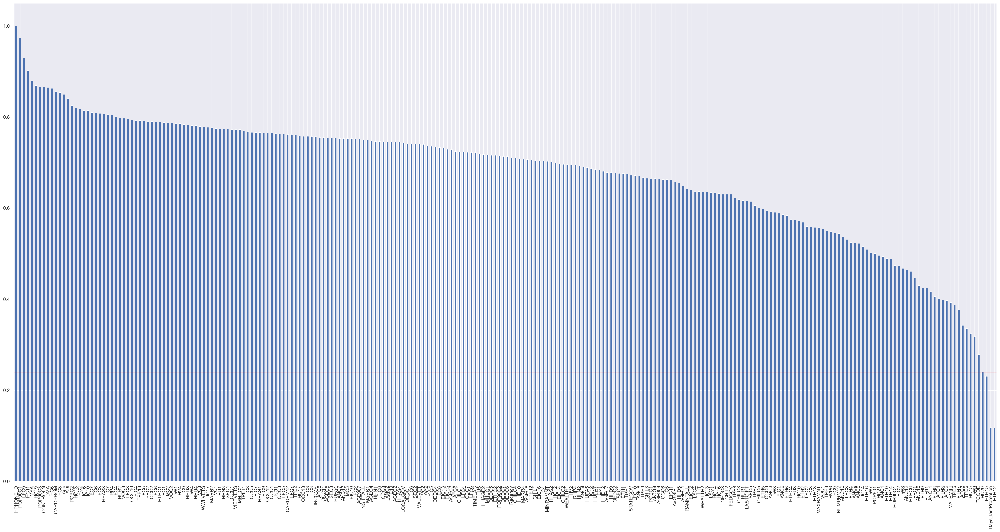

In [229]:
plt.figure(figsize=(40,20), dpi=200)
mad.sort_values(ascending=False).plot(kind='bar')
plt.axhline(y=0.239900, color='red')

In [230]:
donors=donors.drop(columns={"HC20","ETH15","ETH12","Days_lastPromotion","RP4","WEALTH1","LFC9","LFC8","ETHC2","HHD5","LSC1",
                            "HU1","HC19","DW1","ETH1","VOC1","HC17","HC21","HC20","HU3"})
# we are eliminating from mad the smallest values until the big jump and in the discrimination ratio the variables equal to 0

In [231]:
metric_features=donors.select_dtypes(exclude=[object]).columns
len(metric_features)

227

In [232]:
non_metric_features=donors.select_dtypes(include=[object]).columns
len(non_metric_features)

84

<hr>
<a class="anchor" id="pca">
    
# 8. PCA
    
</a>

In [233]:
df_pca = donors.copy()

In [234]:
pca = PCA()
pca_feat = pca.fit_transform(df_pca[metric_features])
pca_feat  

array([[-2.06883269e+00, -3.36921067e+00,  2.45327854e+00, ...,
         3.54701768e-02,  2.04967284e-04,  8.03858281e-03],
       [ 1.61563544e+01,  4.63154361e-01, -4.37258905e+00, ...,
         9.91518444e-03, -4.31969589e-04,  6.77620941e-03],
       [-4.56922480e+00, -4.26581865e+00,  1.87614813e+00, ...,
         2.04489342e-02,  4.15669526e-03,  6.29652181e-03],
       ...,
       [ 9.83092510e+00, -4.44263645e+00, -1.85557310e+00, ...,
        -1.58481363e-02, -4.83647938e-04,  6.88714590e-03],
       [-3.18393398e+00, -2.26448945e-01, -4.90616453e+00, ...,
         2.97772801e-04, -7.62083710e-04, -4.36101896e-03],
       [ 6.26173717e+00, -1.38481248e+00, -1.53993373e+00, ...,
         1.77916768e-02, -2.82222079e-03,  1.98303775e-03]])

In [235]:
# Output PCA table
PCA_table=pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)
PCA_table

,Eigenvalue,Difference,Proportion,Cumulative
1,24.315348,0.000000,1.071149e-01,0.107115
2,16.806310,-7.509038,7.403579e-02,0.181151
3,15.285449,-1.520862,6.733603e-02,0.248487
4,8.367564,-6.917884,3.686111e-02,0.285348
5,7.473296,-0.894268,3.292165e-02,0.318269
6,6.721488,-0.751809,2.960975e-02,0.347879
7,6.108586,-0.612902,2.690977e-02,0.374789
8,5.390970,-0.717617,2.374850e-02,0.398537
9,4.864016,-0.526954,2.142714e-02,0.419965
10,3.649183,-1.214833,1.607552e-02,0.436040


In [236]:
PCA_table.loc[PCA_table["Eigenvalue"]>1]

,Eigenvalue,Difference,Proportion,Cumulative
1,24.315348,0.000000,0.107115,0.107115
2,16.806310,-7.509038,0.074036,0.181151
3,15.285449,-1.520862,0.067336,0.248487
4,8.367564,-6.917884,0.036861,0.285348
5,7.473296,-0.894268,0.032922,0.318269
6,6.721488,-0.751809,0.029610,0.347879
7,6.108586,-0.612902,0.026910,0.374789
8,5.390970,-0.717617,0.023749,0.398537
9,4.864016,-0.526954,0.021427,0.419965
10,3.649183,-1.214833,0.016076,0.436040


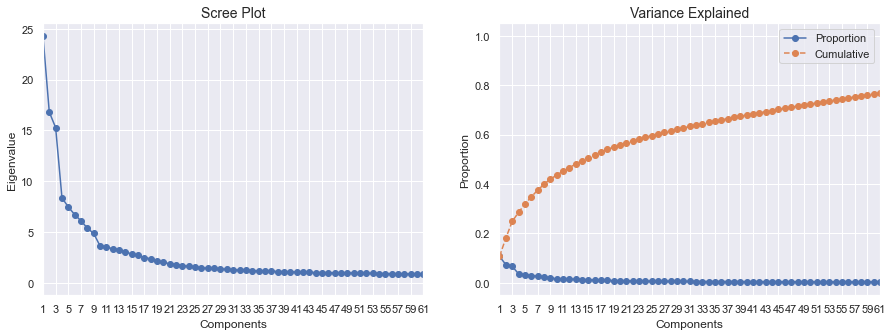

In [237]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax1.set_xlim(0, 60)
ax2.set_xlim(0, 60)
plt.show()

In [238]:
pca = PCA(n_components=47)
pca_feat = pca.fit_transform(df_pca[metric_features])


In [239]:
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,...,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46
0,-2.068834,-3.369211,2.453263,-1.246233,0.155480,1.250476,-1.893961,-0.524999,2.572054,-0.245020,...,-0.468506,-0.277857,-0.342216,-0.114470,-1.465854,-0.506208,-0.301451,-1.183133,-0.160694,-0.722833
1,16.156352,0.463155,-4.372596,-8.871266,2.457302,-6.226889,3.215226,-1.451638,-0.609628,2.935743,...,0.125934,-1.298229,-1.280853,-0.082110,-1.707285,1.246176,1.743188,1.856887,0.615711,-2.541671
2,-4.569225,-4.265817,1.876159,-0.239756,0.124270,-0.291940,-0.655125,-1.959715,-2.071439,2.126873,...,-0.494085,0.110768,-0.232307,0.341934,0.720401,0.519432,0.221779,-1.059588,0.310470,0.244628
3,-3.467879,0.037827,-2.753291,-4.197797,1.209759,-5.843750,3.992450,-5.188732,2.170710,-1.223943,...,0.002186,0.557465,-0.067970,0.149998,-0.093712,-1.283841,0.348744,0.084281,-0.591824,0.907215
4,-5.904806,0.676656,-0.252832,-5.147627,-1.064205,3.837282,1.900870,8.344701,-1.643405,0.433190,...,0.155462,-0.020323,-0.171968,0.267389,0.511984,0.503453,-0.288913,1.425058,0.340979,-2.283604
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90498,-1.675794,-3.273445,2.223365,0.678358,-0.825502,-2.823349,0.947664,0.214828,-1.563909,1.321447,...,0.222614,-0.216134,-0.312653,1.025303,-0.474793,0.221812,0.681270,1.177134,-0.666549,-0.574020
90499,3.803525,0.294411,-5.654655,4.687270,-0.183631,1.349729,4.736758,3.328983,1.797567,1.455676,...,2.735272,0.211040,-0.662158,1.602806,2.155079,-0.056052,1.046605,-0.888105,0.523047,-0.223583
90500,9.830926,-4.442635,-1.855579,-0.421066,2.812399,-0.611312,1.673400,-0.002271,-3.711554,-3.670838,...,-0.210604,0.307920,-0.680788,0.579440,0.529697,-2.182034,0.717701,0.247983,0.052932,0.986581
90501,-3.183938,-0.226470,-4.906186,-0.633590,0.310661,6.024819,0.822496,0.434485,1.264146,-1.055019,...,1.121528,1.241470,0.600375,-1.291826,1.726978,-1.181018,0.696086,-1.556257,0.473439,-0.502848


In [240]:
df_pca = pd.concat([df_pca, pca_df], axis=1)
df_pca.head()

,OSOURCE,TCODE,STATE,ZIP,MAILCODE,NOEXCH,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,...,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46
0,GRI,-0.161431,IL,61081,O,0,XXXX,T2,U,N,...,-0.468506,-0.277857,-0.342216,-0.114470,-1.465854,-0.506208,-0.301451,-1.183133,-0.160694,-0.722833
1,BOA,-0.154633,CA,91326,O,0,XXXX,S1,H,N,...,0.125934,-1.298229,-1.280853,-0.082110,-1.707285,1.246176,1.743188,1.856887,0.615711,-2.541671
2,AMH,-0.154633,NC,27017,O,0,XXXX,R2,U,N,...,-0.494085,0.110768,-0.232307,0.341934,0.720401,0.519432,0.221779,-1.059588,0.310470,0.244628
3,BRY,-0.161431,CA,95953,O,0,XXXX,R2,U,N,...,0.002186,0.557465,-0.067970,0.149998,-0.093712,-1.283841,0.348744,0.084281,-0.591824,0.907215
4,MBC,-0.161431,FL,33176,O,0,XXXX,S2,H,N,...,0.155462,-0.020323,-0.171968,0.267389,0.511984,0.503453,-0.288913,1.425058,0.340979,-2.283604


In [241]:
df_pca[[i for i in list(df_pca.columns) if i not in non_metric_features]]

,TCODE,INCOME,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,...,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46
0,-0.161431,0.049363,-0.479366,-0.253308,0.741294,0.276095,-0.839251,0.731683,-0.506822,-0.527263,...,-0.468506,-0.277857,-0.342216,-0.114470,-1.465854,-0.506208,-0.301451,-1.183133,-0.160694,-0.722833
1,-0.154633,1.272994,1.962100,-0.253308,-1.390990,1.678309,-1.239803,-0.200894,-0.506822,-0.527263,...,0.125934,-1.298229,-1.280853,-0.082110,-1.707285,1.246176,1.743188,1.856887,0.615711,-2.541671
2,-0.154633,-0.562453,-0.174183,-0.253308,-0.946764,-0.057766,0.019076,-0.200894,0.680313,-0.527263,...,-0.494085,0.110768,-0.232307,0.341934,0.720401,0.519432,0.221779,-1.059588,0.310470,0.244628
3,-0.161431,-1.786084,-0.174183,-0.253308,-0.680229,-1.059347,-0.095368,-0.900327,-0.902534,-0.014870,...,0.002186,0.557465,-0.067970,0.149998,-0.093712,-1.283841,0.348744,0.084281,-0.591824,0.907215
4,-0.161431,-0.562453,8.676131,0.027190,-0.236003,-1.393208,1.163511,4.461994,-0.308966,-0.271067,...,0.155462,-0.020323,-0.171968,0.267389,0.511984,0.503453,-0.288913,1.425058,0.340979,-2.283604
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90498,-0.161431,1.272994,1.046550,0.307689,1.185519,-0.258082,0.762959,4.228849,0.878169,-0.527263,...,0.222614,-0.216134,-0.312653,1.025303,-0.474793,0.221812,0.681270,1.177134,-0.666549,-0.574020
90499,-0.154633,0.049363,-0.479366,3.673669,0.474758,1.144132,-1.239803,0.032250,0.680313,2.547095,...,2.735272,0.211040,-0.662158,1.602806,2.155079,-0.056052,1.046605,-0.888105,0.523047,-0.223583
90500,-0.154633,1.884809,-0.326775,-0.253308,0.030532,0.877043,-0.782029,-0.667183,-0.704678,-0.783460,...,-0.210604,0.307920,-0.680788,0.579440,0.529697,-2.182034,0.717701,0.247983,0.052932,0.986581
90501,-0.154633,0.049363,-0.479366,-0.253308,-1.124455,1.077360,-0.724807,0.032250,3.648151,-0.783460,...,1.121528,1.241470,0.600375,-1.291826,1.726978,-1.181018,0.696086,-1.556257,0.473439,-0.502848


In [242]:
def _color_red_or_green(val):
    if val < -0.40:
        color = 'background-color: red'
    elif val > 0.40:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca[[i for i in list(df_pca.columns) if i not in non_metric_features]].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46
TCODE,0.008185,-0.023806,0.018171,0.013729,-0.003808,-0.018627,-0.001586,-0.003557,0.006291,-0.002326,0.035032,-0.040251,0.007705,0.021614,-0.008195,0.000598,-0.002013,-0.005476,-0.015087,0.003900,0.005611,-0.000870,-0.011025,0.005434,-0.023494,0.027788,-0.010914,0.032450,0.000094,-0.064126,-0.028016,-0.093773,-0.069939,0.066782,0.057931,0.056580,-0.024037,-0.074202,-0.022086,0.009785,0.265161,-0.043787,0.098385,0.083522,0.565700,0.363172,0.053431
INCOME,0.406195,-0.029828,-0.011800,-0.035392,0.086250,-0.043855,0.026419,0.028226,-0.080219,-0.003405,-0.065912,0.067125,-0.008386,0.016198,-0.003134,0.012377,-0.006088,-0.039227,-0.022736,0.006774,0.036865,0.072094,0.002111,-0.029346,0.002403,0.003519,0.026850,-0.058897,0.033544,-0.118455,0.064336,0.019800,0.065483,0.026541,0.033184,0.059699,-0.110286,-0.063191,-0.004699,-0.030449,0.022325,0.013503,0.014482,-0.032560,0.230869,-0.017342,-0.283436
HIT,0.068054,0.042092,0.048334,-0.020610,-0.049726,0.110724,-0.028985,0.060326,0.078480,-0.078373,0.072903,-0.036876,0.034444,0.051840,0.019223,-0.033892,-0.028635,-0.007552,-0.004826,0.023249,-0.090941,-0.015987,0.071232,0.007722,0.087023,0.061347,-0.272128,-0.059749,-0.121448,0.567179,0.011397,0.082359,-0.020431,-0.126045,0.019294,0.025690,0.062763,0.079964,0.005015,-0.013836,0.024717,0.075792,0.096483,-0.027505,0.041379,0.023017,-0.210328
MALEMILI,0.031211,-0.023566,-0.185132,0.350867,-0.025348,0.031189,0.314682,0.323959,0.200556,0.201298,-0.058605,-0.050864,0.468854,-0.125568,-0.127610,0.047775,-0.019430,-0.071027,0.004927,-0.025118,0.097831,-0.039064,-0.013879,-0.008269,0.005432,-0.051599,-0.027096,0.053654,-0.133217,-0.030756,-0.065047,0.024484,-0.005119,0.011110,0.045721,0.012417,-0.054151,0.035340,0.058873,-0.001080,0.020233,0.026155,0.027280,-0.024272,-0.016770,-0.006317,-0.053670
MALEVET,0.046997,-0.044296,0.426738,0.172598,-0.256157,-0.036286,0.086964,0.308706,0.161572,-0.027315,-0.097109,-0.011954,-0.084752,0.005267,0.097143,-0.116215,0.100615,-0.083327,-0.036472,-0.018773,-0.069149,0.015996,0.130791,0.005283,0.106554,0.084721,-0.061049,-0.071457,0.043946,0.083861,0.020017,-0.155339,0.138006,0.030173,-0.045214,-0.086399,-0.147953,0.077629,-0.027076,-0.106402,0.046739,-0.066677,-0.029517,-0.075240,0.037888,0.047634,-0.014108
VIETVETS,0.173000,-0.318671,-0.342844,0.181812,0.041630,0.079758,0.112590,0.034508,0.002798,0.018599,-0.034182,-0.017292,-0.052139,-0.010219,0.037859,-0.085644,0.125915,0.001745,0.223320,-0.113664,-0.047852,0.135510,0.063563,0.186396,0.114842,0.079656,-0.084142,-0.141749,-0.144989,0.034478,0.083331,-0.287432,0.137680,0.185021,0.055365,-0.192743,-0.243942,0.065145,0.031904,-0.071055,0.057527,-0.071836,0.072051,-0.117828,-0.088956,-0.038983,-0.030499
WWIIVETS,-0.119734,0.291104,0.509152,-0.164635,-0.228888,-0.088740,-0.006765,0.087147,0.066255,-0.094535,-0.012777,0.015174,-0.057489,-0.023235,-0.069369,0.128974,-0.108731,-0.015700,-0.136812,0.042854,-0.031767,-0.078138,0.055454,-0.048531,-0.042387,-0.031150,-0.067116,0.047031,-0.002898,0.013238,0.039721,0.006815,0.123937,0.024311,0.008019,-0.021460,0.049416,0.035068,-0.033596,-0.092935,0.007988,0.156637,0.041772,-0.047094,0.063879,0.015528,0.077756
LOCALGOV,-0.056431,-0.036971,0.027567,-0.162296,-0.077209,0.092997,0.236381,0.235898,0.160811,-0.051656,-0.080835,-0.092486,-0.378879,0.091491,-0.170703,0.008454,0.033856,0.071767,-0.119664,-0.055005,0.337599,0.229756,-0.053647,-0.025932,0.404285,-0.099151,0.015482,0.136735,-0.083846,0.104638,-0.048991,-0.017220,-0.005628,0.141588,-0.037156,-0.071936,-0.027492,0.022898,-0.025573,-0.025014,0.006470,-0.008050,0.044794,-0.042446,0.044674,0.043250,0.050273
STATEGOV,-0.076754,-0.015133,0.008183,0.044973,0.080600,0.309563,0.426848,0.029766,-0.092888,0.018592,0.110433,0.063915,-0.310130,0.079512,0.00130

In [243]:
loadings_excel = loadings.style.applymap(_color_red_or_green)
loadings_excel.to_excel('loadings_pca.xlsx')

In [244]:
loadings_pca = pca.components_
loadings_pca=np.transpose(loadings_pca)

In [245]:
df_pca[metric_features].columns.shape

(227,)

In [246]:
len(pca_feat_names)

47

In [247]:
pca_table = pd.DataFrame(loadings_pca, index=df_pca[metric_features].columns,columns=pca_feat_names)
print('PCA loadings \n%s' %pca_table)

PCA loadings 
               PC0       PC1       PC2       PC3       PC4       PC5  \
TCODE     0.001660 -0.005807  0.004648  0.004746 -0.001393 -0.007185   
INCOME    0.082375 -0.007276 -0.003018 -0.012235  0.031550 -0.016916   
HIT       0.013801  0.010268  0.012363 -0.007125 -0.018190  0.042708   
MALEMILI  0.006330 -0.005748 -0.047353  0.121296 -0.009272  0.012030   
MALEVET   0.009531 -0.010805  0.109150  0.059668 -0.093703 -0.013996   
VIETVETS  0.035084 -0.077734 -0.087692  0.062853  0.015228  0.030764   
WWIIVETS -0.024282  0.071009  0.130230 -0.056915 -0.083728 -0.034229   
LOCALGOV -0.011444 -0.009018  0.007051 -0.056106 -0.028243  0.035871   
STATEGOV -0.015566 -0.003691  0.002093  0.015547  0.029484  0.119404   
FEDGOV   -0.001746 -0.014760 -0.040421  0.080168 -0.013432  0.019782   
WEALTH2   0.104167  0.002883  0.010156  0.009818  0.029682  0.031385   
POP901   -0.001600 -0.002520 -0.029798  0.017322 -0.014042 -0.032747   
POP90C1   0.083946  0.110076 -0.085036 -0.022896 -

In [248]:
pca_table["PC43"].nlargest(3)

ANC15    0.251238
ANC14    0.194453
ETH14    0.173492
Name: PC43, dtype: float64

In [249]:
pca_table["PC43"].nsmallest(3)

TPE6      -0.237131
EIC8      -0.211723
TIMELAG   -0.168025
Name: PC43, dtype: float64

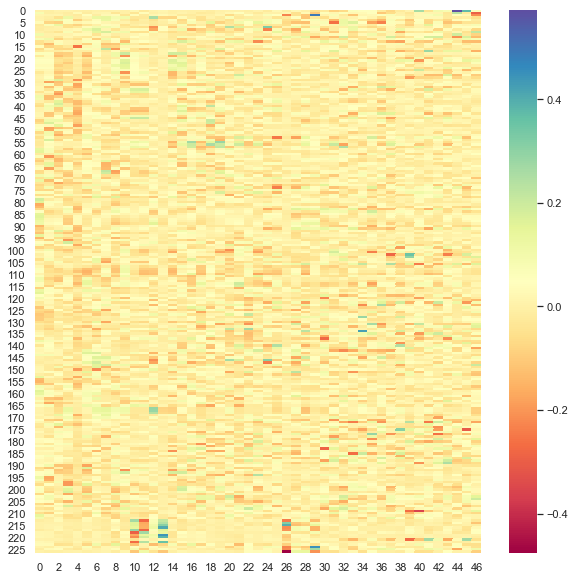

In [250]:
# Check the correlation of the loadings
fig, ax = plt.subplots(figsize=(10,10))  
sns.heatmap(loadings_pca, cmap='Spectral')
plt.show()


<hr>
<a class="anchor" id="clustering">
    
# 9. Clustering
    
</a>

In [251]:
# pca_features = df_pca.columns[df_pca.columns.str.startswith('PC')]
# pca_features=pca_features.drop('PCOWNERS')
# pca_features

In [252]:
metric_features

Index(['TCODE', 'INCOME', 'HIT', 'MALEMILI', 'MALEVET', 'VIETVETS', 'WWIIVETS',
       'LOCALGOV', 'STATEGOV', 'FEDGOV',
       ...
       'NGIFTALL', 'MINRAMNT', 'MAXRAMNT', 'LASTGIFT', 'TIMELAG', 'AVGGIFT',
       'CONTROLN', 'HPHONE_D', 'Age', 'Recency'],
      dtype='object', length=227)

<hr>
<a class="anchor" id="kmeans">
    
## 9.1. K-means - all donors dataset
    
</a>

In [253]:
range_clusters = range(1, 15)

In [254]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1, n_jobs=-1)
    kmclust.fit(donors[metric_features])
    inertia.append(kmclust.inertia_)

In [255]:
inertia[0]

20544180.99999987

In [256]:
ini=[]
for i in range(1,14):
    ini.append(round(inertia[i-1]-inertia[i],2))
print(ini)

[1508224.3, 788619.36, 663285.45, 551603.94, 452022.43, 385934.89, 329107.11, 264378.16, 250708.71, 196740.83, 185623.0, 168996.75, 149314.63]


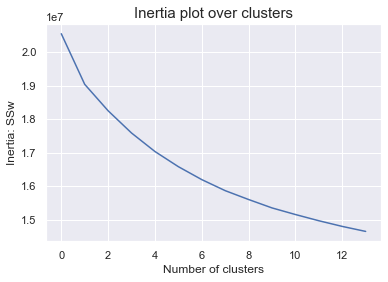

In [257]:
# The inertia plot
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

In [258]:
number_clusters = 3
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1, n_jobs=-1)
km_labels = kmclust.fit_predict(donors[metric_features])
km_labels

array([2, 1, 2, ..., 1, 0, 1])

In [259]:
df_kmeans = pd.concat((donors, pd.Series(km_labels, name='labels')), axis=1)
df_kmeans_mean=df_kmeans.groupby('labels').mean()
df_kmeans_mean

,TCODE,INCOME,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,...,NGIFTALL,MINRAMNT,MAXRAMNT,LASTGIFT,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,Age,Recency
labels,,,,,,,,,,,,,,,,,,,,,
0,-0.035156,-0.251087,-0.011176,0.148368,-0.430228,-0.107988,-0.116212,-0.022180,0.016014,0.111825,...,-0.043030,0.057108,0.015430,0.020855,-0.024573,0.039893,0.186578,-0.113713,0.015051,0.000953
1,0.007091,0.497324,0.079424,0.030793,0.043786,0.223641,-0.164596,-0.027187,-0.077257,0.003449,...,-0.096096,0.092822,0.095449,0.104622,0.039360,0.128587,0.151222,0.033436,-0.065892,0.011289
2,0.013116,-0.235140,-0.052637,-0.100047,0.192150,-0.108308,0.181773,0.031581,0.048519,-0.060860,...,0.093181,-0.098112,-0.078309,-0.087892,-0.016158,-0.115462,-0.208626,0.034693,0.040655,-0.008807


In [260]:
kmeans_loadings=kmclust.transform(donors[metric_features])
kmeans_loadings_table=pd.DataFrame(kmclust.transform(donors[metric_features]))

In [261]:
print(df_kmeans["labels"].value_counts())

2    40087
1    29509
0    20907
Name: labels, dtype: int64


In [262]:
df_kmeans

,OSOURCE,TCODE,STATE,ZIP,MAILCODE,NOEXCH,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,...,AVGGIFT,CONTROLN,HPHONE_D,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Age,Recency,labels
0,GRI,-0.161431,IL,61081,O,0,XXXX,T2,U,N,...,-0.682168,0.002178,-1.006062,X,X,X,C,0.220585,-0.092966,2
1,BOA,-0.154633,CA,91326,O,0,XXXX,S1,H,N,...,0.308558,0.963193,-1.006062,X,X,X,A,-0.812616,-0.092966,1
2,AMH,-0.154633,NC,27017,O,0,XXXX,R2,U,N,...,-0.714729,-1.455784,0.993974,X,X,X,C,-0.537096,-0.092966,2
3,BRY,-0.161431,CA,95953,O,0,XXXX,R2,U,N,...,-0.798363,1.398586,0.993974,X,X,X,C,0.840505,-0.092966,0
4,MBC,-0.161431,FL,33176,O,0,XXXX,S2,H,N,...,-0.791816,-1.600172,0.993974,X,X,X,A,1.391545,-0.350495,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90498,LHJ,-0.161431,FL,32776-,O,0,XXXX,S2,H,N,...,-1.228109,-1.093092,-1.006062,X,X,X,C,-0.537096,-0.608024,2
90499,ASE,-0.154633,AK,99504,O,0,XXXX,C2,U,N,...,1.475382,1.616310,-1.006062,X,X,X,C,-0.537096,-0.608024,1
90500,DCD,-0.154633,TX,77379,O,0,XXXX,C1,H,N,...,0.850298,0.495029,0.993974,X,X,X,A,-0.674856,-0.848939,1
90501,MBC,-0.154633,MI,48910,O,0,XXXX,C3,U,N,...,-0.614186,1.708261,0.993974,X,X,X,B,0.151705,-2.626722,0


In [263]:
# Look at metric_features mean grouped by labels (Clusters)
mean_kmeans = df_kmeans.groupby('labels').mean()[metric_features]
mean_kmeans

,TCODE,INCOME,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,...,NGIFTALL,MINRAMNT,MAXRAMNT,LASTGIFT,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,Age,Recency
labels,,,,,,,,,,,,,,,,,,,,,
0,-0.035156,-0.251087,-0.011176,0.148368,-0.430228,-0.107988,-0.116212,-0.022180,0.016014,0.111825,...,-0.043030,0.057108,0.015430,0.020855,-0.024573,0.039893,0.186578,-0.113713,0.015051,0.000953
1,0.007091,0.497324,0.079424,0.030793,0.043786,0.223641,-0.164596,-0.027187,-0.077257,0.003449,...,-0.096096,0.092822,0.095449,0.104622,0.039360,0.128587,0.151222,0.033436,-0.065892,0.011289
2,0.013116,-0.235140,-0.052637,-0.100047,0.192150,-0.108308,0.181773,0.031581,0.048519,-0.060860,...,0.093181,-0.098112,-0.078309,-0.087892,-0.016158,-0.115462,-0.208626,0.034693,0.040655,-0.008807


In [264]:
mean_kmeansT = mean_kmeans.T
mean_kmeansT

labels,0,1,2
TCODE,-0.035156,0.007091,0.013116
INCOME,-0.251087,0.497324,-0.235140
HIT,-0.011176,0.079424,-0.052637
MALEMILI,0.148368,0.030793,-0.100047
MALEVET,-0.430228,0.043786,0.192150
VIETVETS,-0.107988,0.223641,-0.108308
WWIIVETS,-0.116212,-0.164596,0.181773
LOCALGOV,-0.022180,-0.027187,0.031581
STATEGOV,0.016014,-0.077257,0.048519
FEDGOV,0.111825,0.003449,-0.060860


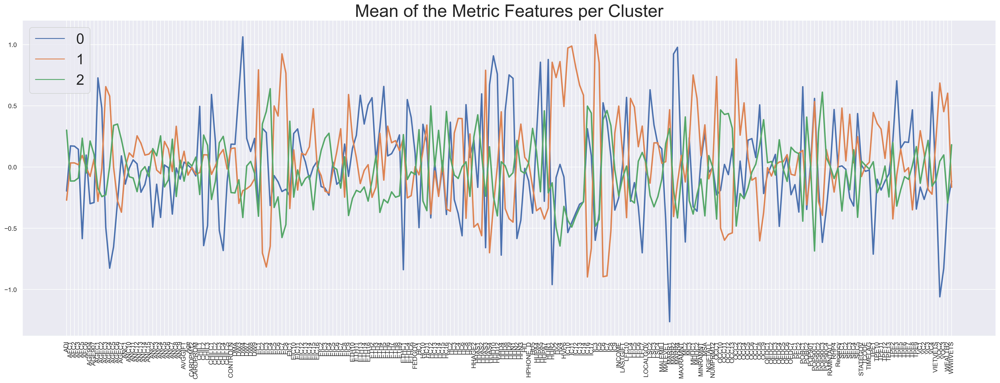

In [265]:
# Visualize the mean for metric features per cluster
plt.figure(figsize = (30,10), dpi=300)
plt.xticks(rotation=90)
plt.title('Mean of the Metric Features per Cluster', fontdict = {'fontsize': 30})

sns.lineplot(data=mean_kmeansT, dashes = False, linewidth=2.5)
plt.legend(fontsize=25)

**K-means - using PCA loadings**

In [266]:
# inertia_pca = []
# for n_clus in range_clusters:  # iterate over desired ncluster range
#     kmclust_pca = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=0, n_jobs=-1)
#     kmclust_pca.fit(df_pca[pca_features])
#     inertia_pca.append(kmclust_pca.inertia_)

In [267]:
# # The inertia plot
# plt.plot(inertia_pca)
# plt.ylabel("Inertia: SSw")
# plt.xlabel("Number of clusters")
# plt.title("Inertia plot over clusters", size=15)
# plt.show()

In [268]:
# number_clusters = 3
# kmclust_pca = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1, n_jobs=-1)
# km_labels_pca = kmclust_pca.fit_predict(df_pca[pca_features])
# km_labels_pca

In [269]:
# df_kmeans_pca = pd.concat((df_pca, pd.Series(km_labels_pca, name='labels')), axis=1)
# df_kmeans_pca.groupby('labels').mean()

In [270]:
# print(df_kmeans_pca["labels"].value_counts())

**Visualization**

In [271]:
# plt.figure(figsize=(12,6),dpi=200)

# plt.subplot(1,2,1)
# sns.scatterplot(x='VIETVETS',y='WWIIVETS',data=df_kmeans,hue='labels')

# plt.subplot(1,2,2)
# sns.scatterplot(x='VIETVETS',y='WWIIVETS',data=df_kmeans_pca,hue='labels')

In [272]:
# import seaborn as sns


# # Draw a pointplot to show pulse as a function of three categorical factors
# g = sns.catplot(x="INCOME", y="GENDER", col="labels",
#                 capsize=.2, height=6, aspect=.75,
#                 kind="point", data=df_kmeans)
# g.despine(left=True)

In [273]:
# # Draw a pointplot to show pulse as a function of three categorical factors
# g = sns.catplot(x="INCOME", y="GENDER", col="labels",
#                 capsize=.2, height=6, aspect=.75,
#                 kind="point", data=df_kmeans_pca)
# g.despine(left=True)

<hr>
<a class="anchor" id="perspectives">
    
## 9.2. Clustering using different perspectives
    
</a>

In [274]:
donors_f=donors.copy()

In [275]:
donors_features = ['Age','Recency','AVGGIFT','HPHONE_D','NUMPRM12','INCOME']

neighborhood_features = ['POP90C1','HC13', 'PEC1', 'TPE3','IC3','AFC1','EC1','OEDC1','VC3','EIC13','EIC14',
                        'EIC3','EIC4','EIC5']
df_donf = donors_f[donors_features].copy()
df_neighf = donors_f[neighborhood_features].copy()

In [276]:
df_donf.dtypes

Age         float64
Recency     float64
AVGGIFT     float64
HPHONE_D    float64
NUMPRM12    float64
INCOME      float64
dtype: object

In [277]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=20):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=10,
    random_state=1
)


***donors_features***

In [278]:
#Finding optimal cluster
r2_scores = {}
r2_scores['kmeans_donf'] = get_r2_scores(df_donf, kmeans)
r2_scores['kmeans_neighf'] = get_r2_scores(df_neighf, kmeans)

pd.DataFrame(r2_scores)

,kmeans_donf,kmeans_neighf
2,0.170157,0.104440
3,0.310252,0.162385
4,0.390982,0.211495
5,0.442551,0.254003
6,0.491963,0.293104
7,0.525656,0.336673
8,0.556806,0.372297
9,0.579248,0.406697
10,0.599229,0.429880
11,0.615445,0.447889


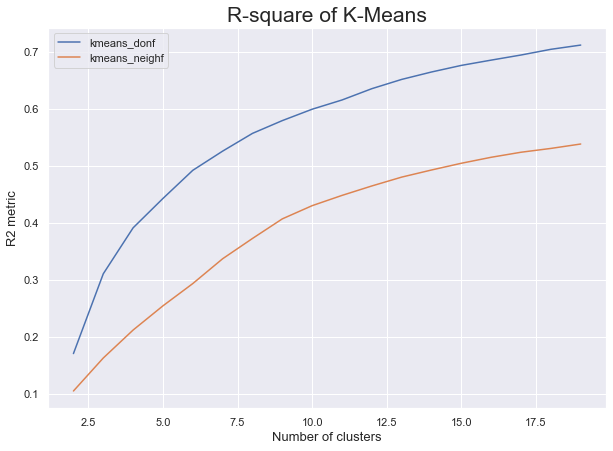

In [279]:
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))
plt.title("R-square of K-Means", fontsize=21)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

In [280]:
# Applying the right clustering (algorithm and number of clusters) for each perspective
kmeans_donf = KMeans(
    n_clusters=3,
    init='k-means++',
    n_init=10,
    random_state=0
)
donf_labels = kmeans_donf.fit_predict(df_donf)

kmeans_neighf = KMeans(
    n_clusters=3,
    init='k-means++',
    n_init=10,
    random_state=0
)
neighf_labels = kmeans_neighf.fit_predict(df_neighf)

donors_f['donf_labels'] = donf_labels
donors_f['neighf_labels'] = neighf_labels

In [281]:
# Look at donors_features mean grouped by donf_labels (Donors Clusters)
donors_f.groupby('donf_labels').mean()[donors_features]

,Age,Recency,AVGGIFT,HPHONE_D,NUMPRM12,INCOME
donf_labels,,,,,,
0,0.106036,0.131087,-0.078222,0.993974,-0.196549,-0.027827
1,-0.157113,0.129453,0.031122,-1.006062,-0.208777,0.037906
2,0.378667,-1.985703,0.363369,0.011544,3.088590,-0.074164


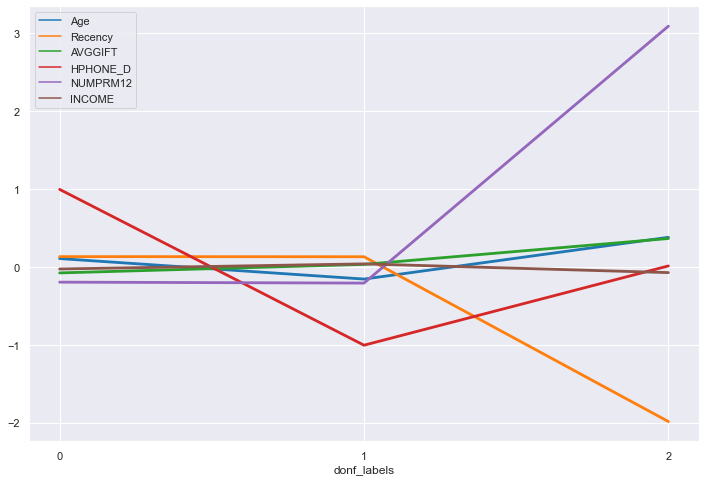

In [282]:
# Visualize the mean for metric features per donor cluster
ax = plt.figure(figsize = (12, 8)).gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

sns.lineplot(data=donors_f.groupby('donf_labels').mean()[donors_features], dashes = False, linewidth=2.8, palette='tab10')

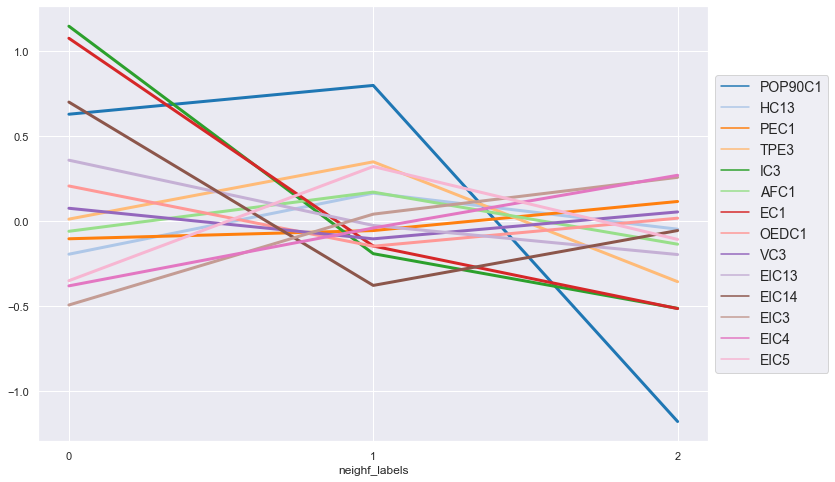

In [283]:
# Visualize the mean for metric features per neighborhood cluster
ax = plt.figure(figsize = (12, 8)).gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

sns.lineplot(data=donors_f.groupby('neighf_labels').mean()[neighborhood_features], dashes = False, linewidth=3.0, palette='tab20')
ax.legend(fontsize=14, loc="center left", bbox_to_anchor=(1, 0.5))

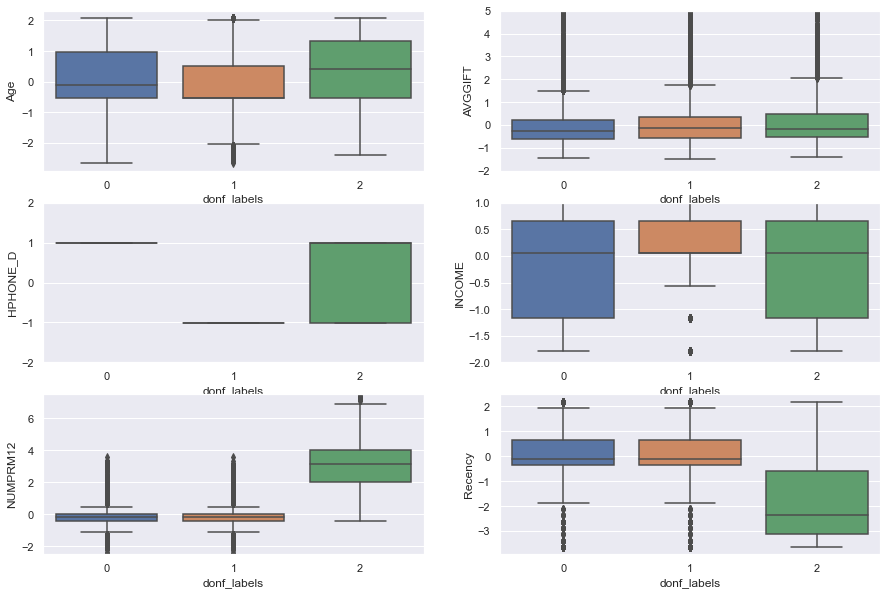

In [284]:
# plotting sub-plots to analyse the distribution of Donors Clusters

plt.figure(figsize=(15,10))

plt.subplot(3,2,1)
sns.boxplot(x='donf_labels', y='Age', data=donors_f)

plt.subplot(3,2,2)
sns.boxplot(x='donf_labels', y='AVGGIFT', data=donors_f)
plt.ylim(-2,5)

plt.subplot(3,2,3)
sns.boxplot(x='donf_labels', y='HPHONE_D', data=donors_f)
plt.ylim(-2,2)

plt.subplot(3,2,4)
sns.boxplot(x='donf_labels', y='INCOME', data=donors_f)
plt.ylim(-2,1)

plt.subplot(3,2,5)
sns.boxplot(x='donf_labels', y='NUMPRM12', data=donors_f)
plt.ylim(-2.5,7.5)

plt.subplot(3,2,6)
sns.boxplot(x='donf_labels', y='Recency', data=donors_f)

(-2.5, 2.5)

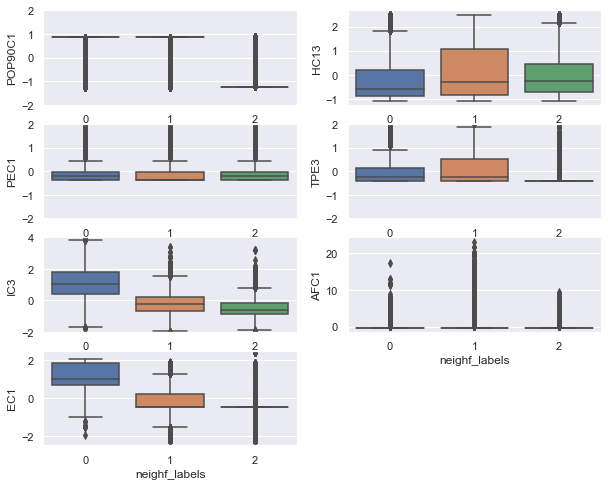

In [285]:
# plotting sub-plots to analyse the distribution of Donors Clusters

plt.figure(figsize=(10,8))

plt.subplot(4,2,1)
sns.boxplot(x='neighf_labels', y='POP90C1', data=donors_f)
plt.ylim(-2,2)

plt.subplot(4,2,2)
sns.boxplot(x='neighf_labels', y='HC13', data=donors_f)

plt.subplot(4,2,3)
sns.boxplot(x='neighf_labels', y='PEC1', data=donors_f)
plt.ylim(-2,2)

plt.subplot(4,2,4)
sns.boxplot(x='neighf_labels', y='TPE3', data=donors_f)
plt.ylim(-2,2)

plt.subplot(4,2,5)
sns.boxplot(x='neighf_labels', y='IC3', data=donors_f)
plt.ylim(-2,4)

plt.subplot(4,2,6)
sns.boxplot(x='neighf_labels', y='AFC1', data=donors_f)

plt.subplot(4,2,7)
sns.boxplot(x='neighf_labels', y='EC1', data=donors_f)
plt.ylim(-2.5,2.5)

(-5.0, 5.0)

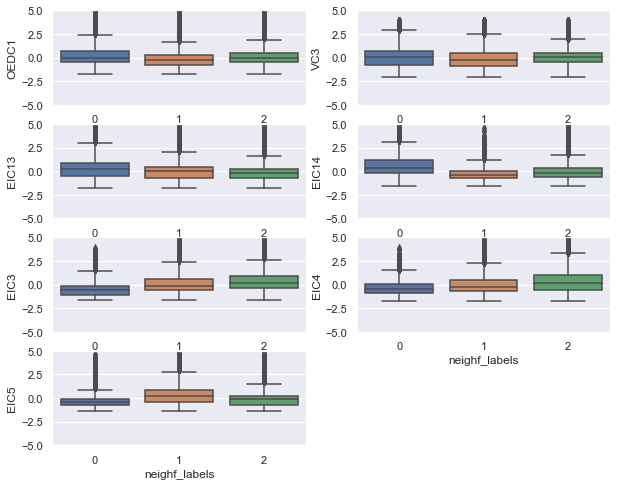

In [286]:
# plotting sub-plots to analyse the distribution of Donors Clusters

plt.figure(figsize=(10,8))

plt.subplot(4,2,1)
sns.boxplot(x='neighf_labels', y='OEDC1', data=donors_f)
plt.ylim(-5,5)

plt.subplot(4,2,2)
sns.boxplot(x='neighf_labels', y='VC3', data=donors_f)
plt.ylim(-5,5)

plt.subplot(4,2,3)
sns.boxplot(x='neighf_labels', y='EIC13', data=donors_f)
plt.ylim(-5,5)

plt.subplot(4,2,4)
sns.boxplot(x='neighf_labels', y='EIC14', data=donors_f)
plt.ylim(-5,5)

plt.subplot(4,2,5)
sns.boxplot(x='neighf_labels', y='EIC3', data=donors_f)
plt.ylim(-5,5)

plt.subplot(4,2,6)
sns.boxplot(x='neighf_labels', y='EIC4', data=donors_f)
plt.ylim(-5,5)

plt.subplot(4,2,7)
sns.boxplot(x='neighf_labels', y='EIC5', data=donors_f)
plt.ylim(-5,5)

**Joining the 2 Perspectives - Donors & Neighborhood**

In [287]:
donors_f.groupby(['donf_labels', 'neighf_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('neighf_labels', 'donf_labels', 0)

donf_labels,0,1,2
neighf_labels,,,
0,10451,9287,1494
1,16166,16199,2133
2,16073,16755,1945


In [288]:
df_centroids = donors_f.groupby(['neighf_labels',  'donf_labels']).mean()
df_centroids.index

MultiIndex([(0, 0),
            (0, 1),
            (0, 2),
            (1, 0),
            (1, 1),
            (1, 2),
            (2, 0),
            (2, 1),
            (2, 2)],
           names=['neighf_labels', 'donf_labels'])

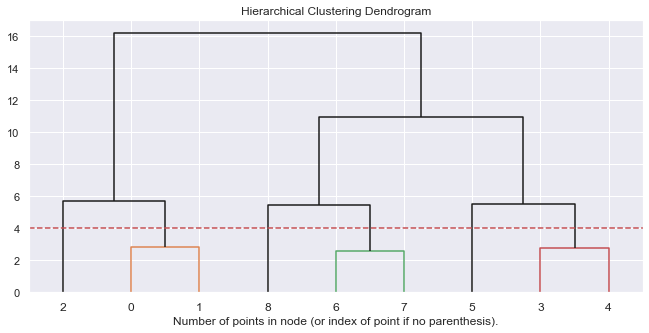

In [289]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 4
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None,linkage='ward', affinity='euclidean')

model = model.fit(df_centroids)
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level',p=3,color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [290]:
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=6
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

df_centroids  

TCODE    INCOME       HIT  MALEMILI   MALEVET  \
neighf_labels donf_labels                                                     
0             0           -0.023687  0.539588  0.411377 -0.042189  0.082491   
              1           -0.016014  0.423686 -0.227041 -0.053996 -0.049349   
              2            0.085987  0.428983  0.262347 -0.048473 -0.163333   
1             0           -0.015265 -0.188460  0.313910  0.155866  0.094806   
              1           -0.013712 -0.027874 -0.278470  0.136747 -0.140012   
              2            0.017125 -0.232021  0.209979  0.075058 -0.199432   
2             0            0.023595 -0.235210  0.151051 -0.115668  0.088307   
              1            0.013439 -0.112327 -0.361756 -0.106254 -0.011936   
              2            0.049238 -0.287529  0.020067 -0.123803 -0.112259   

                           VIETVETS  WWIIVETS  LOCALGOV  STATEGOV    FEDGOV  \
neighf_labels donf_labels                                                     
0             0            0.083745  0.085244  0.127618  0.268812 -0.042351   
              1            0.002715  0.033790  0.202860  0.092732 -0.081850   
              2           -0.199668  0.023481  0.022107  0.117470 -0.111587   
1             0            0.053375 -0.020522 -0.135448 -0.196453  0.144639   
              1            0.053008 -0.156259 -0.093368 -0.244684  0.124244   
              2           -0.200420 -0.115836 -0.259262 -0.274645  0.036777   
2             0           -0.022326  0.084055  0.041911  0.091399 -0.100243   
              1           -0.058754  0.033662  0.026949  0.140889 -0.070131   
              2           -0.284276 -0.022994 -0.062086  0.025507 -0.140663   

                           ...  MINRAMNT  MAXRAMNT  LASTGIFT   TIMELAG  \
neighf_labels donf_labels  ...                                           
0             0            ...  0.052504  0.010841  0.040862  0.059467   
              1            ...  0.155603  0.101868  0.138085  0.043407   
              2            ... -0.018462  0.898757  0.497039 -0.035680   
1             0            ... -0.040651 -0.090776 -0.062274  0.005502   
              1            ...  0.103276 -0.012216  0.021882 -0.030436   
              2            ... -0.155561  0.593388  0.200171 -0.106942   
2             0            ... -0.114918 -0.119457 -0.099414  0.002005   
              1            ... -0.023207 -0.061829 -0.046336 -0.015516   
              2            ... -0.213011  0.490269  0.075841 -0.057259   

                            AVGGIFT  CONTROLN  HPHONE_D       Age   Recency  \
neighf_labels donf_labels                                                     
0             0            0.044118  0.086175  0.993974  0.113887  0.149256   
              1            0.166148  0.421160 -1.006062 -0.154595  0.141231   
              2            0.637237 -0.840937  0.058214  0.396611 -2.004040   
1             0           -0.085719 -0.050686  0.993974  0.141257  0.132301   
              1            0.048722  0.253917 -1.006062 -0.172022  0.133714   
              2            0.325183 -0.826273  0.016929  0.381078 -1.962313   
2             0           -0.150229 -0.169321  0.993974  0.065507  0.118054   
              1           -0.060738 -0.044739 -1.006062 -0.144095  0.118804   
              2            0.194882 -0.830771 -0.030209  0.362240 -1.997269   

                           hclust_labels  
neighf_labels donf_labels                 
0             0                        0  
              1                        0  
              2                        3  
1             0                        2  
              1                        2  
              2                        4  
2             0                        1  
              1                        1  
              2                        5  

[9 rows x 228 columns]

In [291]:
cluster_mapper=df_centroids['hclust_labels'].to_dict()
cluster_mapper

{(0, 0): 0,
 (0, 1): 0,
 (0, 2): 3,
 (1, 0): 2,
 (1, 1): 2,
 (1, 2): 4,
 (2, 0): 1,
 (2, 1): 1,
 (2, 2): 5}

In [292]:
donors_f['merged_labels'] = donors_f.apply(
    lambda row: cluster_mapper[
        (row['neighf_labels'], row['donf_labels'])
    ], axis=1
)

In [293]:
donors_f.groupby('merged_labels').mean()

,TCODE,INCOME,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,...,MAXRAMNT,LASTGIFT,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,Age,Recency,donf_labels,neighf_labels
merged_labels,,,,,,,,,,,,,,,,,,,,,
0,-0.020077,0.485054,0.110993,-0.047745,0.020459,0.045620,0.061034,0.163020,0.185964,-0.060936,...,0.053671,0.086607,0.051910,0.101535,0.243790,0.052930,-0.012438,0.145480,0.470514,0.0
1,0.018412,-0.172492,-0.110679,-0.110863,0.037144,-0.040918,0.058335,0.034274,0.116658,-0.084874,...,-0.090044,-0.072323,-0.006937,-0.104554,-0.105736,-0.026819,-0.041471,0.118437,0.510387,2.0
2,-0.014488,-0.108085,0.017418,0.146297,-0.022723,0.053192,-0.088460,-0.114386,-0.220593,0.134431,...,-0.051456,-0.020153,-0.012485,-0.018430,0.101771,-0.007064,-0.015542,0.133008,0.500510,1.0
3,0.085987,0.428983,0.262347,-0.048473,-0.163333,-0.199668,0.023481,0.022107,0.117470,-0.111587,...,0.898757,0.497039,-0.035680,0.637237,-0.840937,0.058214,0.396611,-2.004040,2.000000,0.0
4,0.017125,-0.232021,0.209979,0.075058,-0.199432,-0.200420,-0.115836,-0.259262,-0.274645,0.036777,...,0.593388,0.200171,-0.106942,0.325183,-0.826273,0.016929,0.381078,-1.962313,2.000000,1.0
5,0.049238,-0.287529,0.020067,-0.123803,-0.112259,-0.284276,-0.022994,-0.062086,0.025507,-0.140663,...,0.490269,0.075841,-0.057259,0.194882,-0.830771,-0.030209,0.362240,-1.997269,2.000000,2.0


In [294]:
donors_f

,OSOURCE,TCODE,STATE,ZIP,MAILCODE,NOEXCH,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,...,HPHONE_D,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Age,Recency,donf_labels,neighf_labels,merged_labels
0,GRI,-0.161431,IL,61081,O,0,XXXX,T2,U,N,...,-1.006062,X,X,X,C,0.220585,-0.092966,1,2,1
1,BOA,-0.154633,CA,91326,O,0,XXXX,S1,H,N,...,-1.006062,X,X,X,A,-0.812616,-0.092966,1,0,0
2,AMH,-0.154633,NC,27017,O,0,XXXX,R2,U,N,...,0.993974,X,X,X,C,-0.537096,-0.092966,0,2,1
3,BRY,-0.161431,CA,95953,O,0,XXXX,R2,U,N,...,0.993974,X,X,X,C,0.840505,-0.092966,0,2,1
4,MBC,-0.161431,FL,33176,O,0,XXXX,S2,H,N,...,0.993974,X,X,X,A,1.391545,-0.350495,2,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90498,LHJ,-0.161431,FL,32776-,O,0,XXXX,S2,H,N,...,-1.006062,X,X,X,C,-0.537096,-0.608024,1,2,1
90499,ASE,-0.154633,AK,99504,O,0,XXXX,C2,U,N,...,-1.006062,X,X,X,C,-0.537096,-0.608024,1,1,2
90500,DCD,-0.154633,TX,77379,O,0,XXXX,C1,H,N,...,0.993974,X,X,X,A,-0.674856,-0.848939,0,0,0
90501,MBC,-0.154633,MI,48910,O,0,XXXX,C3,U,N,...,0.993974,X,X,X,B,0.151705,-2.626722,2,0,3


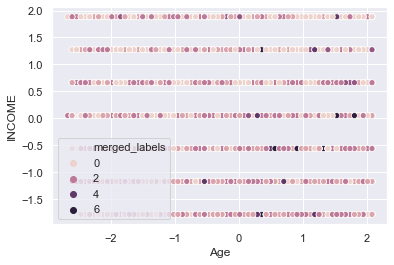

In [295]:
sns.scatterplot(x="Age", y="INCOME",data=donors_f, hue="merged_labels")

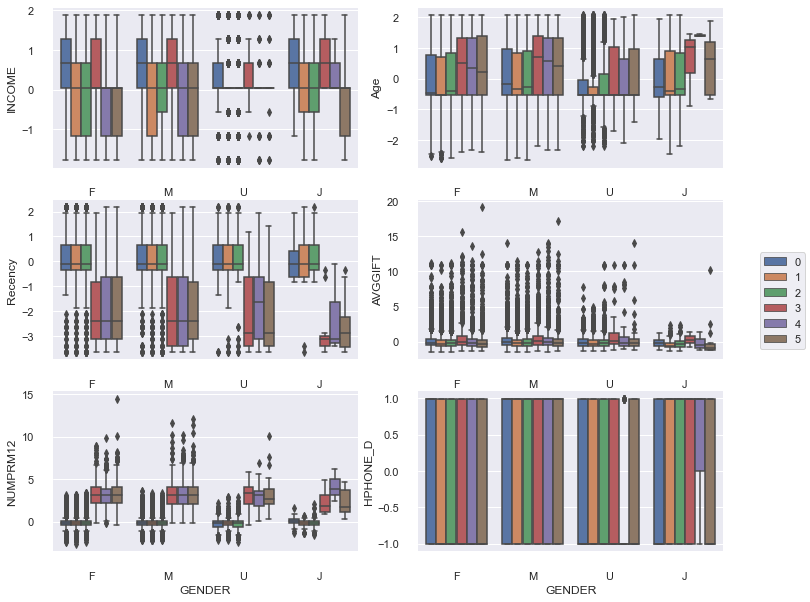

In [296]:
f, axes = plt.subplots(3, 2,figsize=(12,10))
ax1=sns.boxplot(x="GENDER", y="INCOME",hue="merged_labels",data=donors_f, ax=axes[0,0])
ax2=sns.boxplot(x="GENDER", y="Age",hue="merged_labels", data=donors_f, ax=axes[0,1])
ax3=sns.boxplot(x="GENDER", y="Recency",hue="merged_labels",data=donors_f, ax=axes[1,0])
ax4=sns.boxplot(x="GENDER", y='AVGGIFT',hue="merged_labels",data=donors_f, ax=axes[1,1])
ax5=sns.boxplot(x="GENDER", y='NUMPRM12', hue="merged_labels",data=donors_f, ax=axes[2,0])
ax6=sns.boxplot(x="GENDER", y='HPHONE_D',hue="merged_labels",data=donors_f, ax=axes[2,1])

handles, labels = ax1.get_legend_handles_labels()
plt.figlegend(handles, labels, loc='center right')
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()
ax4.get_legend().remove()
ax5.get_legend().remove()
ax6.get_legend().remove()

sns.despine(offset=10, trim=True)
plt.show()

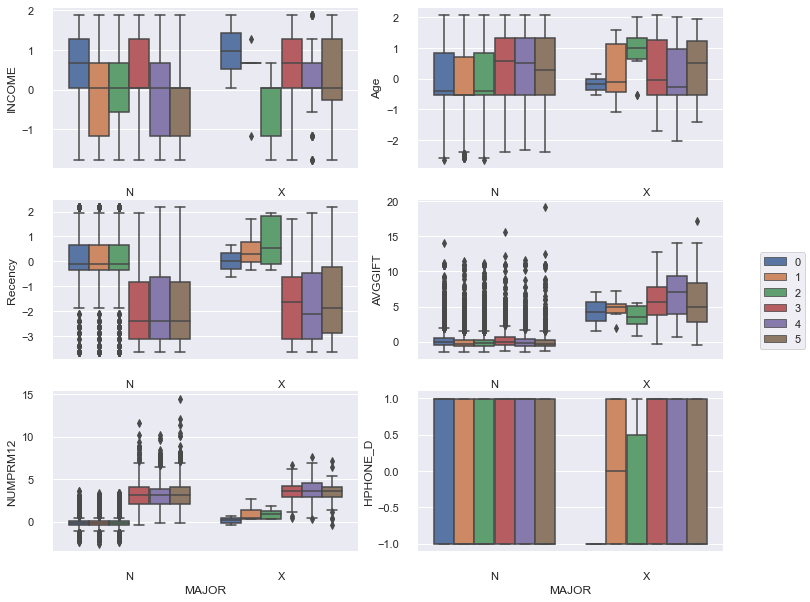

In [297]:
f, axes = plt.subplots(3, 2,figsize=(12,10))
ax1=sns.boxplot(x="MAJOR", y="INCOME",hue="merged_labels",data=donors_f, ax=axes[0,0])
ax2=sns.boxplot(x="MAJOR", y="Age",hue="merged_labels", data=donors_f, ax=axes[0,1])
ax3=sns.boxplot(x="MAJOR", y="Recency",hue="merged_labels",data=donors_f, ax=axes[1,0])
ax4=sns.boxplot(x="MAJOR", y='AVGGIFT',hue="merged_labels",data=donors_f, ax=axes[1,1])
ax5=sns.boxplot(x="MAJOR", y='NUMPRM12', hue="merged_labels",data=donors_f, ax=axes[2,0])
ax6=sns.boxplot(x="MAJOR", y='HPHONE_D',hue="merged_labels",data=donors_f, ax=axes[2,1])

handles, labels = ax1.get_legend_handles_labels()
plt.figlegend(handles, labels, loc='center right')
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()
ax4.get_legend().remove()
ax5.get_legend().remove()
ax6.get_legend().remove()

sns.despine(offset=10, trim=True)
plt.show()

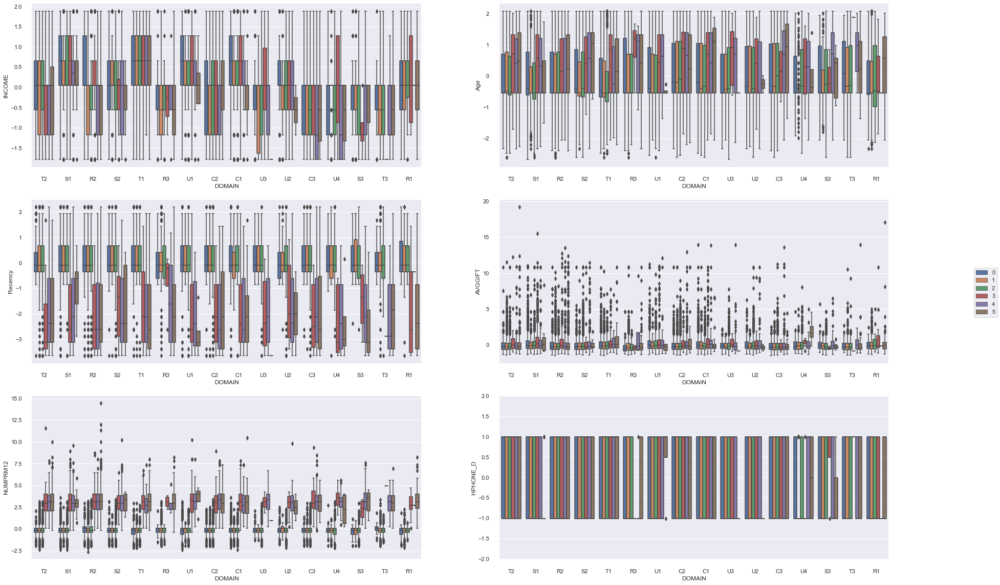

In [298]:
f, axes = plt.subplots(3, 2,figsize=(30,20))
ax1=sns.boxplot(x="DOMAIN", y="INCOME",hue="merged_labels",data=donors_f, ax=axes[0,0])

ax2=sns.boxplot(x="DOMAIN", y="Age",hue="merged_labels", data=donors_f, ax=axes[0,1])

plt.ylim(-2,2)
ax3=sns.boxplot(x="DOMAIN", y="Recency",hue="merged_labels",data=donors_f, ax=axes[1,0])

plt.ylim(-2,5)
ax4=sns.boxplot(x="DOMAIN", y='AVGGIFT',hue="merged_labels",data=donors_f, ax=axes[1,1])
plt.ylim(-2,5)

ax5=sns.boxplot(x="DOMAIN", y='NUMPRM12', hue="merged_labels",data=donors_f, ax=axes[2,0])
plt.ylim(-2,2)

ax6=sns.boxplot(x="DOMAIN", y='HPHONE_D',hue="merged_labels",data=donors_f, ax=axes[2,1])

handles, labels = ax1.get_legend_handles_labels()
plt.figlegend(handles, labels, loc='center right')
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()
ax4.get_legend().remove()
ax5.get_legend().remove()
ax6.get_legend().remove()

sns.despine(offset=10, trim=True)
plt.show()

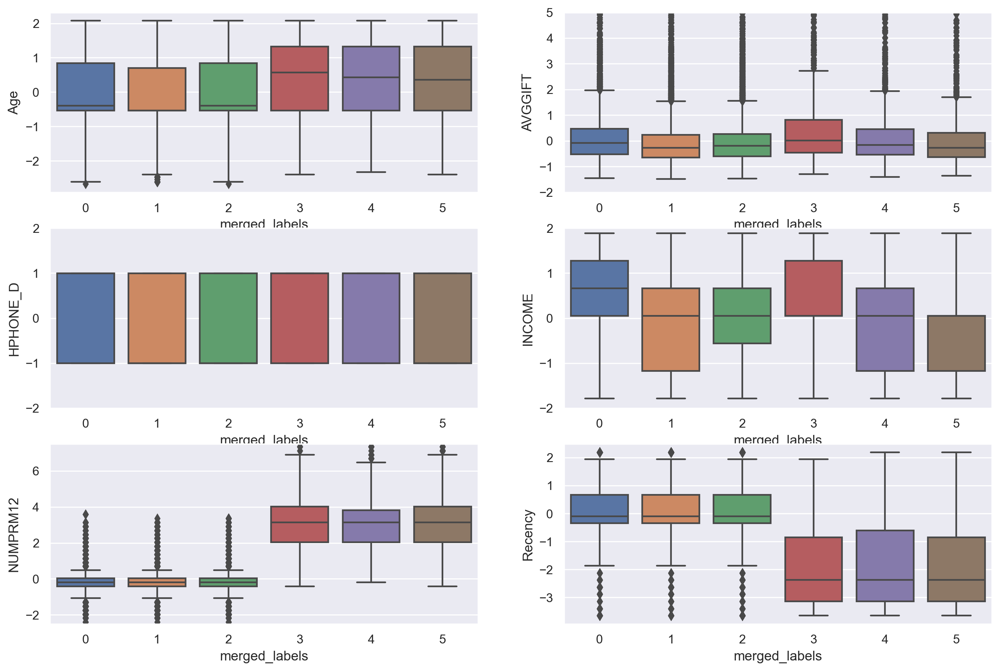

In [299]:
# plotting sub-plots to analyse the distribution of Donors Clusters

plt.figure(figsize=(15,10), dpi=200)

plt.subplot(3,2,1)
sns.boxplot(x='merged_labels', y='Age', data=donors_f)

plt.subplot(3,2,2)
sns.boxplot(x='merged_labels', y='AVGGIFT', data=donors_f)
plt.ylim(-2,5)

plt.subplot(3,2,3)
sns.boxplot(x='merged_labels', y='HPHONE_D', data=donors_f)
plt.ylim(-2,2)

plt.subplot(3,2,4)
sns.boxplot(x='merged_labels', y='INCOME', data=donors_f)
plt.ylim(-2,2)

plt.subplot(3,2,5)
sns.boxplot(x='merged_labels', y='NUMPRM12', data=donors_f)
plt.ylim(-2.5,7.5)

plt.subplot(3,2,6)
sns.boxplot(x='merged_labels', y='Recency', data=donors_f)

(-2.5, 2.5)

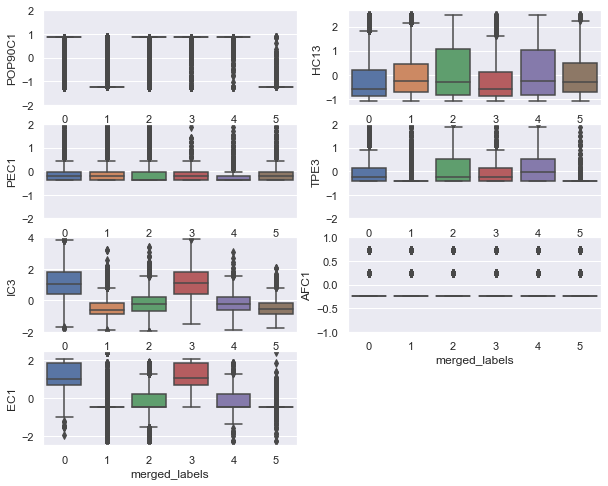

In [300]:
# plotting sub-plots to analyse the distribution of Donors Clusters

plt.figure(figsize=(10,8))

plt.subplot(4,2,1)
sns.boxplot(x='merged_labels', y='POP90C1', data=donors_f)
plt.ylim(-2,2)

plt.subplot(4,2,2)
sns.boxplot(x='merged_labels', y='HC13', data=donors_f)

plt.subplot(4,2,3)
sns.boxplot(x='merged_labels', y='PEC1', data=donors_f)
plt.ylim(-2,2)

plt.subplot(4,2,4)
sns.boxplot(x='merged_labels', y='TPE3', data=donors_f)
plt.ylim(-2,2)

plt.subplot(4,2,5)
sns.boxplot(x='merged_labels', y='IC3', data=donors_f)
plt.ylim(-2,4)

plt.subplot(4,2,6)
sns.boxplot(x='merged_labels', y='AFC1', data=donors_f)
plt.ylim(-1,1)

plt.subplot(4,2,7)
sns.boxplot(x='merged_labels', y='EC1', data=donors_f)
plt.ylim(-2.5,2.5)

(-5.0, 5.0)

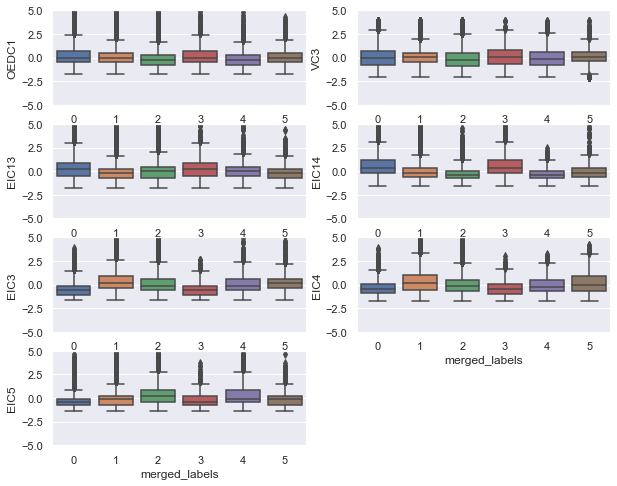

In [301]:
# plotting sub-plots to analyse the distribution of Donors Clusters

plt.figure(figsize=(10,8))

plt.subplot(4,2,1)
sns.boxplot(x='merged_labels', y='OEDC1', data=donors_f)
plt.ylim(-5,5)

plt.subplot(4,2,2)
sns.boxplot(x='merged_labels', y='VC3', data=donors_f)
plt.ylim(-5,5)

plt.subplot(4,2,3)
sns.boxplot(x='merged_labels', y='EIC13', data=donors_f)
plt.ylim(-5,5)

plt.subplot(4,2,4)
sns.boxplot(x='merged_labels', y='EIC14', data=donors_f)
plt.ylim(-5,5)

plt.subplot(4,2,5)
sns.boxplot(x='merged_labels', y='EIC3', data=donors_f)
plt.ylim(-5,5)

plt.subplot(4,2,6)
sns.boxplot(x='merged_labels', y='EIC4', data=donors_f)
plt.ylim(-5,5)

plt.subplot(4,2,7)
sns.boxplot(x='merged_labels', y='EIC5', data=donors_f)
plt.ylim(-5,5)

<hr>
<a class="anchor" id="comparing">
    
## 9.3. Comparing the cluster algorithms
    
</a>

In [335]:
X= donors[metric_features].copy()

For n_clusters = 2 The average silhouette_score is : 0.07869188071626558
For n_clusters = 3 The average silhouette_score is : 0.06445026063605751
For n_clusters = 4 The average silhouette_score is : 0.07513456579511878
For n_clusters = 5 The average silhouette_score is : 0.06934460202355008
For n_clusters = 6 The average silhouette_score is : 0.05003429306602459


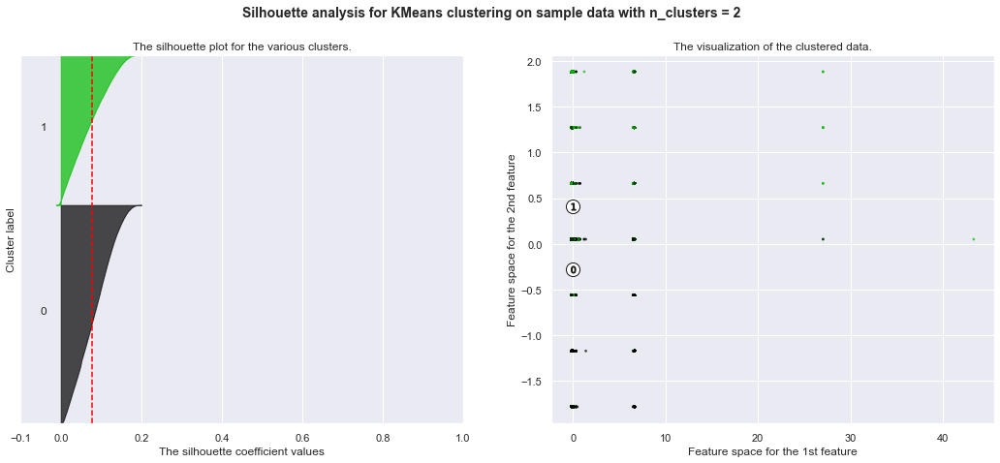

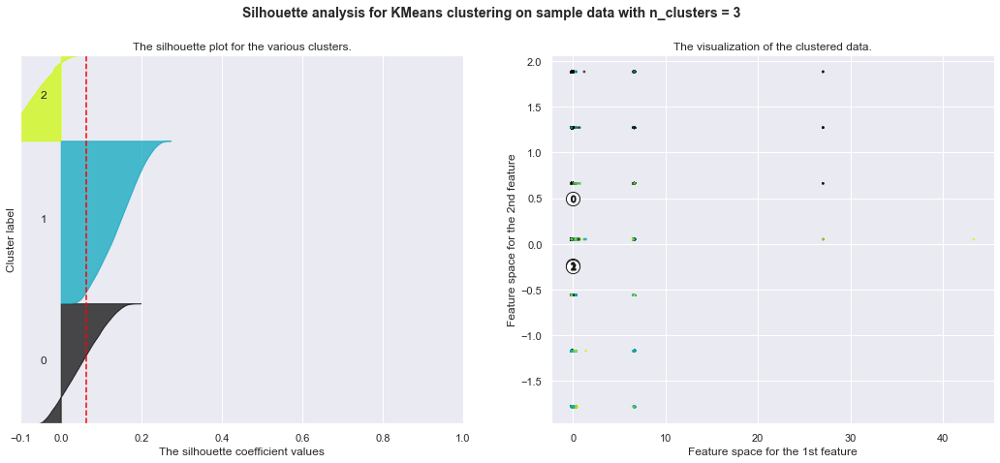

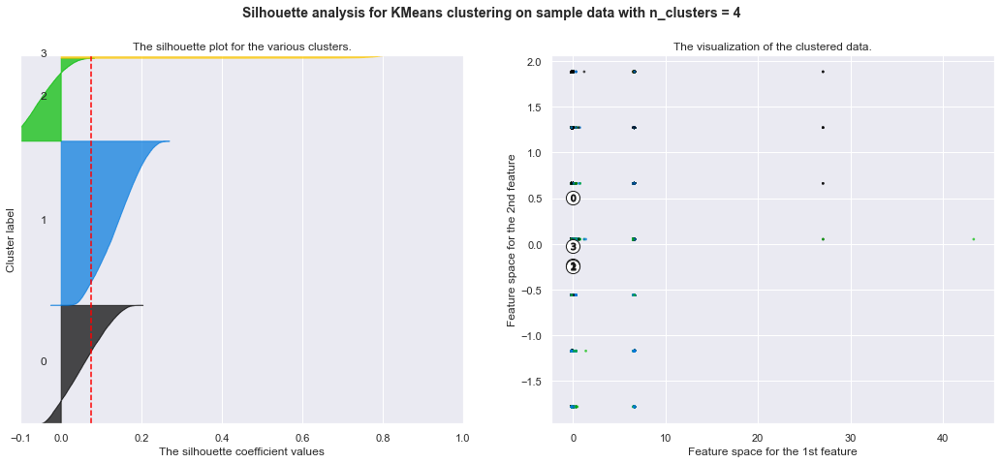

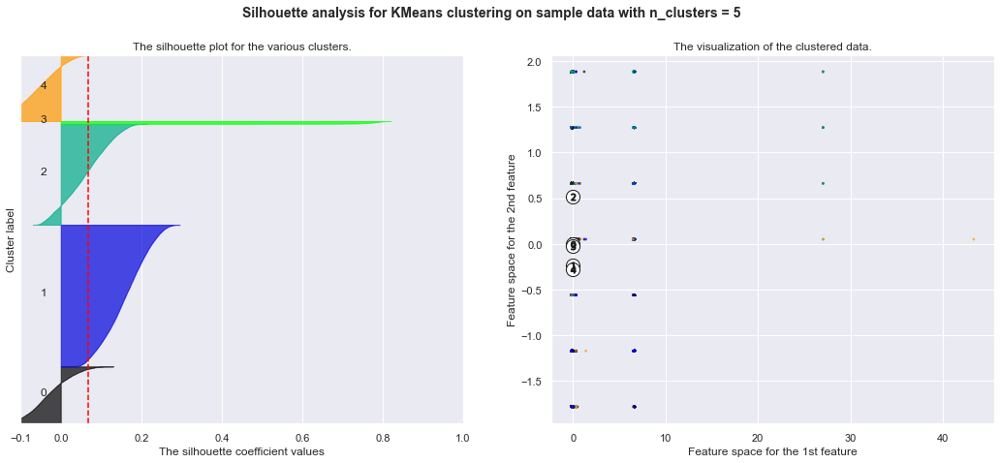

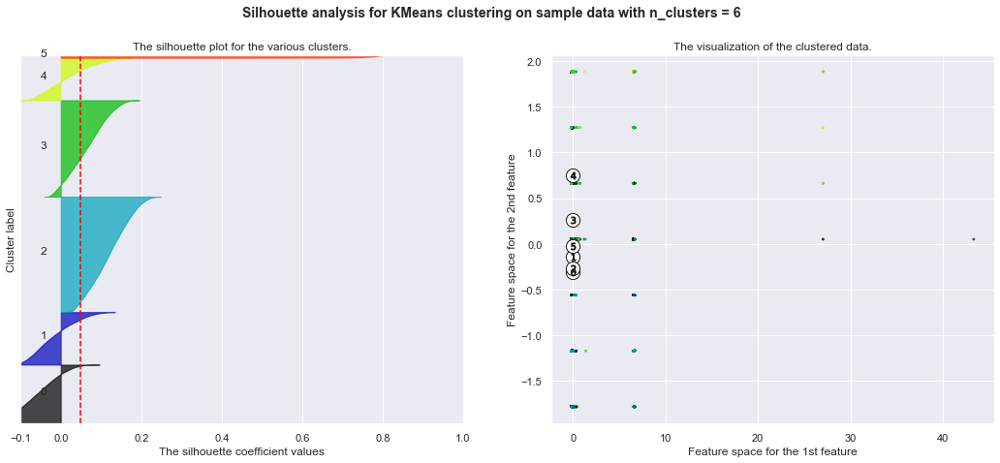

<Figure size 432x288 with 0 Axes>

In [336]:
import matplotlib.cm as cm
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X.iloc[:, 0], X.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [331]:
df_join=pd.concat([df_donf,df_neighf],axis=1)
X=df_join.copy()

For n_clusters = 2 The average silhouette_score is : 0.08945991224549595
For n_clusters = 3 The average silhouette_score is : 0.07829172082918892
For n_clusters = 4 The average silhouette_score is : 0.08215465213759485
For n_clusters = 5 The average silhouette_score is : 0.08400283222553019
For n_clusters = 6 The average silhouette_score is : 0.07846054686556286


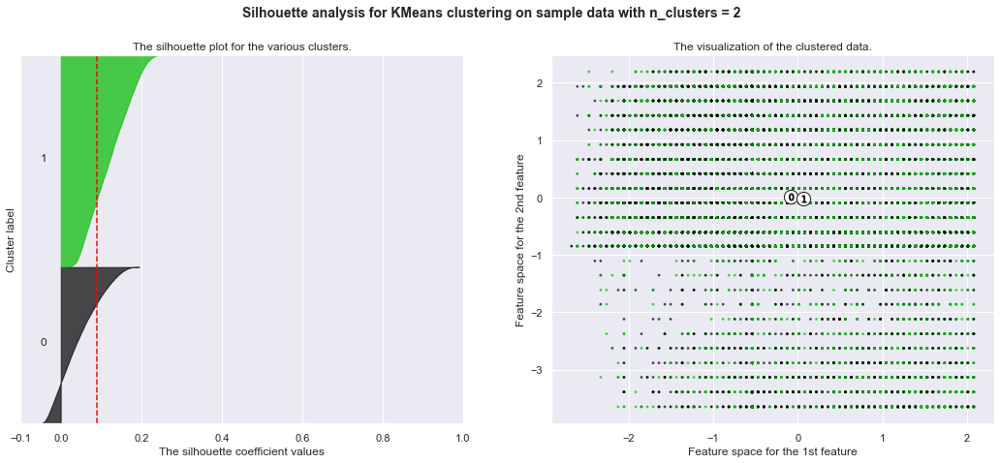

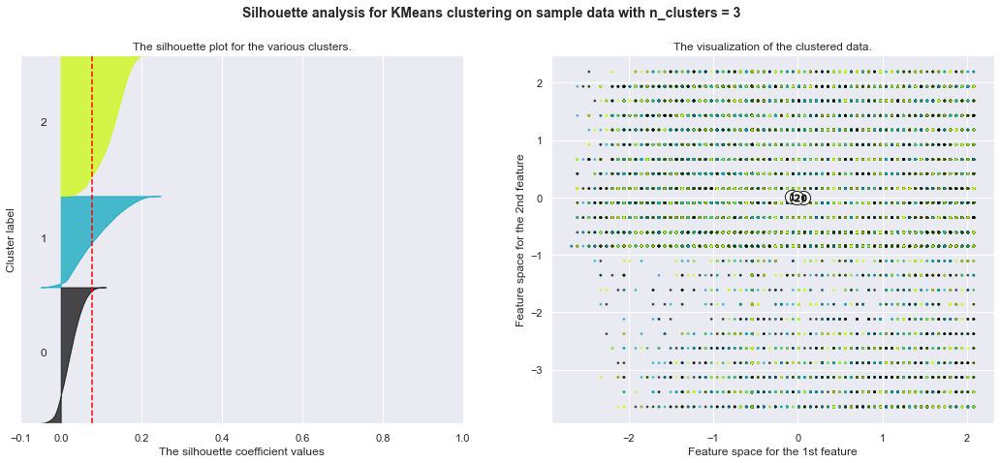

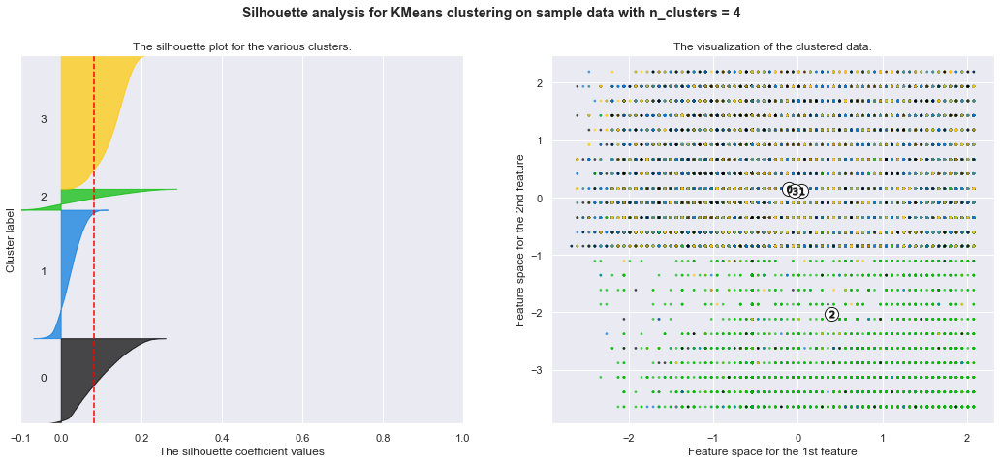

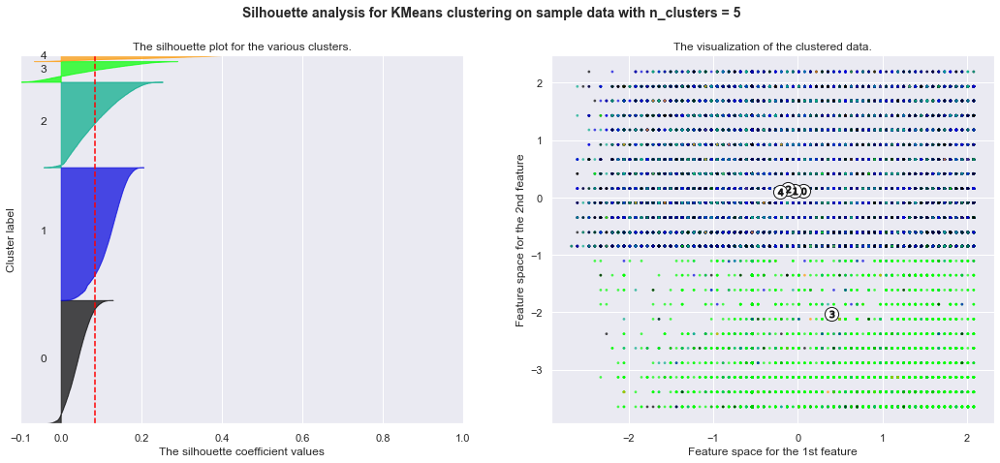

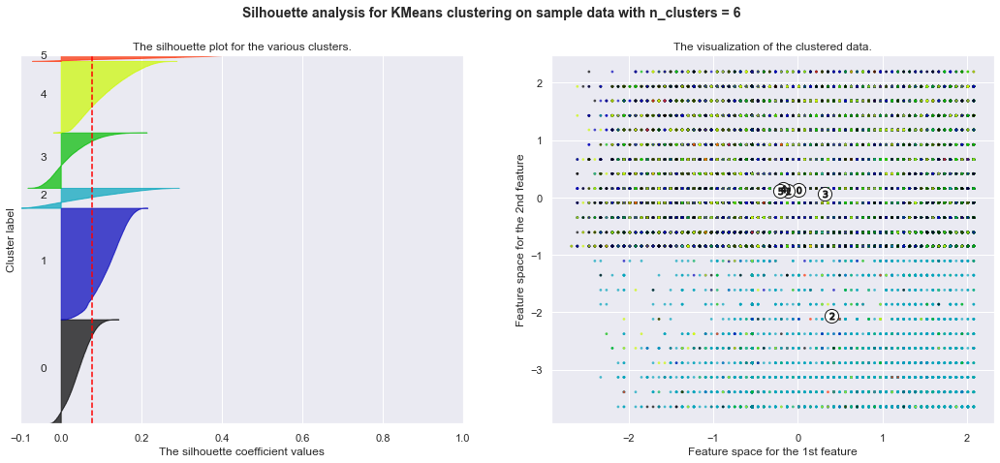

In [332]:
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X.iloc[:, 0], X.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

<hr>
<a class="anchor" id="kprototypes">
    
## 9.4. K-Prototypes
    
</a>

In [ ]:
# !pip install kmodes

In [305]:
donors.columns.tolist()

['OSOURCE',
 'TCODE',
 'STATE',
 'ZIP',
 'MAILCODE',
 'NOEXCH',
 'MDMAUD',
 'DOMAIN',
 'HOMEOWNR',
 'CHILD03',
 'CHILD07',
 'CHILD12',
 'CHILD18',
 'INCOME',
 'GENDER',
 'HIT',
 'DATASRCE',
 'MALEMILI',
 'MALEVET',
 'VIETVETS',
 'WWIIVETS',
 'LOCALGOV',
 'STATEGOV',
 'FEDGOV',
 'SOLP3',
 'SOLIH',
 'MAJOR',
 'WEALTH2',
 'COLLECT1',
 'VETERANS',
 'BIBLE',
 'CATLG',
 'HOMEE',
 'PETS',
 'CDPLAY',
 'STEREO',
 'PCOWNERS',
 'PHOTO',
 'CRAFTS',
 'FISHER',
 'GARDENIN',
 'BOATS',
 'WALKER',
 'KIDSTUFF',
 'CARDS',
 'PLATES',
 'PEPSTRFL',
 'POP901',
 'POP90C1',
 'POP90C2',
 'POP90C3',
 'POP90C4',
 'ETH2',
 'ETH3',
 'ETH4',
 'ETH5',
 'ETH6',
 'ETH7',
 'ETH8',
 'ETH9',
 'ETH10',
 'ETH11',
 'ETH13',
 'ETH14',
 'ETH16',
 'AGE904',
 'AGE907',
 'CHIL1',
 'CHIL2',
 'CHIL3',
 'AGEC1',
 'AGEC2',
 'AGEC3',
 'AGEC4',
 'AGEC5',
 'AGEC6',
 'AGEC7',
 'CHILC1',
 'CHILC2',
 'CHILC3',
 'CHILC4',
 'CHILC5',
 'HHAGE2',
 'HHN1',
 'HHN2',
 'HHN3',
 'MARR1',
 'MARR2',
 'MARR4',
 'DW3',
 'DW4',
 'DW7',
 'DW8',
 'DW9',
 

In [306]:
#Get index of the non_metric_variables
lista_proto=[]
for x in donors.columns:
    if x in non_metric_features:
        donors[x] = donors[x].astype(str)
        index_no = donors.columns.get_loc(x) 
        lista_proto.append(index_no)
print(lista_proto)

[0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 16, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 295, 297, 299, 300, 305, 306, 307, 308]


In [307]:
# Converting the dataset into matrix
X = donors.values
X

array([['GRI', -0.16143089552125967, 'IL', ..., 'C', 0.22058450863325982,
        -0.09296552336314706],
       ['BOA', -0.15463299792287938, 'CA', ..., 'A', -0.8126155174941695,
        -0.09296552336314706],
       ['AMH', -0.15463299792287938, 'NC', ..., 'C', -0.537095510526855,
        -0.09296552336314706],
       ...,
       ['DCD', -0.15463299792287938, 'TX', ..., 'A', -0.6748555140105122,
        -0.8489388162193033],
       ['MBC', -0.15463299792287938, 'MI', ..., 'B', 0.1517045068914312,
        -2.62672216425466],
       ['PRV', -0.16143089552125967, 'CA', ..., 'A',
        0.013944503407773937, -3.391002855933411]], dtype=object)

In [308]:
# Running K-Prototype clustering
kproto = KPrototypes(n_clusters=4, init='Huang', random_state=0, n_init=10,n_jobs=-1,verbose=1)

In [309]:
clusters = kproto.fit_predict(X, categorical=lista_proto)

Best run was number 6


In [310]:
#Visualize K-Prototype clustering 
X_df=pd.DataFrame(X,columns=donors.columns)
X_df['Cluster_id']=clusters
print(X_df['Cluster_id'].value_counts())

3    35635
2    27285
0    18261
1     9322
Name: Cluster_id, dtype: int64


In [311]:
X_df.head()

,OSOURCE,TCODE,STATE,ZIP,MAILCODE,NOEXCH,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,...,AVGGIFT,CONTROLN,HPHONE_D,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Age,Recency,Cluster_id
0,GRI,-0.161431,IL,61081,O,0,XXXX,T2,U,N,...,-0.682168,0.00217842,-1.00606,X,X,X,C,0.220585,-0.0929655,3
1,BOA,-0.154633,CA,91326,O,0,XXXX,S1,H,N,...,0.308558,0.963193,-1.00606,X,X,X,A,-0.812616,-0.0929655,2
2,AMH,-0.154633,NC,27017,O,0,XXXX,R2,U,N,...,-0.714729,-1.45578,0.993974,X,X,X,C,-0.537096,-0.0929655,3
3,BRY,-0.161431,CA,95953,O,0,XXXX,R2,U,N,...,-0.798363,1.39859,0.993974,X,X,X,C,0.840505,-0.0929655,0
4,MBC,-0.161431,FL,33176,O,0,XXXX,S2,H,N,...,-0.791816,-1.60017,0.993974,X,X,X,A,1.39154,-0.350495,0


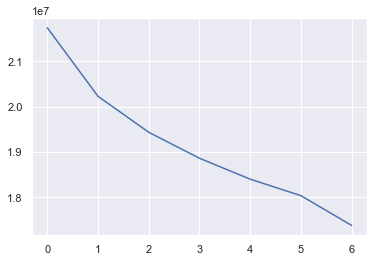

In [312]:
#Choosing optimal K
cost = []
for num_clusters in list(range(1,8)):
    kproto = KPrototypes(n_clusters=num_clusters, init='HUANG', n_init=1, random_state=0)
    kproto.fit_predict(X,  categorical=lista_proto)
    cost.append(kproto.cost_)

plt.plot(cost)

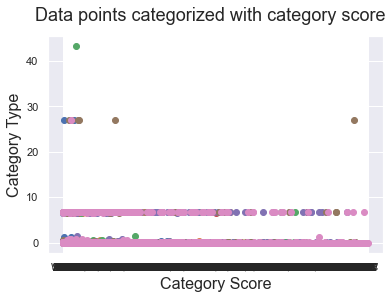

In [313]:
# Plot the results
for i in set(kproto.labels_):
    index = kproto.labels_ == i
    plt.plot(X[index, 0], X[index, 1], 'o')
    plt.suptitle('Data points categorized with category score', fontsize=18)
    plt.xlabel('Category Score', fontsize=16)
    plt.ylabel('Category Type', fontsize=16)
plt.show()

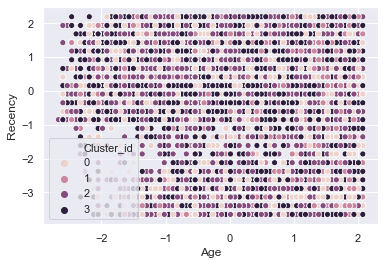

In [314]:
sns.scatterplot(x="Age",y="Recency",hue="Cluster_id",data=X_df)

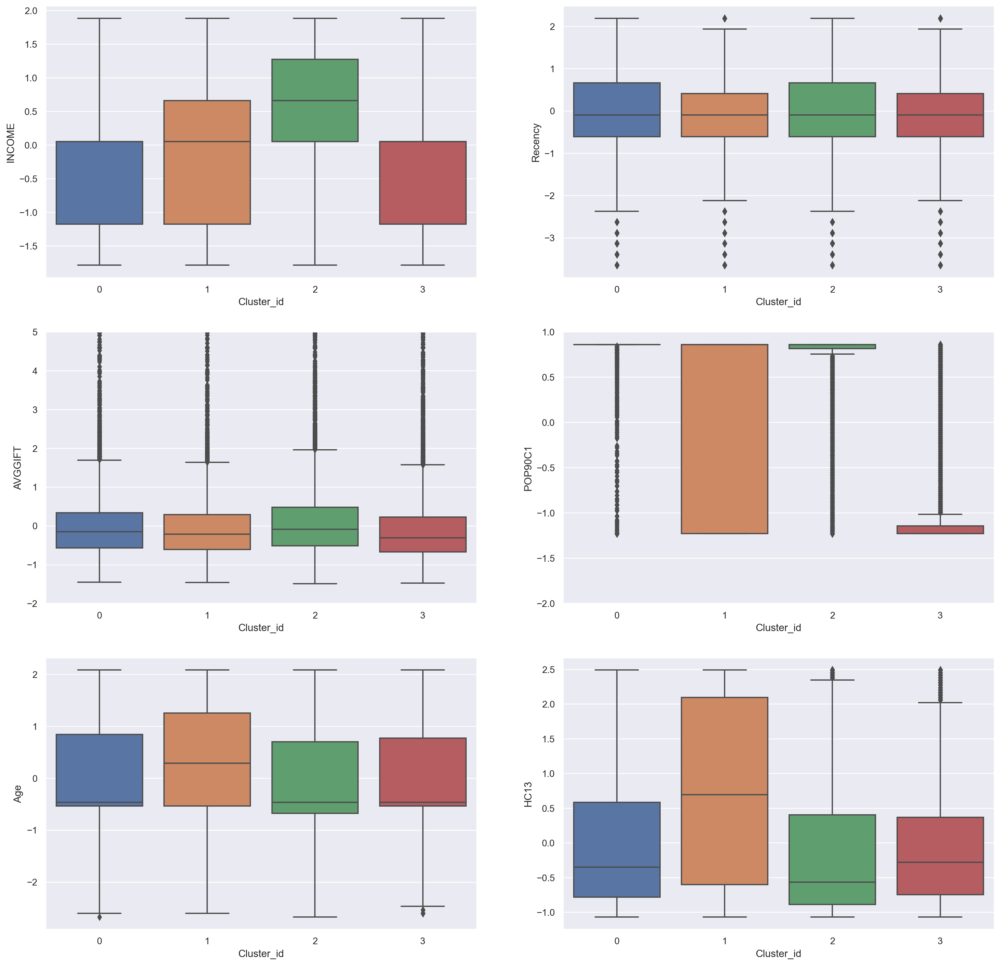

In [315]:
# plotting sub-plots to analyse the results

plt.figure(figsize=(20,20), dpi=200)

plt.subplot(3,2,1)
sns.boxplot(x='Cluster_id', y='INCOME', data=X_df)

plt.subplot(3,2,2)
sns.boxplot(x='Cluster_id', y='Recency', data=X_df)

plt.subplot(3,2,3)
sns.boxplot(x='Cluster_id', y='AVGGIFT', data=X_df)
plt.ylim(-2,5)

plt.subplot(3,2,4)
sns.boxplot(x='Cluster_id', y='POP90C1', data=X_df)
plt.ylim(-2,1)

plt.subplot(3,2,5)
sns.boxplot(x='Cluster_id', y='Age', data=X_df)

plt.subplot(3,2,6)
sns.boxplot(x='Cluster_id', y='HC13', data=X_df)


(-1.0, 2.0)

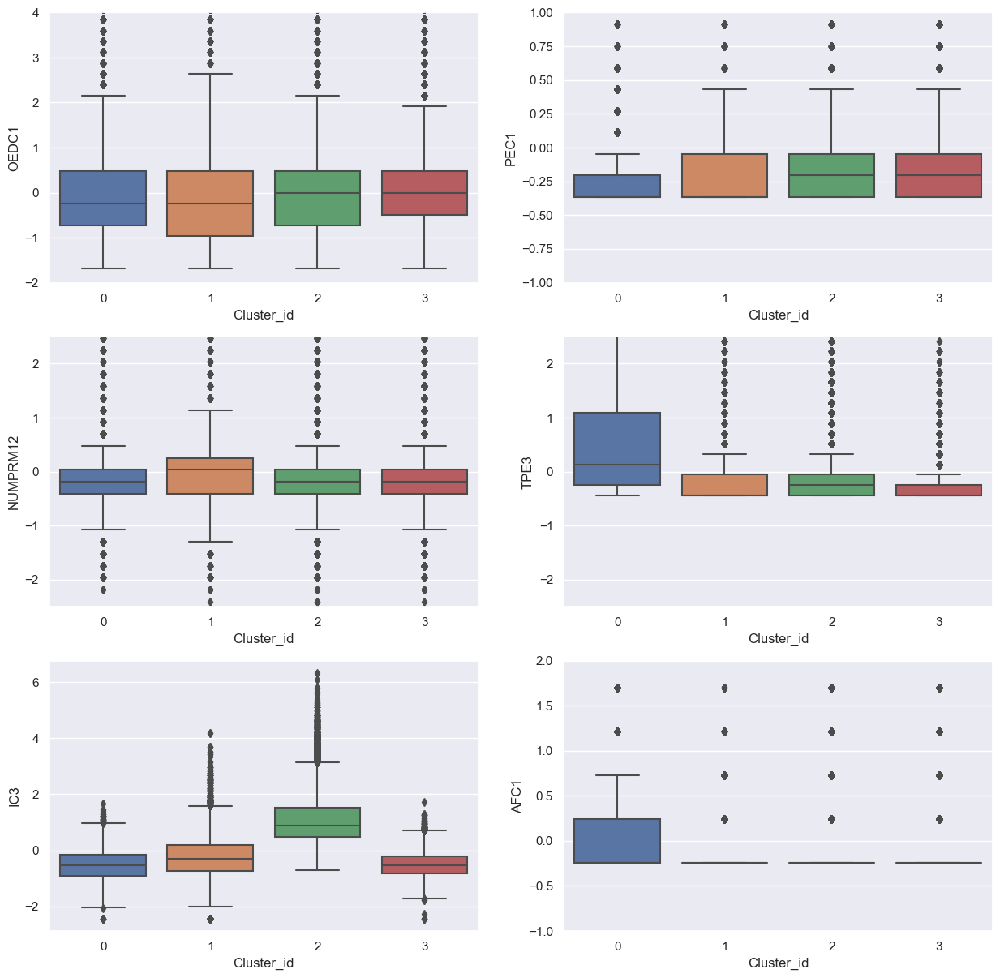

In [316]:
# plotting sub-plots to analyse the results

plt.figure(figsize=(15,15), dpi=100)

plt.subplot(3,2,1)
sns.boxplot(x='Cluster_id', y='OEDC1', data=X_df)
plt.ylim(-2,4)

plt.subplot(3,2,2)
sns.boxplot(x='Cluster_id', y='PEC1', data=X_df)
plt.ylim(-1,1)

plt.subplot(3,2,3)
sns.boxplot(x='Cluster_id', y='NUMPRM12', data=X_df)
plt.ylim(-2.5,2.5)

plt.subplot(3,2,4)
sns.boxplot(x='Cluster_id', y='TPE3', data=X_df)
plt.ylim(-2.5,2.5)

plt.subplot(3,2,5)
sns.boxplot(x='Cluster_id', y='IC3', data=X_df)

plt.subplot(3,2,6)
sns.boxplot(x='Cluster_id', y='AFC1', data=X_df)
plt.ylim(-1,2)

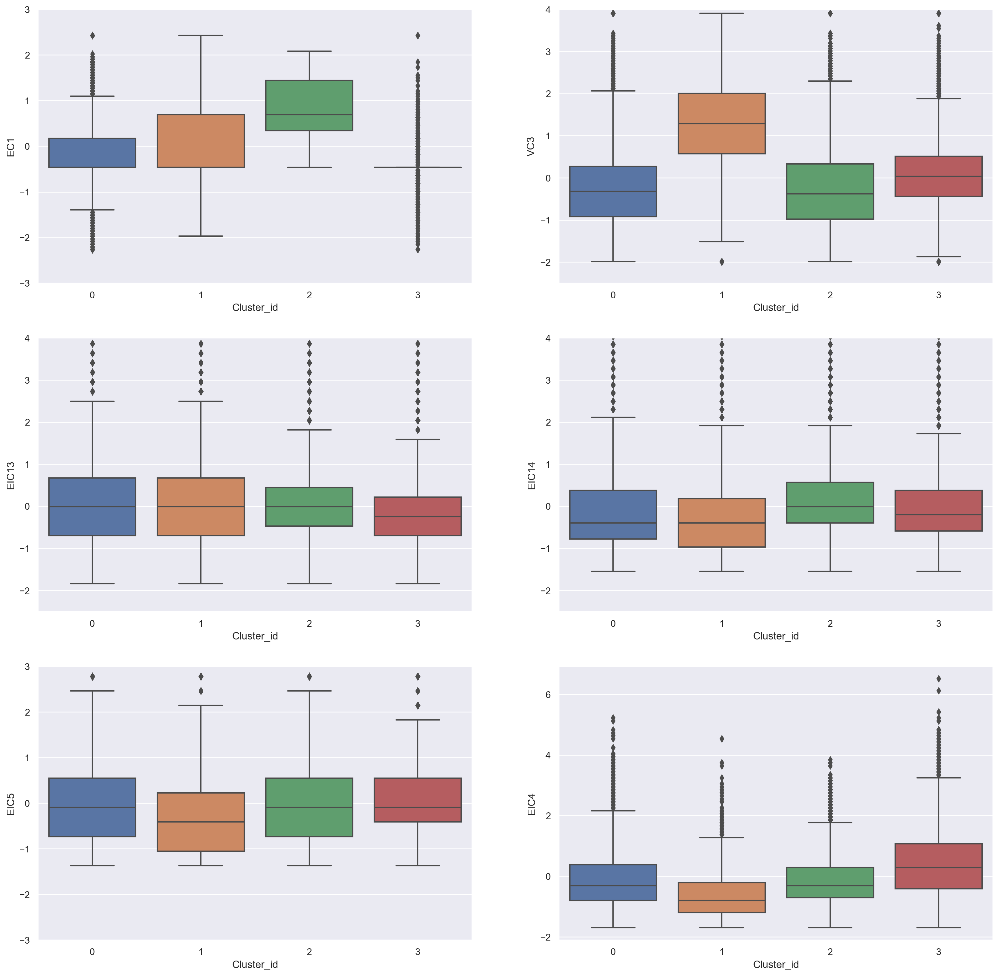

In [317]:
# plotting sub-plots to analyse the results

plt.figure(figsize=(20,20), dpi=200)

plt.subplot(3,2,1)
sns.boxplot(x='Cluster_id', y='EC1', data=X_df)
plt.ylim(-3,3)

plt.subplot(3,2,2)
sns.boxplot(x='Cluster_id', y='VC3', data=X_df)
plt.ylim(-2.5,4)

plt.subplot(3,2,3)
sns.boxplot(x='Cluster_id', y='EIC13', data=X_df)
plt.ylim(-2.5,4)

plt.subplot(3,2,4)
sns.boxplot(x='Cluster_id', y='EIC14', data=X_df)
plt.ylim(-2.5,4)

plt.subplot(3,2,5)
sns.boxplot(x='Cluster_id', y='EIC5', data=X_df)
plt.ylim(-3,3)

plt.subplot(3,2,6)
sns.boxplot(x='Cluster_id', y='EIC4', data=X_df)

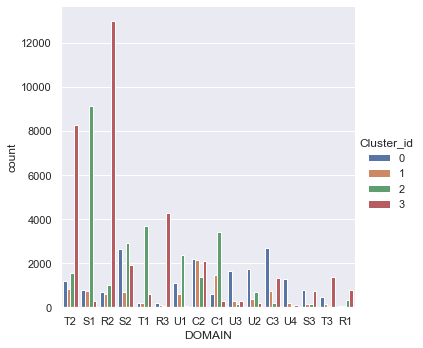

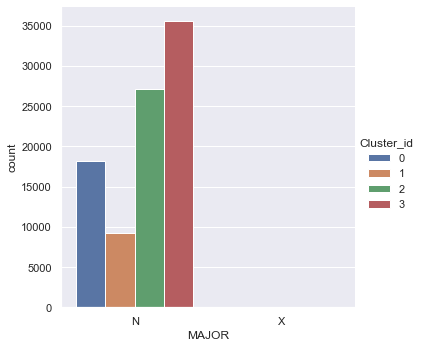

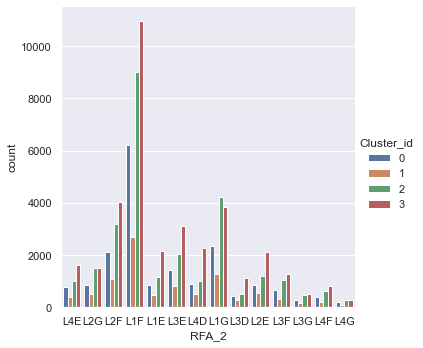

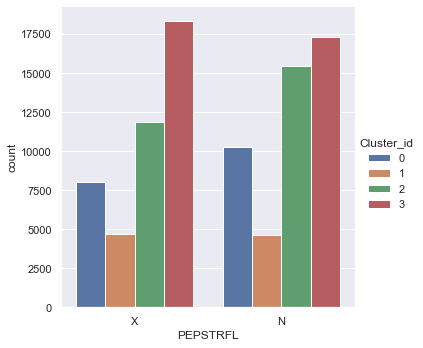

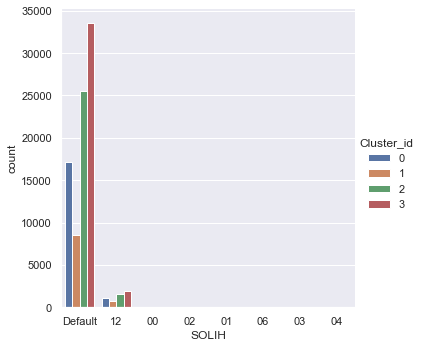

In [318]:
sns.catplot(hue='Cluster_id', x='DOMAIN', kind="count",data=X_df)
sns.catplot(hue='Cluster_id', x='MAJOR', kind="count",data=X_df)
sns.catplot(hue='Cluster_id', x='RFA_2', kind="count",data=X_df)
sns.catplot(hue='Cluster_id', x='PEPSTRFL', kind="count",data=X_df)
sns.catplot(x='SOLIH',hue="Cluster_id", kind="count", data=X_df)

<hr>
<a class="anchor" id="tsne">
    
## 9.5. T-SNE
    
</a>

In [319]:
X_embedded = TSNE(n_components=2,perplexity=5, n_jobs=-1).fit_transform(donors_f[metric_features])
X_embedded.shape

(90503, 2)

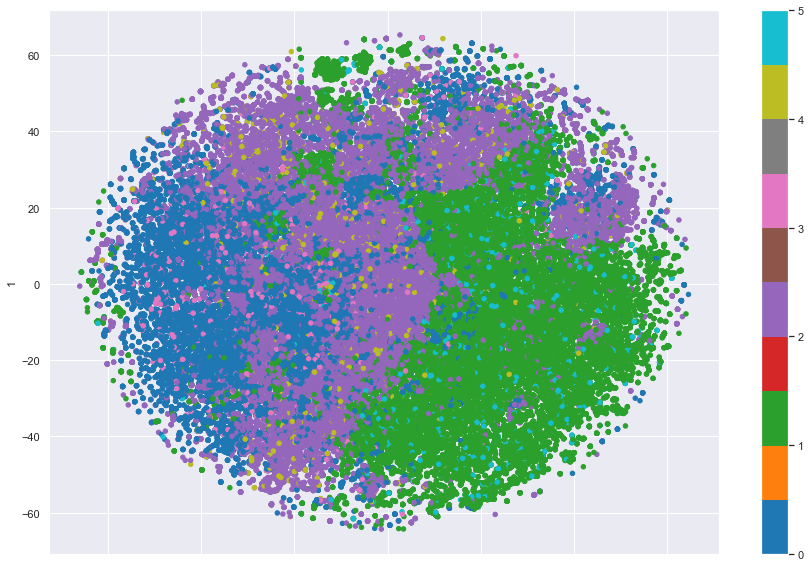

In [320]:
# t-SNE visualization
pd.DataFrame(X_embedded).plot.scatter(x=0, y=1, c=donors_f['merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()

<hr>
<a class="anchor" id="classification">
    
# 10. Outliers Classification
    
</a>

In [321]:
X = X_df.drop(columns={"Cluster_id"})
X=X[metric_features]
y =  X_df.loc[:, 'Cluster_id'] # Target variable

In [322]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0,stratify=y) # 70% training and 30% test

# Create Decision Tree classifer object
clf = DecisionTreeClassifier(random_state=0, max_depth=3)

# Train Decision Tree Classifer
clf = clf.fit(X_train, y_train)

In [323]:
# Test accuracy
print("It is estimated that in average, we are able to predict {0:.2f}% of the donors correctly".format(clf.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 81.08% of the donors correctly


In [324]:
labels_out = clf.predict(df_outliers[metric_features]) # predicting to which cluster each outlier belongs
df_out=df_outliers[metric_features].copy()
df_out["cluster_label"] = labels_out
df_out.head()

,TCODE,INCOME,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,...,MINRAMNT,MAXRAMNT,LASTGIFT,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,Age,Recency,cluster_label
30,0,4.0,0,1,37,58,16,8,1,5,...,2.0,10.0,7.0,9.0,6.181818,190313,1,49,548,2
35,1,4.0,0,1,38,37,28,7,2,3,...,10.0,15.0,14.0,11.0,12.312500,209,0,49,548,3
48,1,4.0,0,0,0,0,0,0,0,0,...,20.0,22.0,22.0,11.0,21.000000,118016,0,67,548,2
77,0,6.0,0,0,34,20,54,2,3,1,...,5.0,17.0,10.0,21.0,11.000000,156378,0,69,578,2
81,0,7.0,0,0,23,65,9,5,1,2,...,5.0,10.0,10.0,8.0,8.750000,116325,1,53,609,2


In [325]:
print(df_out['cluster_label'].value_counts())

2    3691
3     171
1      40
Name: cluster_label, dtype: int64
